# Notebook to compute the LSST's passbands and the impact of the atmospheric parameters on the colors of reference sources 

In this notebook we are going to take the reference spectra from the pysynphot's spectral atlases and make them pass through the LSST's throughput and the simulated atmospheres from the previous notebooks. 

This notebook requires [pysynphot](https://pysynphot.readthedocs.io/en/latest/) 

# Load necessary packages 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import pysynphot as S
from scipy.interpolate import interp1d
from astropy.io import fits

# allow interactive plots
#%matplotlib widget

In [2]:
S.refs.showref()

graphtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/57g1733im_tmg.fits
 comptable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/5as18041m_tmc.fits
thermtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/3241637sm_tmt.fits
      area: 45238.93416
   waveset: Min: 500, Max: 26000, Num: 10000, Delta: None, Log: True


# Set LSST's parameters 

In [3]:
WLMIN=3400. # Minimum wavelength : PySynPhot works with Angstrom
WLMAX=10600. # Minimum wavelength : PySynPhot works with Angstrom

NBINS=int(WLMAX-WLMIN) # Number of bins between WLMIN and WLMAX
BinWidth=(WLMAX-WLMIN)/float(NBINS) # Bin width in Angstrom
WL=np.linspace(WLMIN,WLMAX,NBINS)   # Array of wavelength in Angstrom
# from key numbers
Reff=642.3/2. # effective radius in cm
Seff= np.pi*Reff**2  # in cm2
print(Seff)
exptime=30.0

324015.4546769212


In [4]:
S.refs.setref(area=Seff, waveset=None) # set by default to 6.4230 m effective aperture 
S.refs.set_default_waveset(minwave=WLMIN, maxwave=WLMAX, num=NBINS, delta=BinWidth, log=False)
S.refs.showref()

graphtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/57g1733im_tmg.fits
 comptable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/5as18041m_tmc.fits
thermtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/3241637sm_tmt.fits
      area: 324015.4546769212
   waveset: Min: 3400.0, Max: 10600.0, Num: None, Delta: 1.0, Log: False


# Define general paths 

In [5]:
outdir_plots0 = 'output_plots/'
if os.path.exists(outdir_plots0)==False:
    os.mkdir(outdir_plots0)
outdir_files = 'output_files/'
if os.path.exists(outdir_files)==False:
    os.mkdir(outdir_files)

# Define paths to spectral atlases 

In [6]:
pysynphot_root_path=os.environ['PYSYN_CDBS']
path_dict = {
    'calspec':os.path.join(pysynphot_root_path,'calspec'),
    'bpgs':os.path.join(pysynphot_root_path,'grid/bpgs'),
    'jacoby':os.path.join(pysynphot_root_path,'grid/jacobi'),
    'pickles':os.path.join(pysynphot_root_path,'grid/pickles/dat_uvk')
}

atlas_dir = 'spectral_atlases/'
file_dict = {
    'calspec':'',
    'bpgs':os.path.join(atlas_dir,'atlas_bpgs.txt'),
    'jacoby':os.path.join(atlas_dir,'atlas_jacoby.txt'),
    'pickles':os.path.join(atlas_dir,'atlas_pickles.txt')
}


# Select a spectral atlas 

Options: 
* calspec (HST calibration spectra): work in progress, need to separate stars from AGNs and other sources 
* bpgs (Bruzual-Persson-Gunn-Stryker): 175 spectra 
* jacobi (Jacoby-Hunter-Christian): 161 spectra 
* pickles (Pickles): 131 spectra 

In [7]:
atlas_name = 'pickles'

atlas_path = path_dict[atlas_name]
atlas_file = file_dict[atlas_name]

# Find the spectra files and information 

In [8]:
#path_sed_calspec=os.path.join(pysynphot_root_path,'calspec')
atlas_seds = pd.read_csv(atlas_file)
atlas_seds

,File,Type,Teff,Name
0,pickles_uk_1.fits,O5V,39810.70,unknown
1,pickles_uk_2.fits,O9V,35481.40,unknown
2,pickles_uk_3.fits,B0V,28183.80,unknown
3,pickles_uk_4.fits,B1V,22387.20,unknown
4,pickles_uk_5.fits,B3V,19054.60,unknown
...,...,...,...,...
126,pickles_uk_127.fits,G8I,4591.98,unknown
127,pickles_uk_128.fits,K2I,4255.98,unknown
128,pickles_uk_129.fits,K3I,NaN,unknown
129,pickles_uk_130.fits,K4I,3990.25,unknown


# Load with pysynphot the spectra from the selected atlas 

In [9]:
sed_list = np.array(atlas_seds['File'])

In [10]:
sed_dict = {}
type_dict = {}
for i,sed in enumerate(sed_list):
    #print('-------')
    #print(sed)
    spec_ = S.FileSpectrum(os.path.join(atlas_path,sed))
    sed_dict[sed[:-5]] = spec_
    type_dict[sed[:-5]] = atlas_seds['Type'][i]

# Define also the spectral types 

In [11]:
spectral_types = ['O','B','A','F','G','K','M']

<img align="center" src = Stellar_Classification_Chart.png width=750 style="padding: 10px"> 

https://upload.wikimedia.org/wikipedia/commons/3/37/Stellar_Classification_Chart.png

# Organise spectra by spectral type 

In [12]:
spec_by_type = {}
for i in range(len(spectral_types)):
    spec_type = spectral_types[i]
    
    type_list_ = []
    spec_by_type[spec_type] = []
    for sed_ in type_dict.keys():
        if spec_type in type_dict[sed_]:
            type_list_.append(type_dict[sed_])
            spec_by_type[spec_type].append(sed_dict[sed_])
    print(spec_type, type_list_)
    print(len(type_list_))
    print('-----------')

O ['O5V', 'O9V', 'O8III']
3
-----------
B ['B0V', 'B1V', 'B3V', 'B57V', 'B8V', 'B9V', 'B2IV', 'B6IV', 'B12III', 'B3III', 'B5III', 'B9III', 'B2II', 'B5II', 'B0I', 'B1I', 'B3I', 'B5I', 'B8I']
19
-----------
A ['A0V', 'A2V', 'A3V', 'A5V', 'A7V', 'A0IV', 'A47IV', 'A0III', 'A3III', 'A5III', 'A7III', 'A0I', 'A2I']
13
-----------
F ['F0V', 'F2V', 'F5V', 'wF5V', 'F6V', 'rF6V', 'F8V', 'wF8V', 'rF8V', 'F02IV', 'F5IV', 'F8IV', 'F0III', 'F2III', 'F5III', 'F0II', 'F2II', 'F0I', 'F5I', 'F8I']
20
-----------
G ['G0V', 'wG0V', 'rG0V', 'G2V', 'G5V', 'wG5V', 'rG5V', 'G8V', 'G0IV', 'G2IV', 'G5IV', 'G8IV', 'G0III', 'G5III', 'wG5III', 'rG5III', 'G8III', 'wG8III', 'G5II', 'G0I', 'G2I', 'G5I', 'G8I']
23
-----------
K ['K0V', 'rK0V', 'K2V', 'K3V', 'K4V', 'K5V', 'K7V', 'K0IV', 'K1IV', 'K3IV', 'K0III', 'wK0III', 'rK0III', 'K1III', 'wK1III', 'rK1III', 'K2III', 'wK2III', 'rK2III', 'K3III', 'wK3III', 'rK3III', 'K4III', 'wK4III', 'rK4III', 'K5III', 'rK5III', 'K01II', 'K34II', 'K2I', 'K3I', 'K4I']
32
-----------
M [

Now we can plot them by spectral type separately 

In [13]:
type_colors = {'O':'b','B':'dodgerblue','A':'cyan','F':'g','G':'gold','K':'r','M':'brown'}

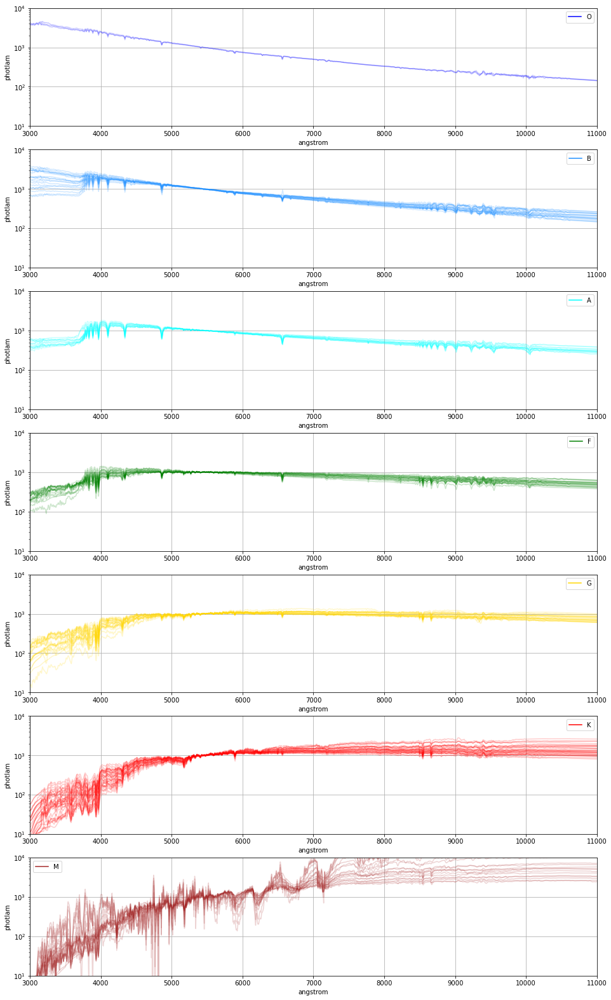

In [14]:
num_rows = len(spectral_types)
fig, axs = plt.subplots(num_rows, 1, figsize=(16,28))

for row,st in enumerate(spectral_types):
    for spec in spec_by_type[st]:
        spec.convert('photlam')
        axs[row].plot(spec.wave,spec.flux,color=type_colors[st],alpha=0.2)
    axs[row].plot([],[],label=st,color=type_colors[st])
    axs[row].grid()
    #axs[row].set_yscale("log")
    axs[row].set_xlabel(spec.waveunits)
    axs[row].set_ylabel(spec.fluxunits)
    axs[row].legend()
    axs[row].set_xlim(3000,11000)
    axs[row].set_ylim(10,10000)
    axs[row].set_yscale("log")
            

# Load LSST's throughput 

https://github.com/lsst/throughputs/tree/main/baseline

In [15]:
throughput_path = 'data/lsst/'
throughput_label = 'hardware_{0}.dat'

In [16]:
filters = ['u','g','r','i','z','Y']
filter_names = {0:'u',1:'g',2:'r',3:'i',4:'z',5:'Y'}
filter_colors = {0:'b',1:'g',2:'r',3:'orange',4:'k',5:'grey'}

Write the throughputs in pysynphot format 

In [17]:
lsst_bp = []
for f in filters:
    throughput_ = np.loadtxt(throughput_path+throughput_label.format(f.lower()))
    wl = throughput_[:,0]*10.
    lsst_bp.append(S.ArrayBandpass(wl, throughput_[:,1] , name=f))


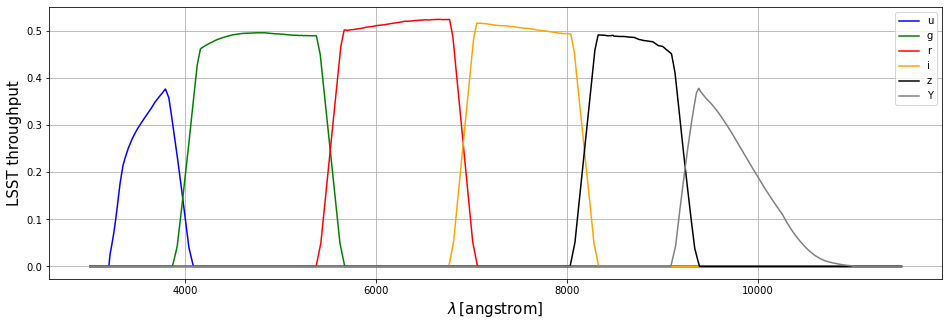

In [18]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
for index in range(len(lsst_bp)):
    ax.plot(lsst_bp[index].wave,lsst_bp[index].throughput,label=filter_names[index],color=filter_colors[index])
    
ax.grid()
plt.xlabel('$\\lambda \, [$'+str(lsst_bp[0].waveunits)+']',fontsize=15)
plt.ylabel('LSST throughput',fontsize=15)
plt.legend()

In [19]:
for filter in lsst_bp:
    assert (filter.wave==lsst_bp[0].wave).all()

In [20]:
wl_lsst = lsst_bp[0].wave

# Load simulated transparencies 

Select variable parameter and specify airmass and clouds 

In [21]:
variable_param = 'aerosol'
am0 = 1.2
cloud0 = 0.0

Specify which distribution follows the simulated parameter. Options: 
* linear_distribution-discrete: generated following a linear function and with pre-established step (e.g., PWV = 1.0, 2.0, 3.0, ....) 
* linear_distribution-continuous: generated following a linear function and specifying only the value range and number of simulations (e.g., PWV = 1.0, 1.25, 1.5, ....) 
* uniform_distribution: generated following a uniform random distribution (work in progress) 
* specific_distribution: generated following random distributions specific to each parameter (work in progress) 


In [22]:
param_dist = 'linear_distribution-discrete'

In [23]:
outdir_plots_ = os.path.join('output_plots/',param_dist.split('-')[0])
if os.path.exists(outdir_plots_)==False:
    os.mkdir(outdir_plots_)

outdir_plots = os.path.join('output_plots/',param_dist.replace('-','/'))
if os.path.exists(outdir_plots)==False:
    os.mkdir(outdir_plots)

In [24]:
if variable_param=='airmass' or variable_param=='cloud':
    t_file = 'simulated_transparencies_varying_{0}.fits'.format(variable_param)
    t_file_ref = 'simulated_transparencies_varying_{0}_ref.fits'.format(variable_param)
else:
    t_file = 'simulated_transparencies_varying_{0}_airmass_{1}_cloud_{2}.fits'.format(variable_param,am0,cloud0)
    t_file_ref = 'simulated_transparencies_varying_{0}_airmass_{1}_cloud_{2}_ref.fits'.format(variable_param,am0,cloud0)

t_path = os.path.join('./simulated_transparencies/',param_dist.replace('-','/'))
t_in = os.path.join(t_path,t_file)
t_in_ref = os.path.join(t_path,t_file_ref)
t = fits.open(t_in)
t_ref = fits.open(t_in_ref)

In [25]:
head = t[0].header
data = t[0].data
print(data.shape)
data_ref = t_ref[0].data
print(data_ref.shape)

(10, 956)
(2, 956)


In [26]:
n_atmp = head['ID_RES']
n_sim = head['NTRANSP']
print(n_atmp, n_sim)

5 9


In [27]:
wl_t = data[0][n_atmp:]*10.

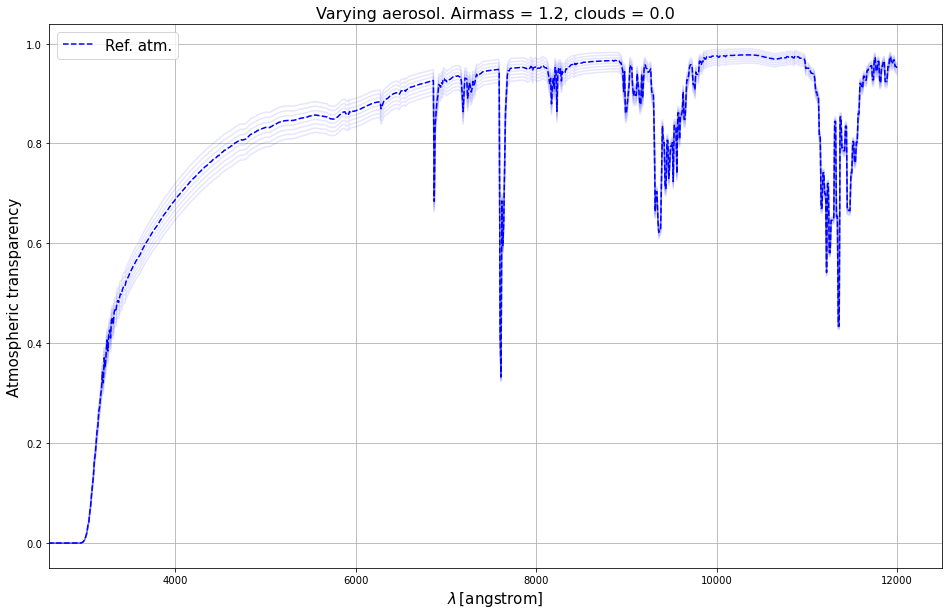

In [28]:
fig=plt.figure(figsize=(16,10))
ax = fig.add_subplot(111)
for atm_i in range(1,n_sim):
    ax.plot(wl_t,data[atm_i][n_atmp:],color='b',alpha=0.1)
ax.plot(wl_t,data_ref[1][n_atmp:],ls='--',color='b',label='Ref. atm.')
plt.xlim(2600.,12500.)
plt.grid()
plt.xlabel('$\\lambda \,$'+'[angstrom]',fontsize=15)
plt.ylabel('Atmospheric transparency',fontsize=15)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
plt.legend(fontsize=15)
plt.savefig(os.path.join(outdir_plots,'atm_transparencies_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

# Check range of values of variable parameter 

In [29]:
print(head)

SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -64 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                  956                                                  NAXIS2  =                   10                                                  NTRANSP =                    9                                                  ID_AM   =                    4                                                  ID_VAOD =                    1                                                  ID_PWV  =                    0                                                  ID_O3   =                    2                                                  ID_CLD  =                    3                                                  ID_RES  =                    5                                                  END                                     

In [30]:
params_index = {'pwv':0,'aerosol':1,'ozone':2,'cloud':3,'airmass':4}

In [31]:
var_index = params_index[variable_param]

In [32]:
#data[1:,1]
print(data[1:,var_index])

[0.01 0.02 0.03 0.04 0.05 0.06 0.07 0.08 0.09]


# Select data for variable parameter of these simulations 

In [33]:
atm_vals = data[1:,var_index]

In [34]:
np.save('output_files/atm_vals_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),atm_vals)

# Convert simulated transparencies into pysynphot format 

In [35]:
atm_transp = []
for i in range(1,n_sim+1):
    finterp_i = interp1d(wl_t,data[i][n_atmp:],bounds_error=False,fill_value=0.)
    atm_interp_i = finterp_i(wl_lsst)
    #atm_i = S.ArrayBandpass(wl_t,data[i][n_atmp:], name='Atm. transp. {0}'.format(i))
    atm_i = S.ArrayBandpass(wl_lsst,atm_interp_i, name='Atm. transp. {0}'.format(i))
    atm_transp.append(atm_i)

In [36]:
finterp_ref = interp1d(wl_t,data_ref[1][n_atmp:],bounds_error=False,fill_value=0.)
atm_interp_ref = finterp_ref(wl_lsst)
#atm_i = S.ArrayBandpass(wl_t,data[i][n_atmp:], name='Atm. transp. {0}'.format(i))
atm_transp_ref = S.ArrayBandpass(wl_lsst,atm_interp_ref, name='Atm. transp. {0}'.format(i))

# Compute total bandpass (atmosphere(s) x LSST throughput) 

In [37]:
total_passband = {}
#for bpname in filters:
#    total_passband[bpname] = []

for index,bp in enumerate(lsst_bp):
    total_passband[filters[index]] = []
    for i in range(n_sim):
        total_pass = bp*atm_transp[i]
        total_passband[bp.name].append(total_pass)

In [38]:
total_passband_ref = {}
for index,bp in enumerate(lsst_bp):
    total_pass = bp*atm_transp_ref
    total_passband_ref[bp.name] = total_pass

In [39]:
print(len(total_passband['u']))
print(total_passband['u'][0])

9
(u * Atm. transp. 1)


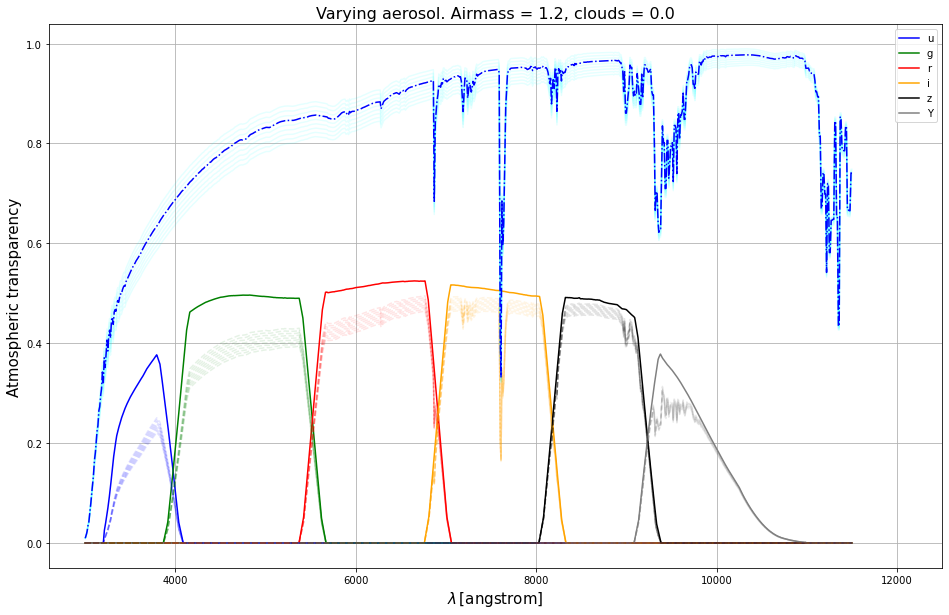

In [40]:
fig=plt.figure(figsize=(16,10))
ax = fig.add_subplot(111)
for index,bp in enumerate(lsst_bp):
    ax.plot(bp.wave,bp.throughput,label=filter_names[index],color=filter_colors[index])

for isim in range(n_sim):
    ax.plot(atm_transp[isim].wave,atm_transp[isim].throughput,alpha=0.1,color='cyan')
    for index,bpname in enumerate(filters):
        ax.plot(total_passband[bpname][isim].wave,total_passband[bpname][isim].throughput,ls='--',color=filter_colors[index],alpha=0.1)        
ax.plot(atm_transp_ref.wave,atm_transp_ref.throughput,ls='-.',color='b')        
plt.xlim(2600.,12500.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(atm_transp_ref.waveunits)+']',fontsize=15)
plt.ylabel('Atmospheric transparency',fontsize=15)
plt.legend()
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'total_passbands_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

Plot the atmospheric transparencies corresponding to the minimum and maximum atmospheric parameter that we are varying: 

In [41]:
min_val_ = np.min(atm_vals)
max_val_ = np.max(atm_vals)
print(min_val_,max_val_)

0.01 0.09


In [42]:
min_ind_ = np.where(atm_vals==min_val_)[0][0]
max_ind_ = np.where(atm_vals==max_val_)[0][0]

In [43]:
min_transp = data[1+min_ind_,n_atmp:]
max_transp = data[1+max_ind_,n_atmp:]

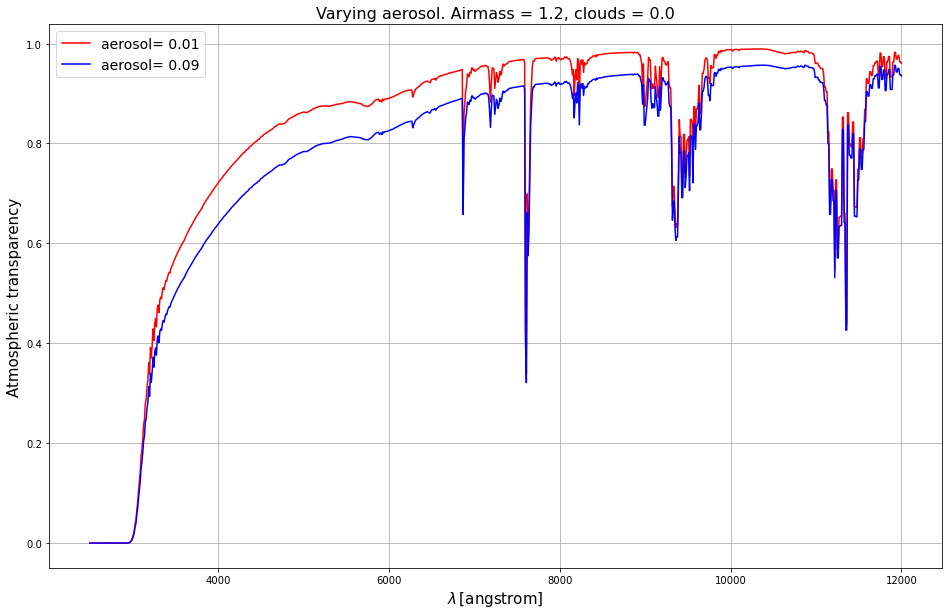

In [44]:
fig=plt.figure(figsize=(16,10))
plt.plot(wl_t,min_transp,color='r',label=variable_param+'= {0:.2f}'.format(min_val_))
plt.plot(wl_t,max_transp,color='b',label=variable_param+'= {0:.2f}'.format(max_val_))
plt.xlabel('$\\lambda \, [$'+str(atm_transp_ref.waveunits)+']',fontsize=15)
plt.ylabel('Atmospheric transparency',fontsize=15)
plt.grid()
plt.legend(fontsize=14)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'atm_transparencies_varying_{0}_airmass_{1}_clouds_{2}_min_max_values.png'.format(variable_param,am0,cloud0)))

# Calculate fluxes through total passbands 

Let's start with one spectrum of a type A star as example 

In [45]:
# Example with one spectrum 
test_type = 'A'
test_spec = 0
example_spec = spec_by_type[test_type][test_spec]

In [46]:
# It seems this galaxy is a small enough place to end up choosing again, just by coincidence, Vega as example star 
vega = S.Vega
vega.convert('photlam')

photlam


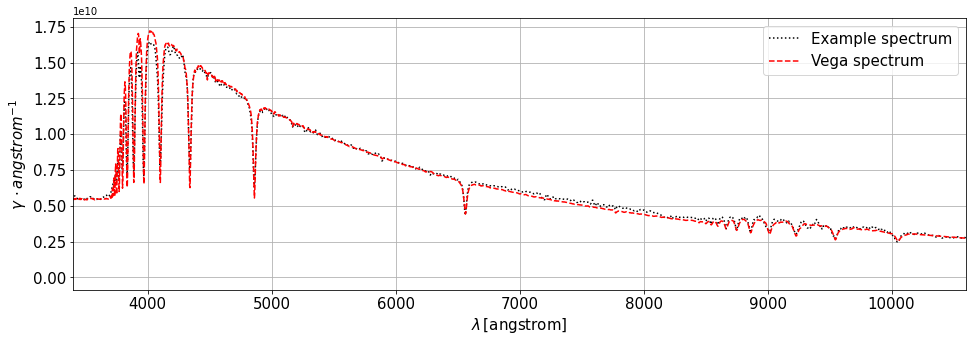

In [47]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,ls=':',color='k',alpha=1.0,label='Example spectrum')
plt.plot(vega.wave,vega.flux*Seff*exptime,ls='--',color='r',alpha=1.0,label='Vega spectrum')
plt.xlim(WLMIN,WLMAX)
plt.xlabel('$\\lambda \, [$'+str(example_spec.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.grid()
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
print(spec.fluxunits)

Let's make the example spectrum pass through the atmosphere and through the total passband (atm. x throughput) 

In [48]:
obsatm_dict = {}
for isim in range(n_sim):
    obsatm_dict[isim] = []
    obsatm = S.Observation(example_spec,atm_transp[isim],force='taper')
    obsatm_dict[isim] = obsatm

obstotal_dict = {}
for filter in filters:
    obstotal_dict[filter] = []

#for filter in lsst_bp:
for filter in filters:
    #print(filter.name.upper())
    for i in range(n_sim):
        #total_pass = filter*atm_transp[i]
        #obs = S.Observation(spec,total_pass,force='taper')
        obstotal = S.Observation(example_spec,total_passband[filter][i],force='taper')
        obstotal_dict[filter].append(obstotal)

(Atm. transp. 1) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 2) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 3) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 4) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 5) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 6) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 7) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 8) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 9) does not have a defined

u
g
r
i
z
Y
photlam


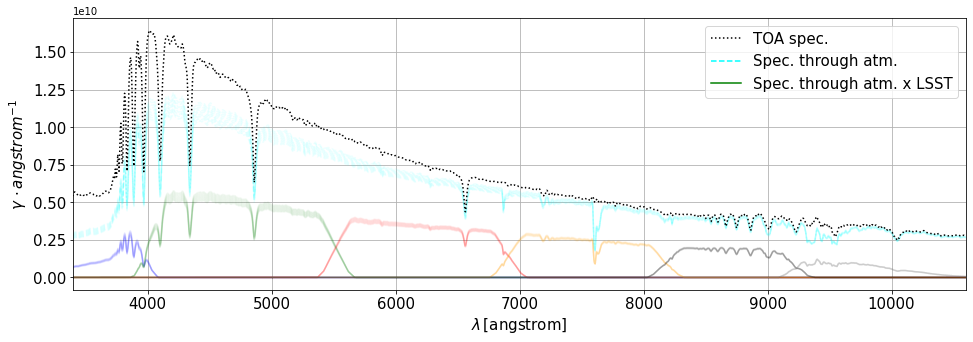

In [49]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
for isim in range(n_sim):
    obsatm = obsatm_dict[isim]
    ax.plot(obsatm.binwave,obsatm.binflux*Seff*exptime,ls='--',color='cyan',alpha=0.07)

for index,filter in enumerate(obstotal_dict.keys()):
    print(filter)
    for obs in obstotal_dict[filter]:
        ax.plot(obs.binwave,obs.binflux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.05)
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,ls=':',color='k',alpha=1.0)
plt.xlim(WLMIN,WLMAX)
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.grid()
plt.plot([],[],ls=':',color='k',label='TOA spec.')
plt.plot([],[],ls='--',color='cyan',label='Spec. through atm.')
plt.plot([],[],ls='-',color='g',label='Spec. through atm. x LSST')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
print(spec.fluxunits)

This was an example of how the spectrum looks like when passing only through the atmosphere and through the total passbands. For our calibration purposes, what we actually want is to have the spectra passing through either only the troughput (as if the telescope was on space) and through the total passband (ground-based telescope). Now let's pass all spectra through the throughput and through the atmosphere x throughput 

In [50]:
# Spectra through atm x throughput 
obs_dict = {}
#for sed_ in list(sed_dict.keys()):
for st in spectral_types:
    print(st)
    obs_dict_ = {}
    for si,spec in enumerate(spec_by_type[st]):
        filter_dict_ = {}
        for filter in filters:
            filter_dict_[filter] = []
            for i in range(n_sim):
                obs_spec = S.Observation(spec,total_passband[filter][i],force='taper')
                filter_dict_[filter].append(obs_spec)
        obs_dict_[si] = filter_dict_ 
    obs_dict[st] = obs_dict_


O
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used

((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

In [51]:
print(len(sed_dict.keys()))
print(len(obs_dict.keys()))
print(len(obs_dict[test_type].keys()))
#print(len(obs_dict[example_spec].keys()))
print(len(obs_dict[test_type][test_spec].keys()))
print(len(obs_dict[test_type][test_spec]['u']))
print(n_sim)

131
7
13
6
9
9


In [52]:
# Spectra only through throughput (as if telescope was in space) 
obs_dict_t = {}
for st in spectral_types:
    print(st)
    obs_dict_t_ = {}
    for si,spec in enumerate(spec_by_type[test_type]):
        filter_dict_ = {}
        for filter in lsst_bp:
            obs_spec_t = S.Observation(spec,filter,force='taper')
            filter_dict_[filter.name] = obs_spec_t
        obs_dict_t_[si] = filter_dict_ 
    obs_dict_t[st] = obs_dict_t_
    

O
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset 

In [53]:
print(len(sed_dict.keys()))
print(len(obs_dict_t.keys()))
print(len(obs_dict_t[test_type].keys()))
print(len(obs_dict_t[test_type][test_spec].keys()))

131
7
13
6


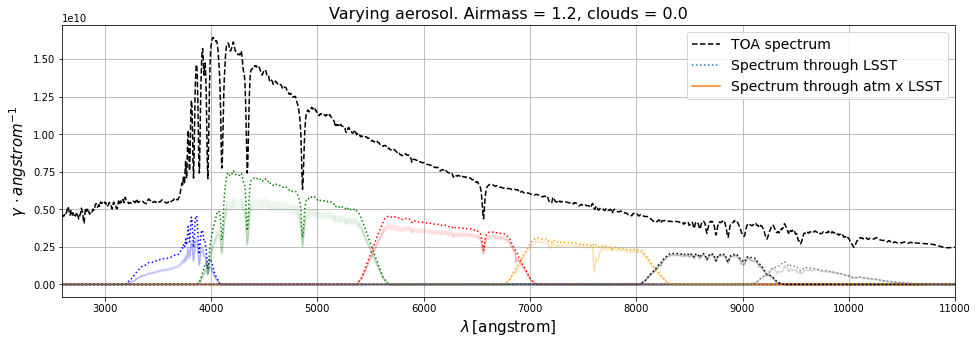

In [54]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
#sed_dict[example_spec].convert('photlam')
spec_by_type[test_type][test_spec].convert('photlam')
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(obs_dict_t[test_type][test_spec][filter].wave,obs_dict_t[test_type][test_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = obs_dict[test_type][test_spec][filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)

plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'example_spectrum_toa_throughput_total_passband_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

Now we look at the same information but restricted to the most extreme atmospheric parameter values:

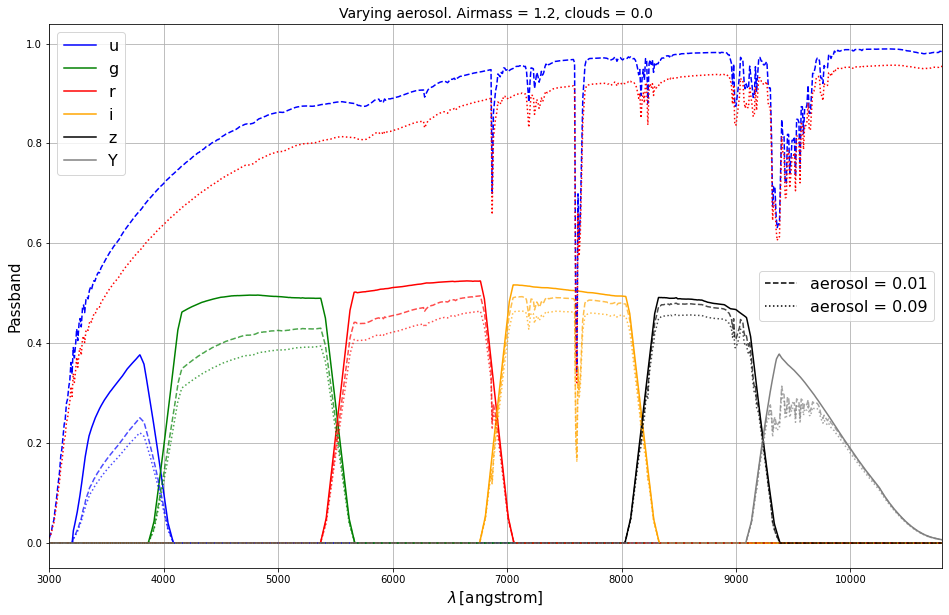

In [55]:
fig=plt.figure(figsize=(16,10))
ax = fig.add_subplot(111)
legend_lines1 = []
for index,bp in enumerate(lsst_bp):
    line_, = ax.plot(bp.wave,bp.throughput,label=filter_names[index],color=filter_colors[index])
    legend_lines1.append(line_)

ax.plot(atm_transp[min_ind_].wave,atm_transp[min_ind_].throughput,ls='--',alpha=1.0,color='b')
ax.plot(atm_transp[max_ind_].wave,atm_transp[max_ind_].throughput,ls=':',alpha=1.0,color='r')

for index,bpname in enumerate(filters):
    ax.plot(total_passband[bpname][min_ind_].wave,total_passband[bpname][min_ind_].throughput,ls='--',color=filter_colors[index],alpha=0.7)
    ax.plot(total_passband[bpname][max_ind_].wave,total_passband[bpname][max_ind_].throughput,ls=':',color=filter_colors[index],alpha=0.7)        
line1, = plt.plot([],[],ls='--',color='k',label='{0} = {1}'.format(variable_param,min_val_))
line2, = plt.plot([],[],ls=':',color='k',label='{0} = {1}'.format(variable_param,max_val_))
legend_lines2 = [line1,line2]
plt.xlim(3000.,10800.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(atm_transp_ref.waveunits)+']',fontsize=15)
plt.ylabel('Passband',fontsize=15)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=14)
legend1 = plt.legend(handles=legend_lines1,fontsize=16,loc="upper left")
plt.gca().add_artist(legend1)
plt.legend(handles=legend_lines2,fontsize=16,loc="center right")
plt.savefig(os.path.join(outdir_plots,'total_passbands_min_max_varying_{0}_airmass_{1}_cloud_{2}.png'.format(variable_param,am0,cloud0)))

u
g
r
i
z
Y
photlam


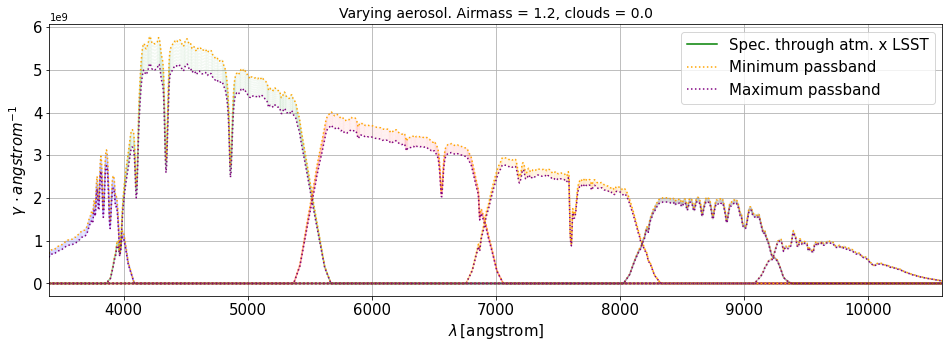

In [56]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)

for index,filter in enumerate(obstotal_dict.keys()):
    print(filter)
    for obs in obstotal_dict[filter]:
        ax.plot(obs.binwave,obs.binflux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.05)
    ax.plot(obstotal_dict[filter][min_ind_].binwave,obstotal_dict[filter][min_ind_].binflux*Seff*exptime,ls=':',color='orange')
    ax.plot(obstotal_dict[filter][max_ind_].binwave,obstotal_dict[filter][max_ind_].binflux*Seff*exptime,ls=':',color='purple')
plt.xlim(WLMIN,WLMAX)
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.grid()
plt.plot([],[],ls='-',color='g',label='Spec. through atm. x LSST')
plt.plot([],[],ls=':',color='orange',label='Minimum passband')
plt.plot([],[],ls=':',color='purple',label='Maximum passband')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=14)
plt.savefig(os.path.join(outdir_plots,'example_spectrum_min_max_total_passband_varying_{0}_airmass_{1}_cloud_{2}.png'.format(variable_param,am0,cloud0)))
print(spec.fluxunits)

# Calculate magnitudes with our own function 

Physical constants 

In [57]:
c_light = S.units.C #speed of light [Angstrom /s] 
print(c_light)
h_planck = S.units.H #Planck's constant [erg*s] 
print(h_planck)

2.99792458e+18
6.6262e-27


In [58]:
# Reference flux value for an AB source in erg / s / cm2 / Hz 
f_ref = 3.63*10**(-20)

In [59]:
# Pivot wavelength [cm] 
wl_piv = 5.4929*10**(-5)

In [60]:
C = f_ref/(h_planck*wl_piv*10**8.)
print(C)

997.3334660532323


Definition of functions 

In [61]:
# The SED of an AB source (that is, constant flux in frequency units) expressed in photons / s / cm^2 / Angstrom 
def ABnphot(wl):
    #return 997.2*5500./wl
    return C*wl_piv*10**8./wl

We check that this function actually creates a spectrum with the properties of an AB source, that is, a flat spectrum in fnu units (erg/s/cm2/Hz) 

Text(0, 0.5, 'Flux [Jy]')

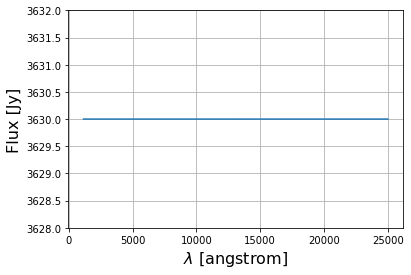

In [62]:
checkab = ABnphot(example_spec.wave)
checkab_ = S.ArraySpectrum(example_spec.wave, checkab, name='Flat AB spectrum')
#plt.plot(checkab_.wave,checkab_.flux)
checkab_.convert('fnu')
plt.plot(checkab_.wave,checkab_.flux*10**23.)
plt.ylim(3.628*10.**3,3.632*10**3.)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel('Flux [Jy]',fontsize=16)

Now, we define our function to compute the AB magnitudes: 
$$m_{AB} = -2.5 \log_{10} \frac{\int F_{\nu}^E(\lambda) \cdot S_{eff} \cdot t_{exp} \cdot S_{passband}(\lambda) \frac{d\lambda}{h \lambda}}{\int F_{\nu, AB}^E \cdot S_{eff} \cdot t_{exp} \cdot S_{throughput}(\lambda) \frac{d\lambda}{h \lambda}} = -2.5 \log_{10} \frac{A}{B} \, . $$ 
Now, we want to compute the error for the AB magnitudes. The denominator is constant for a given $S_{throughput}(\lambda)$, so we assume it does not contribute to the error. Then, we can approximate $A$ as 
$$A \approx \sum_i F_{\nu}^E(\lambda_i) \cdot S_{eff} \cdot t_{exp} \cdot S_{passband}(\lambda_i) \frac{\Delta \lambda_i}{h \lambda_i} = \sum_i n_i \cdot S_{passband}(\lambda_i) \, , $$ 
where $n_i$ is the number of photo-electrons received within a given bin of wavelength, $\Delta \lambda_i$. Then, we can assume that $n_i$ is a Poisson random variable, so 
$$\sigma^2_{n_i} = n_i . $$ 
Taking this into account, we can write the error of $A$ as 
$$\sigma^2_A = \sum_i \left( \frac{\partial A}{\partial n_i} \right)^2 \sigma^2_{n_i} = \sum_i n_i \cdot S_{passband}^2(\lambda_i) \, , $$ 
therefore, 
$$\sigma_A = \sqrt{n_i} \, . $$
Finally, the error on $m_{AB}$ is given by 
$$\sigma^2_{m_{AB}} = \left( \frac{\partial m_{AB}}{\partial A} \right)^2 \sigma^2_A = \left( \frac{-2.5}{A \log 10} \right)^2 \cdot \sum_i n_i \cdot S_{passband}^2(\lambda_i) \, . $$ 


In [63]:
def myAB(spec,passband,filter,return_error=False):
    f_units = str(spec.fluxunits)
    if f_units!='fnu':
        print('ATTENTION: converting flux units to fnu')
        spec.convert('fnu')
        
    observation = S.Observation(spec,passband,force='taper')
    print('Observation units = ', observation.fluxunits)
    nan_mask = np.isnan(observation.flux)
    
    obs_wave_ = observation.wave[~nan_mask]
    obs_flux_ = observation.flux[~nan_mask]
    wave_min = np.min(observation.wave[~nan_mask])
    wave_max = np.max(observation.wave[~nan_mask])

    num = np.trapz(obs_flux_/obs_wave_,x=obs_wave_)*Seff*exptime/h_planck
    
    if return_error:
        finterp_pb = interp1d(passband.wave,passband.throughput,bounds_error=False,fill_value=0.)
        pb_interp = finterp_pb(spec.wave)
        
        delta_lambda = list(np.diff(spec.wave))
        delta_lambda.append(spec.wave[-1]-spec.wave[-2])
        delta_lambda = np.array(delta_lambda)
        assert len(delta_lambda)==len(spec.wave)
        
        assert str(spec.fluxunits)=='fnu'
        n_i = spec.flux*delta_lambda*Seff*exptime/(spec.wave*h_planck)
        print('n_i = ', n_i)
        print('Number of collected photoelectrons = {0:.2e}'.format(np.sum(n_i*pb_interp)))
        err2_num = np.sum(n_i*np.array(pb_interp)**2.)
    
    spec.convert(f_units)
    
    print('Numerator = {0:.2e}'.format(num))
    if return_error:
        print('Variance of the numerator = {0:.2e}'.format(err2_num))
    
    flatsp_nphot = ABnphot(spec.wave)
    flatsp_ = S.ArraySpectrum(spec.wave, flatsp_nphot, name='Flat AB spectrum')
    
    flatsp_.convert('fnu')
    ab_obs = S.Observation(flatsp_,filter,force='taper')
    print('AB observation units = ', ab_obs.fluxunits)
    
    ab_wave_ = ab_obs.wave[~nan_mask]
    ab_flux_ = ab_obs.flux[~nan_mask]
    
    den = np.trapz(ab_flux_/ab_wave_,x=ab_wave_)*Seff*exptime/h_planck
    
    print('Denominator = {0:.2e}'.format(den))
    #print(num/den)
    #print(obmag)
    mab = -2.5*np.log10(num/den)
    print('AB magnitude = ', mab)
    print('---------')
    
    if return_error:
        err2_mab = (2.5**2./np.log(10.)**2.)*err2_num/num**2.
        err_mab = np.sqrt(err2_mab)
        
        return mab,err_mab
    else:
        return mab

In [64]:
# This function gives the flux of an AB source in photons / s / cm^2 / Angstrom 
flatsp_nphot = ABnphot(example_spec.wave)

In [65]:
#Let's write this in pysynphot format (note that the result will be in photlam units, then we use ABnphot as input)
flatsp = S.ArraySpectrum(example_spec.wave, flatsp_nphot, name='Flat AB spectrum')

Now we check that the AB magnitudes are zero for the flat AB spectrum (they have to be through any filter, by definition) 

In [66]:
for filter in lsst_bp:
    myAB(flatsp,filter,filter)

ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.09e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.0
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.22e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.0
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.16e+12
(r) does not have a defined binset in the w

We check the same for the total passband. Note that, given the definition of AB magnitudes that we have implemented, the denominator only considers the throughput of the telescope, even when the spectra pass through the total passband, since the "reference" we want to compare to is when there is no effect of the atmosphere, but in any case the light passes through the telescope, so we consider the telescope's throughput to be the reference (i.e. as if it had a transmission = 1) with respect to which the flux is attenuated. Therefore, the following AB magnitudes of a flat AB spectrum should be different from (greater than) zero  

In [67]:
for fi,filter in enumerate(filters):
    myAB(flatsp,total_passband[filter][0],lsst_bp[fi])

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.88e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.5375197178058375
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.79e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.20744411491687778
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Obs

Make the flat spectrum pass through the throughputs and total passbands 

In [68]:
flat_dict_t = {}
for fi,filter in enumerate(filters):
    flat_spec_t_ = S.Observation(flatsp,lsst_bp[fi],force='taper')
    flat_dict_t[filter] = flat_spec_t_

flat_dict = {}
for fi,filter in enumerate(filters):
    flat_dict[filter] = []
    for i in range(n_sim):
        flat_spec_ = S.Observation(flatsp,total_passband[filter][i],force='taper')
        flat_dict[filter].append(flat_spec_)

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum wi

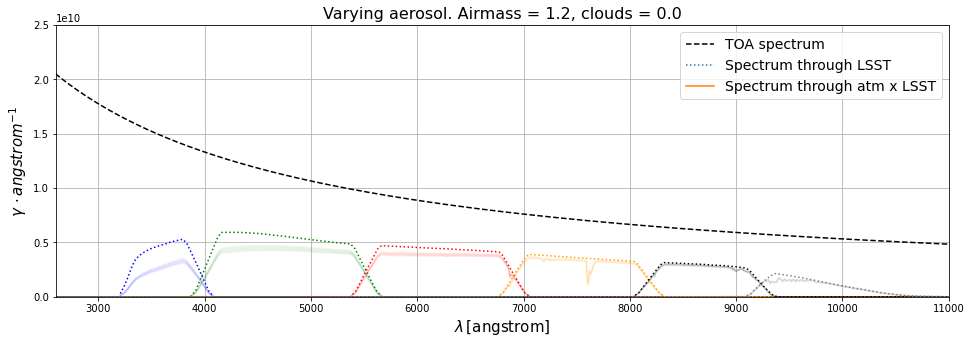

In [69]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
#sed_dict[example_spec].convert('photlam')
if str(flatsp.fluxunits)!='photlam':
    flatsp.convert('photlam')
plt.plot(flatsp.wave,flatsp.flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(flat_dict_t[filter].wave,flat_dict_t[filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = flat_dict[filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)

plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.ylim(0.,2.5e10)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'flat_spectrum_toa_throughput_total_passband_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

Now, let's see the AB magnitudes of the example spectrum with myAB function. To better understand it, we can compare the AB spectrum and the example spectrum (Vega) flux amplitudes in each range of wavelengths (see plot below) 

photlam


Text(0, 0.5, '$\\gamma / angstrom$')

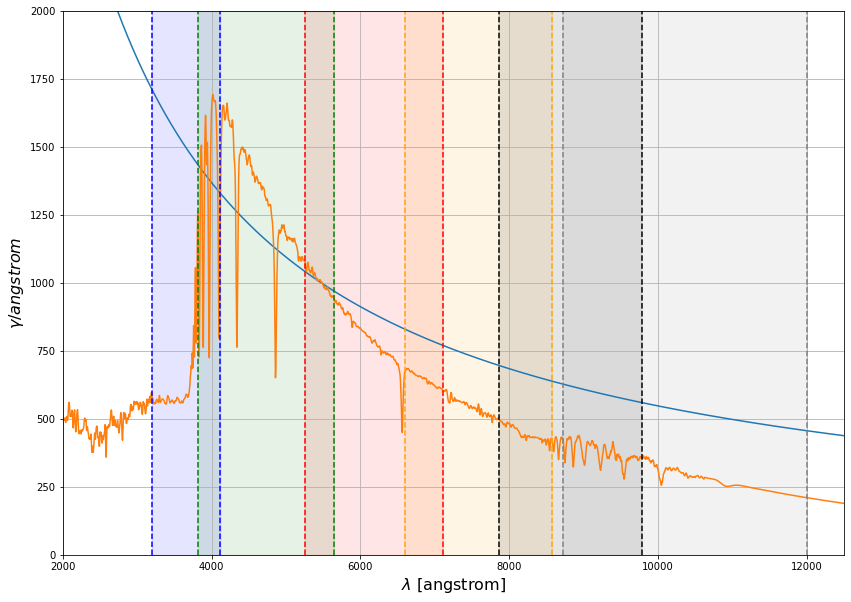

In [70]:
print(flatsp.fluxunits)
flatsp.convert('photlam')
example_spec.convert('photlam')
plt.figure(figsize=(14,10))
plt.plot(flatsp.wave,flatsp.flux)
plt.plot(example_spec.wave,example_spec.flux)

# Approximate integration limits of each total passband. Note that there is some overlap 
plt.axvline(x=3200,ls='--',color=filter_colors[0])
plt.axvline(x=4120,ls='--',color=filter_colors[0])
plt.fill_between(np.arange(3200,4120),np.ones(len(np.arange(3200,4120)))*2000.,color=filter_colors[0],alpha=0.1)

plt.axvline(x=3820,ls='--',color=filter_colors[1])
plt.axvline(x=5650,ls='--',color=filter_colors[1])
plt.fill_between(np.arange(3820,5650),np.ones(len(np.arange(3820,5650)))*2000.,color=filter_colors[1],alpha=0.1)

plt.axvline(x=5250,ls='--',color=filter_colors[2])
plt.axvline(x=7110,ls='--',color=filter_colors[2])
plt.fill_between(np.arange(5250,7110),np.ones(len(np.arange(5250,7110)))*2000.,color=filter_colors[2],alpha=0.1)

plt.axvline(x=6600,ls='--',color=filter_colors[3])
plt.axvline(x=8580,ls='--',color=filter_colors[3])
plt.fill_between(np.arange(6600,8580),np.ones(len(np.arange(6600,8580)))*2000.,color=filter_colors[3],alpha=0.1)

plt.axvline(x=7860,ls='--',color=filter_colors[4])
plt.axvline(x=9780,ls='--',color=filter_colors[4])
plt.fill_between(np.arange(7860,9780),np.ones(len(np.arange(7860,9780)))*2000.,color=filter_colors[4],alpha=0.1)

plt.axvline(x=8720,ls='--',color=filter_colors[5])
plt.axvline(x=12000,ls='--',color=filter_colors[5])
plt.fill_between(np.arange(8720,12000),np.ones(len(np.arange(8720,12000)))*2000.,color=filter_colors[5],alpha=0.1)

plt.xlim(2000.,12500.)
plt.ylim(0.,2000.)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$\gamma / angstrom$',fontsize=16)

In [71]:
for filter in lsst_bp:
    myAB(example_spec,filter,filter)

ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.59e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.7222408197036627
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.95e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.09224087927554477
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.43e+12
(r) does not 

In [72]:
for fi,filter in enumerate(filters):
    myAB(example_spec,total_passband[filter][0],lsst_bp[fi])

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.01e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.2175744456051412
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.38e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1171906588860904
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Obse

# Calculate magnitudes and colours

We compute the magnitudes for the spectra of each spectral type for each atmosphere 

In [73]:
calc_mag_err = True

In [74]:
# Magnitudes of spectra passing through atm x throughput 
mag_dict = {}
mag_dict_ref = {}
mag_err_dict = {}
mag_err_dict_ref = {}
for st in spectral_types:
    print(st)
    
    mag_dict_st = {}
    mag_dict_ref_st = {}
    mag_err_dict_st = {}
    mag_err_dict_ref_st = {}
    for si,obs_spec_ in enumerate(spec_by_type[st]):
        mag_dict_ = {}
        mag_dict_ref_ = {}
        mag_err_dict_ = {}
        mag_err_dict_ref_ = {}
        for fi,filter in enumerate(filters):
            mag_dict_[filter] = []
            mag_err_dict_[filter] = []
            for i in range(n_sim):
                #mag_dict_[filter].append(obs_spec_[filter][i].effstim("abmag"))
                if calc_mag_err:
                    mag_ab_, mag_ab_err_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi],return_error=True)
                    mag_err_dict_[filter].append(mag_ab_err_)
                else:
                    mag_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi])
                mag_dict_[filter].append(mag_ab_)
                
            #mag_dict[sed_] = mag_dict_
            
            if calc_mag_err:
                mag_ab_, mag_ab_err_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi],return_error=True)
                mag_err_dict_ref_[filter] = mag_ab_err_
            else:
                mag_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi])
            mag_dict_ref_[filter] = mag_ab_
        mag_dict_st[si] = mag_dict_
        mag_dict_ref_st[si] = mag_dict_ref_
        mag_err_dict_st[si] = mag_err_dict_
        mag_err_dict_ref_st[si] = mag_err_dict_ref_
    mag_dict[st] = mag_dict_st
    mag_dict_ref[st] = mag_dict_ref_st
    mag_err_dict[st] = mag_err_dict_st
    mag_err_dict_ref[st] = mag_err_dict_ref_st
        

O
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.85e+12
Numerator = 3.85e+12
Variance of the numerator = 6.98e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.23843688103099198
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.78e+12
Numerator = 3.78e+12
Variance of the numerator = 6.75

n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.68e+12
Numerator = 8.68e+12
Variance of the numerator = 3.15e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.05947235386031115
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.40e+12
Numerator = 4.40e+12
Variance of the numerator = 1.91e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.366524998413

n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.31e+12
Numerator = 2.31e+12
Variance of the numerator = 1.01e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.735853598941427
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.30e+12
Numerator = 2.30e+12
Variance of the numerator = 9.95e+11
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.743434518807901

n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.21e+12
Numerator = 1.21e+12
Variance of the numerator = 4.95e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  1.0168591213209255
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.20e+12
Numerator = 1.20e+12
Variance of the numerator = 4.89e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  1.02345904211857

n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.49e+12
Numerator = 3.49e+12
Variance of the numerator = 6.25e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.13397389088600578
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.44e+12
Numerator = 3.44e+12
Variance of the numerator = 6.05e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.11620194688

n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.30e+12
Numerator = 8.30e+12
Variance of the numerator = 2.95e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.010222279077930968
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.19e+12
Numerator = 8.19e+12
Variance of the numerator = 2.87e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.00382057087

n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.20e+12
Numerator = 4.20e+12
Variance of the numerator = 1.78e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.4164708614673373
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.37e+12
Numerator = 2.37e+12
Variance of the numerator = 1.06e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.70938337609718

n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.23e+12
Numerator = 1.23e+12
Variance of the numerator = 5.15e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.9996829659419948
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.22e+12
Numerator = 1.22e+12
Variance of the numerator = 5.09e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  1.00592158446211

n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.97e+11
Numerator = 4.97e+11
Variance of the numerator = 1.07e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.3019535018085007
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.94e+11
Numerator = 4.94e+11
Variance of the numerator = 1.06e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.30744989433535

n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 8.68e+12
Numerator = 8.68e+12
Variance of the numerator = 3.24e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.058986420182689576
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 8.57e+12
Numerator = 8.57e+12
Variance of the numerator = 3.15e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.0448622534

n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 4.23e+12
Numerator = 4.23e+12
Variance of the numerator = 1.76e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.40776374790724945
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 4.19e+12
Numerator = 4.19e+12
Variance of the numerator = 1.73e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.4178003833450

n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 2.32e+12
Numerator = 2.32e+12
Variance of the numerator = 1.01e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.7309777260872387
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 1.25e+12
Numerator = 1.25e+12
Variance of the numerator = 5.32e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.98199351401117

n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 5.22e+11
Numerator = 5.22e+11
Variance of the numerator = 1.15e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.248993311444398
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 5.19e+11
Numerator = 5.19e+11
Variance of the numerator = 1.14e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.254059980381322

n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.00e+12
Numerator = 3.00e+12
Variance of the numerator = 4.87e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.030116251295985365
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.96e+12
Numerator = 2.96e+12
Variance of the numerator = 4.72e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.047622739105

n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.38e+12
Numerator = 4.38e+12
Variance of the numerator = 1.89e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3701983365032343
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.34e+12
Numerator = 4.34e+12
Variance of the numerator = 1.85e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.38006775841806

n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.36e+12
Numerator = 2.36e+12
Variance of the numerator = 1.01e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.7141268781386376
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.34e+12
Numerator = 2.34e+12
Variance of the numerator = 1.00e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.72199569449793

n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.31e+12
Numerator = 1.31e+12
Variance of the numerator = 5.48e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.9322097044119316
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.64e+11
Numerator = 5.64e+11
Variance of the numerator = 1.27e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.16454816314731

n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 2.71e+12
Numerator = 2.71e+12
Variance of the numerator = 4.67e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.14350867960497532
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 2.66e+12
Numerator = 2.66e+12
Variance of the numerator = 4.52e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.1612548245699

n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 7.63e+12
Numerator = 7.63e+12
Variance of the numerator = 2.65e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.08055639150418098
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 7.53e+12
Numerator = 7.53e+12
Variance of the numerator = 2.58e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0945630033912

n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 2.54e+12
Numerator = 2.54e+12
Variance of the numerator = 1.12e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.6322400448534107
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 2.53e+12
Numerator = 2.53e+12
Variance of the numerator = 1.11e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.63980654638148

n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 1.43e+12
Numerator = 1.43e+12
Variance of the numerator = 5.96e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.8316142089965008
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 1.42e+12
Numerator = 1.42e+12
Variance of the numerator = 5.89e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.83821582537038

n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 6.14e+11
Numerator = 6.14e+11
Variance of the numerator = 1.35e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.0726733141448106
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.23e+12
Numerator = 2.23e+12
Variance of the numerator = 4.08e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.35224716244277

n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.90e+12
Numerator = 7.90e+12
Variance of the numerator = 2.89e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.04265512157059022
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.80e+12
Numerator = 7.80e+12
Variance of the numerator = 2.82e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0566960036878

n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.30e+12
Numerator = 4.30e+12
Variance of the numerator = 1.76e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.38934611679254405
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.26e+12
Numerator = 4.26e+12
Variance of the numerator = 1.73e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3993597462207

n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.57e+12
Numerator = 1.57e+12
Variance of the numerator = 6.68e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.7308499168898414
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.56e+12
Numerator = 1.56e+12
Variance of the numerator = 6.60e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.73708169989414

n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.59e+11
Numerator = 6.59e+11
Variance of the numerator = 1.44e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.9947297313616388
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.56e+11
Numerator = 6.56e+11
Variance of the numerator = 1.42e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.00023098221375

n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 1.62e+12
Numerator = 1.62e+12
Variance of the numerator = 2.84e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.6994345753704134
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 7.97e+12
Numerator = 7.97e+12
Variance of the numerator = 3.04e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.03388707320241

n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 4.59e+12
Numerator = 4.59e+12
Variance of the numerator = 1.95e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3200398684798039
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 4.55e+12
Numerator = 4.55e+12
Variance of the numerator = 1.91e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.32987870879887

n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 2.77e+12
Numerator = 2.77e+12
Variance of the numerator = 1.18e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5376865912764883
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 2.75e+12
Numerator = 2.75e+12
Variance of the numerator = 1.16e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.54553701565414

n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 7.39e+11
Numerator = 7.39e+11
Variance of the numerator = 1.64e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.8701358281701692
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 7.36e+11
Numerator = 7.36e+11
Variance of the numerator = 1.63e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.87520059270737

n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 1.31e+12
Numerator = 1.31e+12
Variance of the numerator = 2.21e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.9347343361393162
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 1.29e+12
Numerator = 1.29e+12
Variance of the numerator = 2.14e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.95202680598991

n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 7.51e+12
Numerator = 7.51e+12
Variance of the numerator = 2.75e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.09871550004758209
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 4.86e+12
Numerator = 4.86e+12
Variance of the numerator = 2.12e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2577072906739

n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 2.92e+12
Numerator = 2.92e+12
Variance of the numerator = 1.28e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4820462513624008
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 2.90e+12
Numerator = 2.90e+12
Variance of the numerator = 1.26e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.48960704052221

n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 1.76e+12
Numerator = 1.76e+12
Variance of the numerator = 7.22e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.6083761987085444
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 1.75e+12
Numerator = 1.75e+12
Variance of the numerator = 7.14e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.61496574583500

n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 1.23e+12
Numerator = 1.23e+12
Variance of the numerator = 2.23e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.0004956482797247
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 1.21e+12
Numerator = 1.21e+12
Variance of the numerator = 2.16e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.01801592396503

n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 7.09e+12
Numerator = 7.09e+12
Variance of the numerator = 2.54e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.16108115213023522
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 7.00e+12
Numerator = 7.00e+12
Variance of the numerator = 2.48e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1749924773096

n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 4.79e+12
Numerator = 4.79e+12
Variance of the numerator = 2.03e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2737294523517627
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 3.04e+12
Numerator = 3.04e+12
Variance of the numerator = 1.35e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.43926431603051

n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 1.83e+12
Numerator = 1.83e+12
Variance of the numerator = 7.69e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.5669720940311459
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 1.82e+12
Numerator = 1.82e+12
Variance of the numerator = 7.60e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.57319311227808

n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 8.05e+11
Numerator = 8.05e+11
Variance of the numerator = 1.73e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.7773264606772202
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 8.01e+11
Numerator = 8.01e+11
Variance of the numerator = 1.72e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.78281840624800

n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 8.62e+12
Numerator = 8.62e+12
Variance of the numerator = 3.23e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.05185625522737759
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 8.51e+12
Numerator = 8.51e+12
Variance of the numerator = 3.14e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.03774038485

n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 4.32e+12
Numerator = 4.32e+12
Variance of the numerator = 1.80e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3851283291505931
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 4.28e+12
Numerator = 4.28e+12
Variance of the numerator = 1.76e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.39515832269802

n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 2.50e+12
Numerator = 2.50e+12
Variance of the numerator = 1.09e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.6491943125207834
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 1.45e+12
Numerator = 1.45e+12
Variance of the numerator = 6.20e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.81867091218271

n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 5.99e+11
Numerator = 5.99e+11
Variance of the numerator = 1.32e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.0984927092890298
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 5.96e+11
Numerator = 5.96e+11
Variance of the numerator = 1.30e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.10355536444360

n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 1.35e+12
Numerator = 1.35e+12
Variance of the numerator = 2.20e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.9010519590657463
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 1.33e+12
Numerator = 1.33e+12
Variance of the numerator = 2.14e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.91839315817222

n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 4.78e+12
Numerator = 4.78e+12
Variance of the numerator = 2.07e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2748444714878522
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 4.74e+12
Numerator = 4.74e+12
Variance of the numerator = 2.03e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.28467324895800

Numerator = 2.82e+12
Variance of the numerator = 1.21e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.521360892164691
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 2.80e+12
Numerator = 2.80e+12
Variance of the numerator = 1.19e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.529222775367899
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spec

n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 1.76e+12
Numerator = 1.76e+12
Variance of the numerator = 7.41e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.607087576043316
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 8.16e+11
Numerator = 8.16e+11
Variance of the numerator = 1.82e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.762544527638927

n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 2.80e+12
Numerator = 2.80e+12
Variance of the numerator = 4.87e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.10682452964649015
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 2.75e+12
Numerator = 2.75e+12
Variance of the numerator = 4.71e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.1245587929084

n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 7.75e+12
Numerator = 7.75e+12
Variance of the numerator = 2.69e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0637655693976143
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 7.65e+12
Numerator = 7.65e+12
Variance of the numerator = 2.62e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.07777695001592

n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 2.53e+12
Numerator = 2.53e+12
Variance of the numerator = 1.12e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.6376832776399628
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 2.51e+12
Numerator = 2.51e+12
Variance of the numerator = 1.10e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.64524981161067

n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 1.41e+12
Numerator = 1.41e+12
Variance of the numerator = 5.86e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.8483647230797403
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 1.40e+12
Numerator = 1.40e+12
Variance of the numerator = 5.79e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.85496797987529

n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 5.80e+11
Numerator = 5.80e+11
Variance of the numerator = 1.28e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.1335262962113213
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 2.21e+12
Numerator = 2.21e+12
Variance of the numerator = 4.03e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.36553447292899

n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 7.93e+12
Numerator = 7.93e+12
Variance of the numerator = 2.91e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0387899382955115
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 7.83e+12
Numerator = 7.83e+12
Variance of the numerator = 2.84e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.05282054527284

n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 4.25e+12
Numerator = 4.25e+12
Variance of the numerator = 1.73e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.4040586370552015
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 4.21e+12
Numerator = 4.21e+12
Variance of the numerator = 1.70e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.41407391622092

n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 1.57e+12
Numerator = 1.57e+12
Variance of the numerator = 6.67e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.7321523585703029
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 1.56e+12
Numerator = 1.56e+12
Variance of the numerator = 6.59e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.73838151262333

n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 6.48e+11
Numerator = 6.48e+11
Variance of the numerator = 1.41e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.0133122357777427
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 6.45e+11
Numerator = 6.45e+11
Variance of the numerator = 1.40e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.01881871394973

n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 1.73e+12
Numerator = 1.73e+12
Variance of the numerator = 3.01e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.6322014866085637
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 8.08e+12
Numerator = 8.08e+12
Variance of the numerator = 3.09e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.01814145053466

n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 4.55e+12
Numerator = 4.55e+12
Variance of the numerator = 1.93e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.32946120584205457
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 4.51e+12
Numerator = 4.51e+12
Variance of the numerator = 1.90e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3393004979422

n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 2.74e+12
Numerator = 2.74e+12
Variance of the numerator = 1.16e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5501765779939217
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 2.72e+12
Numerator = 2.72e+12
Variance of the numerator = 1.15e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.55802813064850

n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 7.51e+11
Numerator = 7.51e+11
Variance of the numerator = 1.67e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.8525125730033544
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 7.48e+11
Numerator = 7.48e+11
Variance of the numerator = 1.66e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.85757448218338

n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 1.13e+12
Numerator = 1.13e+12
Variance of the numerator = 1.93e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.08721336452115
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 1.12e+12
Numerator = 1.12e+12
Variance of the numerator = 1.87e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.104469374997086


n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 7.45e+12
Numerator = 7.45e+12
Variance of the numerator = 2.74e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.10708654728369643
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 4.85e+12
Numerator = 4.85e+12
Variance of the numerator = 2.12e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2598568202677

n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 2.93e+12
Numerator = 2.93e+12
Variance of the numerator = 1.28e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4799490661518938
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 2.91e+12
Numerator = 2.91e+12
Variance of the numerator = 1.26e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.48750990734653

n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 1.75e+12
Numerator = 1.75e+12
Variance of the numerator = 7.16e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.6163402879876904
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 1.74e+12
Numerator = 1.74e+12
Variance of the numerator = 7.07e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.62292557453071

n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 2.58e+12
Numerator = 2.58e+12
Variance of the numerator = 4.63e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.19493358169874359
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 2.54e+12
Numerator = 2.54e+12
Variance of the numerator = 4.48e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.2126767506008

n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 7.58e+12
Numerator = 7.58e+12
Variance of the numerator = 2.71e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0876285410273743
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 7.49e+12
Numerator = 7.49e+12
Variance of the numerator = 2.64e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.10157942101953

n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 4.42e+12
Numerator = 4.42e+12
Variance of the numerator = 1.87e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3615806662898546
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 2.62e+12
Numerator = 2.62e+12
Variance of the numerator = 1.17e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.59923081666371

n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 1.47e+12
Numerator = 1.47e+12
Variance of the numerator = 6.18e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.8042794303787202
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 1.46e+12
Numerator = 1.46e+12
Variance of the numerator = 6.11e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.81050853362201

n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 6.08e+11
Numerator = 6.08e+11
Variance of the numerator = 1.31e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.081760113325843
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 6.05e+11
Numerator = 6.05e+11
Variance of the numerator = 1.30e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.087256104852964

n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 7.74e+12
Numerator = 7.74e+12
Variance of the numerator = 2.91e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.06459549148632748
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 7.65e+12
Numerator = 7.65e+12
Variance of the numerator = 2.84e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0786011849888

n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 4.55e+12
Numerator = 4.55e+12
Variance of the numerator = 1.90e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3279397331662867
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 4.51e+12
Numerator = 4.51e+12
Variance of the numerator = 1.86e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.33795015539114

n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 2.74e+12
Numerator = 2.74e+12
Variance of the numerator = 1.20e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5504848040260486
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 1.60e+12
Numerator = 1.60e+12
Variance of the numerator = 6.85e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.71109046245259

n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 6.82e+11
Numerator = 6.82e+11
Variance of the numerator = 1.50e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.9573472970366843
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 6.79e+11
Numerator = 6.79e+11
Variance of the numerator = 1.48e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.96240632162332

n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 2.71e+12
Numerator = 2.71e+12
Variance of the numerator = 4.39e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.142179146711736
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 2.67e+12
Numerator = 2.67e+12
Variance of the numerator = 4.25e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.159700785907067

n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 4.45e+12
Numerator = 4.45e+12
Variance of the numerator = 1.92e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.35374292211200425
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 4.41e+12
Numerator = 4.41e+12
Variance of the numerator = 1.88e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3635925813592

n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 2.53e+12
Numerator = 2.53e+12
Variance of the numerator = 1.09e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.6361578871592671
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 2.52e+12
Numerator = 2.52e+12
Variance of the numerator = 1.08e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.64402233606711

n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 1.43e+12
Numerator = 1.43e+12
Variance of the numerator = 6.01e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.8327315366391443
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 5.89e+11
Numerator = 5.89e+11
Variance of the numerator = 1.32e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.11695863901892

n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.63e+12
Numerator = 2.63e+12
Variance of the numerator = 4.57e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.17404208982991623
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.59e+12
Numerator = 2.59e+12
Variance of the numerator = 4.43e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.1917867384385

n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.36e+12
Numerator = 7.36e+12
Variance of the numerator = 2.57e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.11952489714220502
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.27e+12
Numerator = 7.27e+12
Variance of the numerator = 2.50e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1334768382169

n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.79e+12
Numerator = 2.79e+12
Variance of the numerator = 1.23e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5316362324818857
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.77e+12
Numerator = 2.77e+12
Variance of the numerator = 1.22e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.53921362880811

n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.46e+12
Numerator = 1.46e+12
Variance of the numerator = 6.07e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.8086996741276207
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.45e+12
Numerator = 1.45e+12
Variance of the numerator = 6.00e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.81530747826220

n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.24e+11
Numerator = 6.24e+11
Variance of the numerator = 1.37e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.0547634483380808
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 2.29e+12
Numerator = 2.29e+12
Variance of the numerator = 4.19e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.32429629088587

n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 7.58e+12
Numerator = 7.58e+12
Variance of the numerator = 2.77e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.08841904681187995
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 7.48e+12
Numerator = 7.48e+12
Variance of the numerator = 2.70e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1024399848091

n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 4.50e+12
Numerator = 4.50e+12
Variance of the numerator = 1.84e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3403702284459389
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 4.46e+12
Numerator = 4.46e+12
Variance of the numerator = 1.81e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.35037224608982

n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 1.60e+12
Numerator = 1.60e+12
Variance of the numerator = 6.80e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.710284561093747
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 1.59e+12
Numerator = 1.59e+12
Variance of the numerator = 6.72e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.716513505847979

n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 6.78e+11
Numerator = 6.78e+11
Variance of the numerator = 1.48e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.9637185313250005
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 6.75e+11
Numerator = 6.75e+11
Variance of the numerator = 1.46e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.96922053895395

n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 1.95e+12
Numerator = 1.95e+12
Variance of the numerator = 3.43e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.4973616862175339
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 7.55e+12
Numerator = 7.55e+12
Variance of the numerator = 2.88e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.09172500529298

n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 4.73e+12
Numerator = 4.73e+12
Variance of the numerator = 2.01e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2875857912844115
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 4.68e+12
Numerator = 4.68e+12
Variance of the numerator = 1.97e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.29739789073130

n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 2.97e+12
Numerator = 2.97e+12
Variance of the numerator = 1.26e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4634839510795758
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 2.95e+12
Numerator = 2.95e+12
Variance of the numerator = 1.24e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.47133866037665

n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 8.20e+11
Numerator = 8.20e+11
Variance of the numerator = 1.82e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.7580722261292063
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 8.16e+11
Numerator = 8.16e+11
Variance of the numerator = 1.80e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.76313673714997

n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.60e+12
Numerator = 1.60e+12
Variance of the numerator = 2.76e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.7119148972221183
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.58e+12
Numerator = 1.58e+12
Variance of the numerator = 2.68e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.72929502867291

n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.09e+12
Numerator = 7.09e+12
Variance of the numerator = 2.61e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1610522558460026
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.86e+12
Numerator = 4.86e+12
Variance of the numerator = 2.12e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.25657953712417

n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.10e+12
Numerator = 3.10e+12
Variance of the numerator = 1.35e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.41636537554019465
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.08e+12
Numerator = 3.08e+12
Variance of the numerator = 1.34e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4239188151817

n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.94e+12
Numerator = 1.94e+12
Variance of the numerator = 7.97e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.5025179966251132
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.93e+12
Numerator = 1.93e+12
Variance of the numerator = 7.88e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.50910699303207

n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 9.90e+11
Numerator = 9.90e+11
Variance of the numerator = 1.78e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.2350664136421026
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 9.74e+11
Numerator = 9.74e+11
Variance of the numerator = 1.73e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.25255791871101

n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 6.92e+12
Numerator = 6.92e+12
Variance of the numerator = 2.49e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.18683021671252675
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 6.83e+12
Numerator = 6.83e+12
Variance of the numerator = 2.43e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2007099594599

n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 4.77e+12
Numerator = 4.77e+12
Variance of the numerator = 2.03e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2768480595602084
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 3.16e+12
Numerator = 3.16e+12
Variance of the numerator = 1.41e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.39649278687631

n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 1.89e+12
Numerator = 1.89e+12
Variance of the numerator = 7.95e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.5293355136489002
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 1.88e+12
Numerator = 1.88e+12
Variance of the numerator = 7.86e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.53555455417330

n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 8.65e+11
Numerator = 8.65e+11
Variance of the numerator = 1.86e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.6993341572120353
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 8.61e+11
Numerator = 8.61e+11
Variance of the numerator = 1.84e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.70482448973799

n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.21e+12
Numerator = 7.21e+12
Variance of the numerator = 2.73e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.14235163536206533
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.12e+12
Numerator = 7.12e+12
Variance of the numerator = 2.66e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1562783811861

n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.76e+12
Numerator = 4.76e+12
Variance of the numerator = 1.98e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.28079293041526726
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.71e+12
Numerator = 4.71e+12
Variance of the numerator = 1.95e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2907852046450

n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.18e+12
Numerator = 3.18e+12
Variance of the numerator = 1.39e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.38864452355342466
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.02e+12
Numerator = 2.02e+12
Variance of the numerator = 8.65e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.4564577753804

n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.19e+11
Numerator = 9.19e+11
Variance of the numerator = 2.01e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.6339030468793149
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.15e+11
Numerator = 9.15e+11
Variance of the numerator = 1.99e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.63895251519376

n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.15e+11
Numerator = 8.15e+11
Variance of the numerator = 1.33e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.4463694369270963
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.02e+11
Numerator = 8.02e+11
Variance of the numerator = 1.29e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.46361497301026

n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.05e+12
Numerator = 5.05e+12
Variance of the numerator = 2.18e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.21590449584791843
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.00e+12
Numerator = 5.00e+12
Variance of the numerator = 2.14e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2257207070885

n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.27e+12
Numerator = 3.27e+12
Variance of the numerator = 1.41e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.3585505027790159
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.25e+12
Numerator = 3.25e+12
Variance of the numerator = 1.39e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.36639889258525

n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.08e+12
Numerator = 2.08e+12
Variance of the numerator = 8.73e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.4279060050028647
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.59e+11
Numerator = 9.59e+11
Variance of the numerator = 2.12e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.58786855822192

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.4985588840019641
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 7.65e+11
Numerator = 7.65e+11
Variance of the numerator = 1.28e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.5157927163910494
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i 

n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 6.53e+12
Numerator = 6.53e+12
Variance of the numerator = 2.42e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.24964621804484705
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 5.14e+12
Numerator = 5.14e+12
Variance of the numerator = 2.24e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1957867828646

n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 3.47e+12
Numerator = 3.47e+12
Variance of the numerator = 1.52e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.29367135612843454
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 3.45e+12
Numerator = 3.45e+12
Variance of the numerator = 1.50e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.3012198748070

n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 2.19e+12
Numerator = 2.19e+12
Variance of the numerator = 8.96e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.37235869904462526
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 2.17e+12
Numerator = 2.17e+12
Variance of the numerator = 8.85e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.3789419348806

n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 7.78e+11
Numerator = 7.78e+11
Variance of the numerator = 1.41e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.496984753784686
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 7.65e+11
Numerator = 7.65e+11
Variance of the numerator = 1.36e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.514489704893089

n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 6.21e+12
Numerator = 6.21e+12
Variance of the numerator = 2.25e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.30387178947676075
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 6.13e+12
Numerator = 6.13e+12
Variance of the numerator = 2.19e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.3176494205076

n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 5.23e+12
Numerator = 5.23e+12
Variance of the numerator = 2.23e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.17841650299904724
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 3.80e+12
Numerator = 3.80e+12
Variance of the numerator = 1.69e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.1962353246320

n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 2.43e+12
Numerator = 2.43e+12
Variance of the numerator = 1.02e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.2560002412692964
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 2.42e+12
Numerator = 2.42e+12
Variance of the numerator = 1.01e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.26221828752187

n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 1.17e+12
Numerator = 1.17e+12
Variance of the numerator = 2.51e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.36751349978803205
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 1.17e+12
Numerator = 1.17e+12
Variance of the numerator = 2.49e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.3729957883814

n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 7.52e+12
Numerator = 7.52e+12
Variance of the numerator = 2.84e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.09617425097105842
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 7.43e+12
Numerator = 7.43e+12
Variance of the numerator = 2.77e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1101492718936

n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 4.70e+12
Numerator = 4.70e+12
Variance of the numerator = 1.96e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.29306912087879067
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 4.66e+12
Numerator = 4.66e+12
Variance of the numerator = 1.93e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3030685302928

n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 3.05e+12
Numerator = 3.05e+12
Variance of the numerator = 1.33e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4334983983563726
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 1.93e+12
Numerator = 1.93e+12
Variance of the numerator = 8.22e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.51056152944445

n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 8.84e+11
Numerator = 8.84e+11
Variance of the numerator = 1.94e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.6762938406599386
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 8.80e+11
Numerator = 8.80e+11
Variance of the numerator = 1.93e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.68135531401815

n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 8.01e+11
Numerator = 8.01e+11
Variance of the numerator = 1.33e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.4658340658527846
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 7.88e+11
Numerator = 7.88e+11
Variance of the numerator = 1.29e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.48307725321331

n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 5.04e+12
Numerator = 5.04e+12
Variance of the numerator = 2.18e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.21870075302142547
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 4.99e+12
Numerator = 4.99e+12
Variance of the numerator = 2.14e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2285165751996

n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 3.28e+12
Numerator = 3.28e+12
Variance of the numerator = 1.41e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.3567856904905445
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 3.25e+12
Numerator = 3.25e+12
Variance of the numerator = 1.39e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.36463865015361

n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 2.09e+12
Numerator = 2.09e+12
Variance of the numerator = 8.79e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.41972164801447387
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 1.03e+12
Numerator = 1.03e+12
Variance of the numerator = 2.28e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.5143225111901

n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 9.54e+11
Numerator = 9.54e+11
Variance of the numerator = 1.67e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.2756188444492684
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 9.39e+11
Numerator = 9.39e+11
Variance of the numerator = 1.61e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.29311995193550

n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 6.66e+12
Numerator = 6.66e+12
Variance of the numerator = 2.34e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.22849065400576268
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 6.58e+12
Numerator = 6.58e+12
Variance of the numerator = 2.28e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2423537864310

n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 3.13e+12
Numerator = 3.13e+12
Variance of the numerator = 1.39e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.40700406173581716
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 3.11e+12
Numerator = 3.11e+12
Variance of the numerator = 1.37e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4145634655479

n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 1.89e+12
Numerator = 1.89e+12
Variance of the numerator = 7.84e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.5311035564549926
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 1.88e+12
Numerator = 1.88e+12
Variance of the numerator = 7.75e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.53769401538013

n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 8.97e+11
Numerator = 8.97e+11
Variance of the numerator = 1.97e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.6598277187234048
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.45e+11
Numerator = 8.45e+11
Variance of the numerator = 1.56e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.40756458842930

n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.62e+12
Numerator = 6.62e+12
Variance of the numerator = 2.45e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.23501677468334714
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.54e+12
Numerator = 6.54e+12
Variance of the numerator = 2.39e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2488776432877

n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.82e+12
Numerator = 4.82e+12
Variance of the numerator = 1.98e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.26575428484776037
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.78e+12
Numerator = 4.78e+12
Variance of the numerator = 1.94e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2757346707507

n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.07e+12
Numerator = 2.07e+12
Variance of the numerator = 8.77e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.43417370636345
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.05e+12
Numerator = 2.05e+12
Variance of the numerator = 8.67e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.4403919291313226

n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.58e+11
Numerator = 9.58e+11
Variance of the numerator = 2.08e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.5883850622894156
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.54e+11
Numerator = 9.54e+11
Variance of the numerator = 2.06e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.59387876677261

n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 7.67e+11
Numerator = 7.67e+11
Variance of the numerator = 1.35e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.5116374564146886
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 6.73e+12
Numerator = 6.73e+12
Variance of the numerator = 2.59e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.21633404564329

n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 5.08e+12
Numerator = 5.08e+12
Variance of the numerator = 2.16e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.208647075888037
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 5.04e+12
Numerator = 5.04e+12
Variance of the numerator = 2.12e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.218449180796626

n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 3.43e+12
Numerator = 3.43e+12
Variance of the numerator = 1.46e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.3079142028603295
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 3.40e+12
Numerator = 3.40e+12
Variance of the numerator = 1.43e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.31576376017547

n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 1.11e+12
Numerator = 1.11e+12
Variance of the numerator = 2.45e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.4335878562057891
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 1.10e+12
Numerator = 1.10e+12
Variance of the numerator = 2.42e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.43864564518295

n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.86e+11
Numerator = 6.86e+11
Variance of the numerator = 1.15e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6338562616597776
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.75e+11
Numerator = 6.75e+11
Variance of the numerator = 1.11e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.65110647369415

n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.32e+12
Numerator = 5.32e+12
Variance of the numerator = 2.29e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.15973402796868955
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.27e+12
Numerator = 5.27e+12
Variance of the numerator = 2.24e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1695262889950

n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.72e+12
Numerator = 3.72e+12
Variance of the numerator = 1.63e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.21836072349344995
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.50e+12
Numerator = 2.50e+12
Variance of the numerator = 1.07e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.2255627010775

Denominator = 1.65e+12
AB magnitude =  0.36083340836108807
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.18e+12
Numerator = 1.18e+12
Variance of the numerator = 2.53e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.3663237921384868
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons

n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 7.13e+12
Numerator = 7.13e+12
Variance of the numerator = 2.66e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.15409092095685725
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 7.04e+12
Numerator = 7.04e+12
Variance of the numerator = 2.59e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1680147648743

n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 4.67e+12
Numerator = 4.67e+12
Variance of the numerator = 1.90e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.30186681248258196
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 4.88e+12
Numerator = 4.88e+12
Variance of the numerator = 2.08e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2522282751293

n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 2.08e+12
Numerator = 2.08e+12
Variance of the numerator = 8.60e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.4275746255792045
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 2.07e+12
Numerator = 2.07e+12
Variance of the numerator = 8.49e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.43415940949865

n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 1.17e+12
Numerator = 1.17e+12
Variance of the numerator = 2.22e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.0553609297937978
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 1.15e+12
Numerator = 1.15e+12
Variance of the numerator = 2.15e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.07286871140379

n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 6.57e+12
Numerator = 6.57e+12
Variance of the numerator = 2.40e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.24355484700220612
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 6.48e+12
Numerator = 6.48e+12
Variance of the numerator = 2.34e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2573945818736

n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 4.84e+12
Numerator = 4.84e+12
Variance of the numerator = 1.97e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2620728661398206
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 5.07e+12
Numerator = 5.07e+12
Variance of the numerator = 2.16e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.21246702206391

n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 2.18e+12
Numerator = 2.18e+12
Variance of the numerator = 9.24e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.37485659851182085
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 2.17e+12
Numerator = 2.17e+12
Variance of the numerator = 9.13e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.3810751350316

n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 9.72e+11
Numerator = 9.72e+11
Variance of the numerator = 2.09e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.5731408574904047
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 9.67e+11
Numerator = 9.67e+11
Variance of the numerator = 2.07e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.57862949032547

n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 6.25e+12
Numerator = 6.25e+12
Variance of the numerator = 2.41e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2971003721844915
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 6.17e+12
Numerator = 6.17e+12
Variance of the numerator = 2.35e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.31086782026431

n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 5.44e+12
Numerator = 5.44e+12
Variance of the numerator = 2.30e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.13596195195493668
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 5.39e+12
Numerator = 5.39e+12
Variance of the numerator = 2.25e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1458291922751

n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 4.02e+12
Numerator = 4.02e+12
Variance of the numerator = 1.70e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.13410468245504514
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 4.17e+12
Numerator = 4.17e+12
Variance of the numerator = 1.82e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.0953645875298

n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 1.31e+12
Numerator = 1.31e+12
Variance of the numerator = 2.86e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.2527753176031889
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 1.30e+12
Numerator = 1.30e+12
Variance of the numerator = 2.83e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.25782009769687

n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.50e+11
Numerator = 6.50e+11
Variance of the numerator = 1.10e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6923920799391778
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.40e+11
Numerator = 6.40e+11
Variance of the numerator = 1.06e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.70971642531098

n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.78e+12
Numerator = 5.78e+12
Variance of the numerator = 2.53e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.06954608420679764
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.73e+12
Numerator = 5.73e+12
Variance of the numerator = 2.49e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.0793053722821

n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.34e+12
Numerator = 4.34e+12
Variance of the numerator = 1.86e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.05221741618352181
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.31e+12
Numerator = 4.31e+12
Variance of the numerator = 1.83e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.0600472013901

n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.51e+12
Numerator = 1.51e+12
Variance of the numerator = 3.30e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.09677835902110694
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.50e+12
Numerator = 1.50e+12
Variance of the numerator = 3.27e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.1018278238338

n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.55e+11
Numerator = 6.55e+11
Variance of the numerator = 1.16e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6844675146641488
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.76e+12
Numerator = 5.76e+12
Variance of the numerator = 2.23e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.38625927327707

n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.77e+12
Numerator = 5.77e+12
Variance of the numerator = 2.46e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.07164934431537605
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.72e+12
Numerator = 5.72e+12
Variance of the numerator = 2.42e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.0813992213757

n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.44e+12
Numerator = 4.44e+12
Variance of the numerator = 1.88e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.027353071106645685
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.41e+12
Numerator = 4.41e+12
Variance of the numerator = 1.86e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.035179426849

n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.55e+12
Numerator = 1.55e+12
Variance of the numerator = 3.37e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.0693695381593371
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.54e+12
Numerator = 1.54e+12
Variance of the numerator = 3.34e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.07442046114894

n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 7.02e+11
Numerator = 7.02e+11
Variance of the numerator = 1.25e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6077600219688717
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 5.76e+12
Numerator = 5.76e+12
Variance of the numerator = 2.23e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.38555111734662

Denominator = 6.16e+12
AB magnitude =  0.06489182142174918
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 5.75e+12
Numerator = 5.75e+12
Variance of the numerator = 2.43e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.07464008537724978
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectron

n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 3.19e+12
Numerator = 3.19e+12
Variance of the numerator = 1.36e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.03873565961927547
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 3.18e+12
Numerator = 3.18e+12
Variance of the numerator = 1.34e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.03251221642

Denominator = 1.65e+12
AB magnitude =  0.11791274410977075
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 1.47e+12
Numerator = 1.47e+12
Variance of the numerator = 3.14e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.12339192704272148
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectron

Denominator = 8.22e+12
AB magnitude =  0.4343572222014953
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.44e+12
Numerator = 5.44e+12
Variance of the numerator = 2.01e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4480187818239907
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons 

n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.91e+12
Numerator = 4.91e+12
Variance of the numerator = 2.17e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.08138960235403696
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.87e+12
Numerator = 4.87e+12
Variance of the numerator = 2.14e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.07385925039

((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.31e+12
Numerator = 3.31e+12
Variance of the numerator = 1.37e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.07874236312303447
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.29e+12
Numerator = 3.29e+12
Variance of the numerator = 1.35e+12
(z) does not have a defined binset in

Denominator = 3.09e+12
AB magnitude =  1.8046392633614636
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 5.77e+11
Numerator = 5.77e+11
Variance of the numerator = 1.03e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.8222284618110172
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons 

Number of collected photoelectrons = 6.10e+12
Numerator = 6.10e+12
Variance of the numerator = 2.65e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.010728240004448743
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 6.05e+12
Numerator = 6.05e+12
Variance of the numerator = 2.61e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.020461122632273645
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined 

n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 4.88e+12
Numerator = 4.88e+12
Variance of the numerator = 2.07e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.07478841442627147
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 4.84e+12
Numerator = 4.84e+12
Variance of the numerator = 2.04e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.06696230988

n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 1.81e+12
Numerator = 1.81e+12
Variance of the numerator = 3.91e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.10166347268327768
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 1.80e+12
Numerator = 1.80e+12
Variance of the numerator = 3.88e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.09662914696

n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.44e+12
Numerator = 5.44e+12
Variance of the numerator = 2.09e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4483496738950178
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.37e+12
Numerator = 5.37e+12
Variance of the numerator = 2.03e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.46197057596370

n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.87e+12
Numerator = 5.87e+12
Variance of the numerator = 2.44e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.052578369383192845
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.82e+12
Numerator = 5.82e+12
Variance of the numerator = 2.40e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.062482056111

Denominator = 3.08e+12
AB magnitude =  -0.1726448629030108
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.59e+12
Numerator = 3.59e+12
Variance of the numerator = 1.49e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.16622343901151887
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectro

n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 5.75e+11
Numerator = 5.75e+11
Variance of the numerator = 9.88e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.8244130513116348
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 5.66e+11
Numerator = 5.66e+11
Variance of the numerator = 9.57e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.84177397751422

n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 5.39e+12
Numerator = 5.39e+12
Variance of the numerator = 2.02e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.45834123527160997
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 6.14e+12
Numerator = 6.14e+12
Variance of the numerator = 2.69e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.0044215078365

((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 5.00e+12
Numerator = 5.00e+12
Variance of the numerator = 2.18e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.10130542440052273
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 4.96e+12
Numerator = 4.96e+12
Variance of the numerator = 2.15e+12
(i) does not have a defined binset in

n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 1.68e+12
Numerator = 1.68e+12
Variance of the numerator = 3.68e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.019753055595696768
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 1.67e+12
Numerator = 1.67e+12
Variance of the numerator = 3.64e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.0147037163

Denominator = 8.22e+12
AB magnitude =  0.447456797732306
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 5.38e+12
Numerator = 5.38e+12
Variance of the numerator = 2.06e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4610618526687684
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons =

n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 6.00e+12
Numerator = 6.00e+12
Variance of the numerator = 2.52e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.028317270702334134
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 5.95e+12
Numerator = 5.95e+12
Variance of the numerator = 2.48e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.038213729853

n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 3.70e+12
Numerator = 3.70e+12
Variance of the numerator = 1.54e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.1971151876805483
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 3.67e+12
Numerator = 3.67e+12
Variance of the numerator = 1.52e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.190686423865

n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 7.37e+11
Numerator = 7.37e+11
Variance of the numerator = 1.38e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.5557360023248306
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 7.25e+11
Numerator = 7.25e+11
Variance of the numerator = 1.33e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.57327611559474

n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 5.75e+12
Numerator = 5.75e+12
Variance of the numerator = 2.09e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.3877527503495234
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 5.68e+12
Numerator = 5.68e+12
Variance of the numerator = 2.04e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.40145075816699

n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 4.26e+12
Numerator = 4.26e+12
Variance of the numerator = 1.85e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.07295910023691742
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 4.23e+12
Numerator = 4.23e+12
Variance of the numerator = 1.82e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.0806649797463

n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 2.76e+12
Numerator = 2.76e+12
Variance of the numerator = 1.12e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.11957049954372244
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 2.84e+12
Numerator = 2.84e+12
Variance of the numerator = 1.19e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.0871538708956

n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.73e+11
Numerator = 6.73e+11
Variance of the numerator = 1.21e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6548772087046686
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.62e+11
Numerator = 6.62e+11
Variance of the numerator = 1.17e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.67245472311964

n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.72e+12
Numerator = 5.72e+12
Variance of the numerator = 2.13e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.3929517969906129
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.93e+12
Numerator = 5.93e+12
Variance of the numerator = 2.60e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.04231199209669

Number of collected photoelectrons = 4.59e+12
Numerator = 4.59e+12
Variance of the numerator = 1.99e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.008121680803220684
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.55e+12
Numerator = 4.55e+12
Variance of the numerator = 1.96e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.0004219016965923985
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defin

n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.52e+12
Numerator = 1.52e+12
Variance of the numerator = 3.29e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.09020909574771596
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.51e+12
Numerator = 1.51e+12
Variance of the numerator = 3.26e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.0954995772461

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.46e+12
Numerator = 5.46e+12
Variance of the numerator = 2.10e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4439037585672533
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.39e+12
Numerator = 5.39e+12
Variance of the numerator = 2.05e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.45751638038323

Denominator = 6.16e+12
AB magnitude =  0.07068565842398489
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.72e+12
Numerator = 5.72e+12
Variance of the numerator = 2.36e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.0805965212921081
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons

Denominator = 3.08e+12
AB magnitude =  -0.10761468675732874
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.38e+12
Numerator = 3.38e+12
Variance of the numerator = 1.39e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.10102961937687585
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectr

n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 7.16e+11
Numerator = 7.16e+11
Variance of the numerator = 1.31e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.5866942291218453
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 7.05e+11
Numerator = 7.05e+11
Variance of the numerator = 1.27e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.60418508398369

Denominator = 8.22e+12
AB magnitude =  0.3692699818757505
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 5.78e+12
Numerator = 5.78e+12
Variance of the numerator = 2.02e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.38300045703836555
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons

n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 3.82e+12
Numerator = 3.82e+12
Variance of the numerator = 1.62e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.1907044482638788
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 3.79e+12
Numerator = 3.79e+12
Variance of the numerator = 1.60e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.19853818686104

Denominator = 1.65e+12
AB magnitude =  0.2232535333870509
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 1.34e+12
Numerator = 1.34e+12
Variance of the numerator = 2.94e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.22831041915977304
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons

Number of collected photoelectrons = 6.16e+11
Numerator = 6.16e+11
Variance of the numerator = 1.05e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.7509274315982326
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 6.06e+11
Numerator = 6.06e+11
Variance of the numerator = 1.01e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.7682334473173558
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined bins

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 5.90e+12
Numerator = 5.90e+12
Variance of the numerator = 2.59e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.04713390019190754
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 5.85e+12
Numerator = 5.85e+12
Variance of the numerator = 2.54e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.0568871290860

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 4.40e+12
Numerator = 4.40e+12
Variance of the numerator = 1.91e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.037123158222142454
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 4.37e+12
Numerator = 4.37e+12
Variance of the numerator = 1.88e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.044831487854

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 2.93e+12
Numerator = 2.93e+12
Variance of the numerator = 1.19e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.053521109359917364
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 3.02e+12
Numerator = 3.02e+12
Variance of the numerator = 1.27e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.021130751211

Denominator = 3.09e+12
AB magnitude =  1.8288300835400553
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 6.21e+11
Numerator = 6.21e+11
Variance of the numerator = 1.11e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.741907306345118
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons =

Number of collected photoelectrons = 5.76e+12
Numerator = 5.76e+12
Variance of the numerator = 2.44e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.07243574880490461
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 5.71e+12
Numerator = 5.71e+12
Variance of the numerator = 2.40e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.08227781139125007
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined bi

n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 3.22e+12
Numerator = 3.22e+12
Variance of the numerator = 1.36e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.047619875336440104
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 3.20e+12
Numerator = 3.20e+12
Variance of the numerator = 1.35e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.0414042586

n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 1.61e+12
Numerator = 1.61e+12
Variance of the numerator = 3.47e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.025161312673623898
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 1.60e+12
Numerator = 1.60e+12
Variance of the numerator = 3.44e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.030643933799

Number of collected photoelectrons = 6.47e+12
Numerator = 6.47e+12
Variance of the numerator = 2.37e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.26031364069413154
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 6.39e+12
Numerator = 6.39e+12
Variance of the numerator = 2.31e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2741307558362751
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined bin

((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 3.70e+12
Numerator = 3.70e+12
Variance of the numerator = 1.65e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.22519349994457316
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 3.67e+12
Numerator = 3.67e+12
Variance of the numerator = 1.63e+12
(i) does not have a defined binset in 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 2.27e+12
Numerator = 2.27e+12
Variance of the numerator = 9.28e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.33383537868441404
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 2.25e+12
Numerator = 2.25e+12
Variance of the numerator = 9.17e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.3404237456031

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 5.78e+11
Numerator = 5.78e+11
Variance of the numerator = 9.85e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.8196000231157492
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 5.69e+11
Numerator = 5.69e+11
Variance of the numerator = 9.54e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.83681184654116

(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.08976152362013919
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 5.62e+12
Numerator = 5.62e+12
Variance of the numerator = 2.44e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.09953924040038375
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_

---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 3.95e+12
Numerator = 3.95e+12
Variance of the numerator = 1.66e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.15397259827178678
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 4.09e+12
Numerator = 4.09e+12
Variance of the numerator

((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 1.36e+12
Numerator = 1.36e+12
Variance of the numerator = 2.91e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.20697493848287374
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 1.35e+12
Numerator = 1.35e+12
Variance of the numerator = 2.88e+11
(Y) does not have a defined binset in 

n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.30e+12
Numerator = 6.30e+12
Variance of the numerator = 2.31e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2891251259981184
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.22e+12
Numerator = 6.22e+12
Variance of the numerator = 2.25e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.30291817484551

n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.98e+12
Numerator = 3.98e+12
Variance of the numerator = 1.76e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.14624559600651743
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.95e+12
Numerator = 3.95e+12
Variance of the numerator = 1.74e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.1537892838432

n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.67e+12
Numerator = 2.67e+12
Variance of the numerator = 1.11e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.15472806744389386
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.66e+12
Numerator = 2.66e+12
Variance of the numerator = 1.10e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.1613096128094

n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.30e+12
Numerator = 1.30e+12
Variance of the numerator = 2.86e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.2536667646176193
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.87e+11
Numerator = 6.87e+11
Variance of the numerator = 1.32e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.63264866535287

n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.21e+12
Numerator = 6.21e+12
Variance of the numerator = 2.31e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.30473713161831584
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.13e+12
Numerator = 6.13e+12
Variance of the numerator = 2.26e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.3185122377368

n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.29e+12
Numerator = 5.29e+12
Variance of the numerator = 2.18e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.16453914272855227
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.25e+12
Numerator = 5.25e+12
Variance of the numerator = 2.14e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1744704896317

n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.91e+12
Numerator = 2.91e+12
Variance of the numerator = 1.23e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.06338364941471616
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.89e+12
Numerator = 2.89e+12
Variance of the numerator = 1.22e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.0695973015212

n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.41e+12
Numerator = 1.41e+12
Variance of the numerator = 3.05e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.16850651814834883
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.40e+12
Numerator = 1.40e+12
Variance of the numerator = 3.02e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.1739926622974

n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 3.94e+11
Numerator = 3.94e+11
Variance of the numerator = 7.21e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.2360627202135634
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 5.39e+12
Numerator = 5.39e+12
Variance of the numerator = 2.10e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.45818203237165

n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 5.94e+12
Numerator = 5.94e+12
Variance of the numerator = 2.54e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.03905003359496223
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 5.89e+12
Numerator = 5.89e+12
Variance of the numerator = 2.49e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.0487986411746

n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 4.53e+12
Numerator = 4.53e+12
Variance of the numerator = 1.92e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.004800107085440703
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 4.50e+12
Numerator = 4.50e+12
Variance of the numerator = 1.90e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.012633288657

n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 1.62e+12
Numerator = 1.62e+12
Variance of the numerator = 3.55e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.02093096589771898
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 1.61e+12
Numerator = 1.61e+12
Variance of the numerator = 3.52e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.0259771299858

n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.94e+11
Numerator = 4.94e+11
Variance of the numerator = 8.49e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.989907644052927
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.86e+11
Numerator = 4.86e+11
Variance of the numerator = 8.23e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.007262779484161

n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.25e+12
Numerator = 5.25e+12
Variance of the numerator = 1.97e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.48582286608093156
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.24e+12
Numerator = 6.24e+12
Variance of the numerator = 2.74e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.013958360163

n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.29e+12
Numerator = 5.29e+12
Variance of the numerator = 2.31e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.16388122114597675
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.26e+12
Numerator = 5.26e+12
Variance of the numerator = 2.28e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.15635603188

n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.69e+12
Numerator = 3.69e+12
Variance of the numerator = 1.51e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.19575040702157426
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.67e+12
Numerator = 3.67e+12
Variance of the numerator = 1.49e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.18916697123

n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 5.48e+11
Numerator = 5.48e+11
Variance of the numerator = 1.01e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.8765532420595588
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 5.40e+11
Numerator = 5.40e+11
Variance of the numerator = 9.77e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.89412071618286

n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 5.15e+12
Numerator = 5.15e+12
Variance of the numerator = 1.88e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5085303603695122
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 5.08e+12
Numerator = 5.08e+12
Variance of the numerator = 1.83e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.52211034775090

n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 6.10e+12
Numerator = 6.10e+12
Variance of the numerator = 2.61e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.01100319364213393
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 5.37e+12
Numerator = 5.37e+12
Variance of the numerator = 2.39e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.178532006088

n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 3.77e+12
Numerator = 3.77e+12
Variance of the numerator = 1.58e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.2191404886171267
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 3.75e+12
Numerator = 3.75e+12
Variance of the numerator = 1.56e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.212923571745

n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 1.85e+12
Numerator = 1.85e+12
Variance of the numerator = 3.95e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.12638238841615657
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 1.84e+12
Numerator = 1.84e+12
Variance of the numerator = 3.91e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.12090344112

n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 5.08e+12
Numerator = 5.08e+12
Variance of the numerator = 1.86e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5218318152126392
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 5.02e+12
Numerator = 5.02e+12
Variance of the numerator = 1.81e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.53538250472606

Number of collected photoelectrons = 5.57e+12
Numerator = 5.57e+12
Variance of the numerator = 2.45e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.21841643584306653
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 5.53e+12
Numerator = 5.53e+12
Variance of the numerator = 2.42e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.210892245770523
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined bi

n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 2.06e+12
Numerator = 2.06e+12
Variance of the numerator = 4.55e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.24499066938978464
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 2.06e+12
Numerator = 2.06e+12
Variance of the numerator = 4.51e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.23994652266

n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 4.47e+11
Numerator = 4.47e+11
Variance of the numerator = 7.76e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.0985575146872133
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 4.40e+11
Numerator = 4.40e+11
Variance of the numerator = 7.52e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.11603064580063

n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 4.77e+12
Numerator = 4.77e+12
Variance of the numerator = 1.68e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5903397261542807
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 5.08e+12
Numerator = 5.08e+12
Variance of the numerator = 1.90e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.52264077535636

n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 5.55e+12
Numerator = 5.55e+12
Variance of the numerator = 2.44e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.21537082620106301
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 5.51e+12
Numerator = 5.51e+12
Variance of the numerator = 2.41e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.20784758615

n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 3.91e+12
Numerator = 3.91e+12
Variance of the numerator = 1.61e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.25931984480321946
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 3.89e+12
Numerator = 3.89e+12
Variance of the numerator = 1.59e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.25273851105

n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.19e+11
Numerator = 4.19e+11
Variance of the numerator = 7.78e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.169552268061377
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.12e+11
Numerator = 4.12e+11
Variance of the numerator = 7.53e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.187147476682130

n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.91e+12
Numerator = 4.91e+12
Variance of the numerator = 1.82e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5599298515186427
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.85e+12
Numerator = 4.85e+12
Variance of the numerator = 1.78e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.57344061912968

n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.00e+12
Numerator = 6.00e+12
Variance of the numerator = 2.45e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.028497137079092176
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.28e+12
Numerator = 6.28e+12
Variance of the numerator = 2.69e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.02069363483

n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.98e+12
Numerator = 3.98e+12
Variance of the numerator = 1.63e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.2783524910230769
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.96e+12
Numerator = 3.96e+12
Variance of the numerator = 1.61e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.271770876215

Denominator = 3.09e+12
AB magnitude =  2.0220195578709186
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 4.72e+11
Numerator = 4.72e+11
Variance of the numerator = 8.33e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.039643269674641
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons =

n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 5.02e+12
Numerator = 5.02e+12
Variance of the numerator = 1.88e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.535085497740043
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 6.42e+12
Numerator = 6.42e+12
Variance of the numerator = 2.82e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.04556216416368

n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 5.23e+12
Numerator = 5.23e+12
Variance of the numerator = 2.22e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.1502140660580194
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 5.19e+12
Numerator = 5.19e+12
Variance of the numerator = 2.19e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.142391370759

n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 1.89e+12
Numerator = 1.89e+12
Variance of the numerator = 4.16e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.1510648448068029
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 1.89e+12
Numerator = 1.89e+12
Variance of the numerator = 4.12e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.146011376371

n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 5.12e+12
Numerator = 5.12e+12
Variance of the numerator = 2.00e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5135114324435861
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 5.06e+12
Numerator = 5.06e+12
Variance of the numerator = 1.95e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.52704466804959

n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 6.33e+12
Numerator = 6.33e+12
Variance of the numerator = 2.69e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.028715195196446434
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 6.27e+12
Numerator = 6.27e+12
Variance of the numerator = 2.64e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.0189064123

n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 5.38e+12
Numerator = 5.38e+12
Variance of the numerator = 2.27e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.18196570241797871
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 5.58e+12
Numerator = 5.58e+12
Variance of the numerator = 2.44e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.22064408786

n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 2.07e+12
Numerator = 2.07e+12
Variance of the numerator = 4.50e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.24997720257141
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 2.06e+12
Numerator = 2.06e+12
Variance of the numerator = 4.46e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.24494605390120

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.21e+11
Numerator = 3.21e+11
Variance of the numerator = 5.31e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.4577485331581777
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.16e+11
Numerator = 3.16e+11
Variance of the numerator = 5.15e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.47514419401437

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.37e+12
Numerator = 6.37e+12
Variance of the numerator = 2.66e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.03634475453882384
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.31e+12
Numerator = 6.31e+12
Variance of the numerator = 2.61e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.02646957037

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.46e+12
Numerator = 4.46e+12
Variance of the numerator = 1.91e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.40090701685758734
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.43e+12
Numerator = 4.43e+12
Variance of the numerator = 1.89e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.39469215380

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.17e+12
Numerator = 2.17e+12
Variance of the numerator = 4.66e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.2965875078732154
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.15e+12
Numerator = 2.15e+12
Variance of the numerator = 4.61e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.291309571126

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 4.27e+11
Numerator = 4.27e+11
Variance of the numerator = 6.93e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.148264975365027
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 4.63e+11
Numerator = 4.63e+11
Variance of the numerator = 8.14e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.061108805697261

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 6.15e+12
Numerator = 6.15e+12
Variance of the numerator = 2.65e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.0025325017186648598
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 6.09e+12
Numerator = 6.09e+12
Variance of the numerator = 2.61e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.01226058405

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 5.07e+12
Numerator = 5.07e+12
Variance of the numerator = 2.17e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.1174565089592162
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 5.04e+12
Numerator = 5.04e+12
Variance of the numerator = 2.14e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.109633155646

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 1.85e+12
Numerator = 1.85e+12
Variance of the numerator = 4.07e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.12299531354278684
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 1.84e+12
Numerator = 1.84e+12
Variance of the numerator = 4.03e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.11795159809

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 3.85e+11
Numerator = 3.85e+11
Variance of the numerator = 6.61e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.259715696469452
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 3.79e+11
Numerator = 3.79e+11
Variance of the numerator = 6.40e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.277211029897278

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 4.72e+12
Numerator = 4.72e+12
Variance of the numerator = 1.67e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6028208922699583
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 5.02e+12
Numerator = 5.02e+12
Variance of the numerator = 1.89e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.53527226242028

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 5.47e+12
Numerator = 5.47e+12
Variance of the numerator = 2.41e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.19884827324215956
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 5.43e+12
Numerator = 5.43e+12
Variance of the numerator = 2.37e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.19132519942

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 3.86e+12
Numerator = 3.86e+12
Variance of the numerator = 1.59e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.24400906254548005
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 3.83e+12
Numerator = 3.83e+12
Variance of the numerator = 1.57e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.23742591509

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 3.53e+11
Numerator = 3.53e+11
Variance of the numerator = 6.46e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.354572307110541
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 3.47e+11
Numerator = 3.47e+11
Variance of the numerator = 6.26e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.372190123006520

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 4.76e+12
Numerator = 4.76e+12
Variance of the numerator = 1.77e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5925912520250862
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 4.70e+12
Numerator = 4.70e+12
Variance of the numerator = 1.73e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.60606529409882

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 6.16e+12
Numerator = 6.16e+12
Variance of the numerator = 2.52e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.0005498541653269195
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 6.44e+12
Numerator = 6.44e+12
Variance of the numerator = 2.76e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.0485976616

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 4.21e+12
Numerator = 4.21e+12
Variance of the numerator = 1.78e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.3383950781627708
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 4.18e+12
Numerator = 4.18e+12
Variance of the numerator = 1.76e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.332180263137

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 2.07e+12
Numerator = 2.07e+12
Variance of the numerator = 4.46e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.2485293582876323
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 2.06e+12
Numerator = 2.06e+12
Variance of the numerator = 4.41e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.243045883279

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.82e+12
Numerator = 4.82e+12
Variance of the numerator = 1.89e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5785394819424743
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.76e+12
Numerator = 4.76e+12
Variance of the numerator = 1.84e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.59199973451056

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.62e+12
Numerator = 6.62e+12
Variance of the numerator = 2.81e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.0778852722310232
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.56e+12
Numerator = 6.56e+12
Variance of the numerator = 2.76e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.068097614497

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.04e+12
Numerator = 6.04e+12
Variance of the numerator = 2.55e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.30691992390875383
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.26e+12
Numerator = 6.26e+12
Variance of the numerator = 2.73e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.34558547074

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.45e+12
Numerator = 2.45e+12
Variance of the numerator = 5.34e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.4285050850834268
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.43e+12
Numerator = 2.43e+12
Variance of the numerator = 5.29e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.423462479935

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.87e+11
Numerator = 3.87e+11
Variance of the numerator = 6.46e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.2552190218129478
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.81e+11
Numerator = 3.81e+11
Variance of the numerator = 6.26e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.27256681794377

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.50e+12
Numerator = 6.50e+12
Variance of the numerator = 2.86e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.058014637812502906
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.44e+12
Numerator = 6.44e+12
Variance of the numerator = 2.81e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.0483005137

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.52e+12
Numerator = 5.52e+12
Variance of the numerator = 2.39e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.20827844393273387
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.48e+12
Numerator = 5.48e+12
Variance of the numerator = 2.36e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.20058649994

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.94e+12
Numerator = 3.94e+12
Variance of the numerator = 1.61e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.26649732187846437
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.06e+12
Numerator = 4.06e+12
Variance of the numerator = 1.71e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.29887742555

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.55e+11
Numerator = 2.55e+11
Variance of the numerator = 4.52e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.7066432324691636
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.51e+11
Numerator = 2.51e+11
Variance of the numerator = 4.37e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.72425414407722

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.36e+12
Numerator = 4.36e+12
Variance of the numerator = 1.59e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6887452962970785
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.31e+12
Numerator = 4.31e+12
Variance of the numerator = 1.55e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.70212836759823

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.41e+12
Numerator = 6.41e+12
Variance of the numerator = 2.86e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.371729528318771
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.37e+12
Numerator = 6.37e+12
Variance of the numerator = 2.82e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.3642086350471

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.67e+12
Numerator = 4.67e+12
Variance of the numerator = 1.95e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.4505989287834406
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.64e+12
Numerator = 4.64e+12
Variance of the numerator = 1.93e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.444178974236

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.32e+12
Numerator = 2.32e+12
Variance of the numerator = 4.91e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.3721489908408268
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.38e+12
Numerator = 2.38e+12
Variance of the numerator = 5.16e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.398891838805

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 4.45e+12
Numerator = 4.45e+12
Variance of the numerator = 1.61e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6665988995040483
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 4.39e+12
Numerator = 4.39e+12
Variance of the numerator = 1.57e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.68003471409869

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 6.09e+12
Numerator = 6.09e+12
Variance of the numerator = 2.61e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.3166579732911906
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 6.05e+12
Numerator = 6.05e+12
Variance of the numerator = 2.57e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.308842024830

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 2.44e+12
Numerator = 2.44e+12
Variance of the numerator = 5.27e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.42688840598592814
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 2.43e+12
Numerator = 2.43e+12
Variance of the numerator = 5.22e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.42160418420

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 4.51e+12
Numerator = 4.51e+12
Variance of the numerator = 1.70e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.652511231803971
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 4.45e+12
Numerator = 4.45e+12
Variance of the numerator = 1.66e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.665928547986240

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 6.56e+12
Numerator = 6.56e+12
Variance of the numerator = 2.71e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.06770674402532027
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 6.50e+12
Numerator = 6.50e+12
Variance of the numerator = 2.66e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.05784423785

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 4.71e+12
Numerator = 4.71e+12
Variance of the numerator = 1.96e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.4617152416642289
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 4.69e+12
Numerator = 4.69e+12
Variance of the numerator = 1.94e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.455129913302

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.10e+11
Numerator = 2.10e+11
Variance of the numerator = 3.60e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.920996382796836
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.06e+11
Numerator = 2.06e+11
Variance of the numerator = 3.48e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.9384358871225125
---------


n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 4.37e+12
Numerator = 4.37e+12
Variance of the numerator = 1.65e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6859742995408067
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 7.05e+12
Numerator = 7.05e+12
Variance of the numerator = 3.10e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.1459716298694146
--------

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.47e+12
Numerator = 6.47e+12
Variance of the numerator = 2.79e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.38084262472072744
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.42e+12
Numerator = 6.42e+12
Variance of the numerator = 2.75e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.3730276959840855
------

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.62e+12
Numerator = 2.62e+12
Variance of the numerator = 5.66e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.5028893487038988
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.61e+12
Numerator = 2.61e+12
Variance of the numerator = 5.60e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.49785894996759816
------

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 4.69e+12
Numerator = 4.69e+12
Variance of the numerator = 1.83e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6090828737607925
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 4.63e+12
Numerator = 4.63e+12
Variance of the numerator = 1.79e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.62251082963137

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 6.54e+12
Numerator = 6.54e+12
Variance of the numerator = 2.70e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.06476898683289076
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 6.48e+12
Numerator = 6.48e+12
Variance of the numerator = 2.65e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.05491040320

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 5.01e+12
Numerator = 5.01e+12
Variance of the numerator = 2.10e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5265617328419928
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 4.98e+12
Numerator = 4.98e+12
Variance of the numerator = 2.08e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.520351098910

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 2.65e+11
Numerator = 2.65e+11
Variance of the numerator = 4.85e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.6641777361446186
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 2.61e+11
Numerator = 2.61e+11
Variance of the numerator = 4.69e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.68179410607672

((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 4.19e+12
Numerator = 4.19e+12
Variance of the numerator = 1.49e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.730535120538306
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 4.46e+12
Numerator = 4.46e+12
Variance of the numerator = 1.68e+12
(g) does not have a defined binset in th

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 5.96e+12
Numerator = 5.96e+12
Variance of the numerator = 2.53e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.29261353253524813
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 5.92e+12
Numerator = 5.92e+12
Variance of the numerator = 2.50e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.28479940465

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 2.33e+12
Numerator = 2.33e+12
Variance of the numerator = 5.08e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.37439129592924303
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 2.32e+12
Numerator = 2.32e+12
Variance of the numerator = 5.03e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.36935948722

n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 2.94e+11
Numerator = 2.94e+11
Variance of the numerator = 4.90e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.554005157057872
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 3.18e+11
Numerator = 3.18e+11
Variance of the numerator = 5.74e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.4671949894189047
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the

n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 6.45e+12
Numerator = 6.45e+12
Variance of the numerator = 2.76e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.050122259560649224
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 5.50e+12
Numerator = 5.50e+12
Variance of the numerator = 2.45e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.20606003673225998
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset 

n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 3.60e+12
Numerator = 3.60e+12
Variance of the numerator = 1.47e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.1681893262809384
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 3.71e+12
Numerator = 3.71e+12
Variance of the numerator = 1.56e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.20058180504633485
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of

Denominator = 3.09e+12
AB magnitude =  2.862677247591261
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.40e+11
Numerator = 2.40e+11
Variance of the numerator = 4.28e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.775862936979397
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 

Denominator = 6.16e+12
AB magnitude =  -0.08794438240413754
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.62e+12
Numerator = 6.62e+12
Variance of the numerator = 2.84e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.07823749855988735
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectr

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.74e+12
Numerator = 5.74e+12
Variance of the numerator = 2.51e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.25081607495924685
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.03e+12
Numerator = 4.03e+12
Variance of the numerator = 1.72e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.29151368833

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.01e+12
Numerator = 2.01e+12
Variance of the numerator = 4.35e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.21420753029952977
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 1.82e+11
Numerator = 1.82e+11
Variance of the numerator = 3.39e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.072478567524

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 4.13e+12
Numerator = 4.13e+12
Variance of the numerator = 1.56e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7466091834966324
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 4.08e+12
Numerator = 4.08e+12
Variance of the numerator = 1.53e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.75990194199601

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 6.64e+12
Numerator = 6.64e+12
Variance of the numerator = 2.75e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.08061132006513864
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 6.58e+12
Numerator = 6.58e+12
Variance of the numerator = 2.70e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.07074726444

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 4.37e+12
Numerator = 4.37e+12
Variance of the numerator = 1.84e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.3789581214208229
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 4.34e+12
Numerator = 4.34e+12
Variance of the numerator = 1.82e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.372746959299

((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.05e+11
Numerator = 1.05e+11
Variance of the numerator = 1.78e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.6694127909925713
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.04e+11
Numerator = 1.04e+11
Variance of the numerator = 1.72e+10
(u) does not have a defined binset in t

Denominator = 6.16e+12
AB magnitude =  -0.24876167770849877
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.68e+12
Numerator = 7.68e+12
Variance of the numerator = 3.36e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.23911262843613895
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectr

n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.07e+12
Numerator = 7.07e+12
Variance of the numerator = 3.01e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4777660314328975
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.02e+12
Numerator = 7.02e+12
Variance of the numerator = 2.97e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.469938562871

n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.77e+12
Numerator = 2.77e+12
Variance of the numerator = 6.01e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.5636893268539599
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.76e+12
Numerator = 2.76e+12
Variance of the numerator = 5.96e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.558667144972

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 4.74e+12
Numerator = 4.74e+12
Variance of the numerator = 1.78e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5983701037914209
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 4.68e+12
Numerator = 4.68e+12
Variance of the numerator = 1.74e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.61185799787771

Denominator = 6.16e+12
AB magnitude =  -0.055760146772789815
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 6.43e+12
Numerator = 6.43e+12
Variance of the numerator = 2.63e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.045898614669417775
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelec

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 4.65e+12
Numerator = 4.65e+12
Variance of the numerator = 1.96e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.44770488017071075
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 4.63e+12
Numerator = 4.63e+12
Variance of the numerator = 1.94e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.44149593365

Denominator = 3.09e+12
AB magnitude =  2.6822819920219376
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.57e+11
Numerator = 2.57e+11
Variance of the numerator = 4.37e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.699897336000896
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons =

Number of collected photoelectrons = 6.96e+12
Numerator = 6.96e+12
Variance of the numerator = 3.06e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.13193283924568738
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.89e+12
Numerator = 6.89e+12
Variance of the numerator = 3.01e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.1222354531534716
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined b

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.61e+12
Numerator = 4.61e+12
Variance of the numerator = 1.93e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.4379089711506311
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.59e+12
Numerator = 4.59e+12
Variance of the numerator = 1.91e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.431701237084

Denominator = 1.65e+12
AB magnitude =  -0.413272897379201
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 2.32e+11
Numerator = 2.32e+11
Variance of the numerator = 4.22e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.80900287698642
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 

n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 7.18e+12
Numerator = 7.18e+12
Variance of the numerator = 3.11e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.1655656627612981
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 7.11e+12
Numerator = 7.11e+12
Variance of the numerator = 3.05e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.155890041409

n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 6.54e+12
Numerator = 6.54e+12
Variance of the numerator = 2.76e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.39379601627612215
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 6.78e+12
Numerator = 6.78e+12
Variance of the numerator = 2.96e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.43243412820

((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.00e+11
Numerator = 2.00e+11
Variance of the numerator = 3.59e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.9739519121851643
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.96e+11
Numerator = 1.96e+11
Variance of the numerator = 3.48e+10
(u) does not have a defined binset in t

((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.06e+12
Numerator = 4.06e+12
Variance of the numerator = 1.44e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7651093971031885
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.32e+12
Numerator = 4.32e+12
Variance of the numerator = 1.63e+12
(g) does not have a defined binset in t

Number of collected photoelectrons = 6.00e+12
Numerator = 6.00e+12
Variance of the numerator = 2.55e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7238004452734704
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.97e+12
Numerator = 5.97e+12
Variance of the numerator = 2.52e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7175896403109988
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined bi

Number of collected photoelectrons = 3.02e+12
Numerator = 3.02e+12
Variance of the numerator = 6.42e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.6560272263233385
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.00e+12
Numerator = 3.00e+12
Variance of the numerator = 6.36e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.650552236026582
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined bin

Number of collected photoelectrons = 8.06e+12
Numerator = 8.06e+12
Variance of the numerator = 3.56e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.29177041565987166
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 7.99e+12
Numerator = 7.99e+12
Variance of the numerator = 3.49e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.28212689417820425
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 8.29e+12
Numerator = 8.29e+12
Variance of the numerator = 3.55e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.6507902599945903
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 8.23e+12
Numerator = 8.23e+12
Variance of the numerator = 3.50e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.642986132129

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 3.55e+12
Numerator = 3.55e+12
Variance of the numerator = 7.64e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.8324715736453941
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 1.15e+11
Numerator = 1.15e+11
Variance of the numerator = 2.08e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.5693372436778

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 8.63e+12
Numerator = 8.63e+12
Variance of the numerator = 3.82e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.36641864805217095
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 8.56e+12
Numerator = 8.56e+12
Variance of the numerator = 3.76e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.35678215062

((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 9.25e+12
Numerator = 9.25e+12
Variance of the numerator = 3.99e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.7692380828155212
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 9.18e+12
Numerator = 9.18e+12
Variance of the numerator = 3.93e+12
(i) does not have a defined binset in 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 4.17e+12
Numerator = 4.17e+12
Variance of the numerator = 9.00e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.0082052368597012
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.04e+11
Numerator = 1.04e+11
Variance of the numerator = 1.91e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.6847287073284

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.37e+12
Numerator = 3.37e+12
Variance of the numerator = 1.25e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9688452417395068
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.33e+12
Numerator = 3.33e+12
Variance of the numerator = 1.22e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.98200338122359

Denominator = 4.55e+12
AB magnitude =  -0.9280392253581133
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.11e+13
Numerator = 1.11e+13
Variance of the numerator = 4.85e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.9665134376916371
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectron

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.40e+12
Numerator = 5.40e+12
Variance of the numerator = 1.16e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.2881030069187602
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.37e+12
Numerator = 5.37e+12
Variance of the numerator = 1.15e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.282825585848

Number of collected photoelectrons = 4.15e+12
Numerator = 4.15e+12
Variance of the numerator = 1.49e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7432147143999269
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 4.09e+12
Numerator = 4.09e+12
Variance of the numerator = 1.45e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7565676831158931
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined bins

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 6.77e+12
Numerator = 6.77e+12
Variance of the numerator = 2.98e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4315690966699148
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 6.73e+12
Numerator = 6.73e+12
Variance of the numerator = 2.94e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.424052465885

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 2.68e+12
Numerator = 2.68e+12
Variance of the numerator = 5.69e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.5291279112532279
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 2.67e+12
Numerator = 2.67e+12
Variance of the numerator = 5.63e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.523659130182

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 4.35e+12
Numerator = 4.35e+12
Variance of the numerator = 1.68e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6898317986402553
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 4.30e+12
Numerator = 4.30e+12
Variance of the numerator = 1.64e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.70320970886354

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 7.05e+12
Numerator = 7.05e+12
Variance of the numerator = 3.04e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.475036757033471
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 7.00e+12
Numerator = 7.00e+12
Variance of the numerator = 2.99e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4672264101685

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 5.71e+12
Numerator = 5.71e+12
Variance of the numerator = 2.40e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.6691372073933997
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 3.09e+12
Numerator = 3.09e+12
Variance of the numerator = 6.77e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.682671185628

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 3.91e+12
Numerator = 3.91e+12
Variance of the numerator = 1.50e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8064304228705944
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 3.86e+12
Numerator = 3.86e+12
Variance of the numerator = 1.46e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.81967817149541

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 7.97e+12
Numerator = 7.97e+12
Variance of the numerator = 3.48e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.60793910916876
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 7.91e+12
Numerator = 7.91e+12
Variance of the numerator = 3.43e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.60043513980266

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 3.37e+12
Numerator = 3.37e+12
Variance of the numerator = 7.33e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.7775336384724665
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 3.36e+12
Numerator = 3.36e+12
Variance of the numerator = 7.26e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.772499582587

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 4.43e+12
Numerator = 4.43e+12
Variance of the numerator = 1.70e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6705733599214371
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 4.38e+12
Numerator = 4.38e+12
Variance of the numerator = 1.66e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6839456303318932
---------

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.74e+12
Numerator = 6.74e+12
Variance of the numerator = 2.90e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.42639357974704284
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.69e+12
Numerator = 6.69e+12
Variance of the numerator = 2.86e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.41858081965114735
-----

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.76e+12
Numerator = 2.76e+12
Variance of the numerator = 5.97e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.5607505741878023
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 2.48e+11
Numerator = 2.48e+11
Variance of the numerator = 4.61e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.738781826142253
---

(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.11838841722071893
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 6.81e+12
Numerator = 6.81e+12
Variance of the numerator = 2.89e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.10871102982954728
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu


n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 4.97e+12
Numerator = 4.97e+12
Variance of the numerator = 2.04e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.519468988360461
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 4.94e+12
Numerator = 4.94e+12
Variance of the numerator = 2.02e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5128900414976

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 1.72e+11
Numerator = 1.72e+11
Variance of the numerator = 3.08e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.135187773275196
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 1.69e+11
Numerator = 1.69e+11
Variance of the numerator = 2.98e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.152730142940975

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 6.96e+12
Numerator = 6.96e+12
Variance of the numerator = 2.93e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.13274817694271163
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 6.90e+12
Numerator = 6.90e+12
Variance of the numerator = 2.88e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.12289983790

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 5.23e+12
Numerator = 5.23e+12
Variance of the numerator = 2.14e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5752304561587407
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 5.39e+12
Numerator = 5.39e+12
Variance of the numerator = 2.27e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.607593522835

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.30e+12
Numerator = 4.30e+12
Variance of the numerator = 1.67e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7043796397271822
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.24e+12
Numerator = 4.24e+12
Variance of the numerator = 1.63e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.71771127123043

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.10e+12
Numerator = 7.10e+12
Variance of the numerator = 3.06e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4825360450478908
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.05e+12
Numerator = 7.05e+12
Variance of the numerator = 3.01e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.474726910819

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.02e+12
Numerator = 3.02e+12
Variance of the numerator = 6.48e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.6570055209008164
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 1.85e+11
Numerator = 1.85e+11
Variance of the numerator = 3.38e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.0581770906477

Denominator = 8.22e+12
AB magnitude =  0.7229083939109116
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 4.17e+12
Numerator = 4.17e+12
Variance of the numerator = 1.56e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7362454930783625
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 6.64e+12
Numerator = 6.64e+12
Variance of the numerator = 2.80e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4097562978732956
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 6.88e+12
Numerator = 6.88e+12
Variance of the numerator = 3.01e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.448387247756

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 2.75e+12
Numerator = 2.75e+12
Variance of the numerator = 5.96e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.5558962239651865
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 2.74e+12
Numerator = 2.74e+12
Variance of the numerator = 5.90e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.550866081449

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 1.16e+11
Numerator = 1.16e+11
Variance of the numerator = 1.89e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.56710415540816
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 1.14e+11
Numerator = 1.14e+11
Variance of the numerator = 1.83e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.5843571384051938

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 7.49e+12
Numerator = 7.49e+12
Variance of the numerator = 3.30e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.21202857120184385
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 7.42e+12
Numerator = 7.42e+12
Variance of the numerator = 3.24e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.20236181567

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 7.28e+12
Numerator = 7.28e+12
Variance of the numerator = 3.16e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.509053896158224
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 7.22e+12
Numerator = 7.22e+12
Variance of the numerator = 3.11e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5013781700027

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 5.66e+12
Numerator = 5.66e+12
Variance of the numerator = 2.31e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.6609919376926087
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 5.84e+12
Numerator = 5.84e+12
Variance of the numerator = 2.45e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.693330797122

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 4.03e+12
Numerator = 4.03e+12
Variance of the numerator = 1.52e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7734103776226466
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 3.98e+12
Numerator = 3.98e+12
Variance of the numerator = 1.49e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.78669772397833

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 7.53e+12
Numerator = 7.53e+12
Variance of the numerator = 3.20e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5468553009750822
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 7.48e+12
Numerator = 7.48e+12
Variance of the numerator = 3.15e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.539055994910

((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 3.22e+12
Numerator = 3.22e+12
Variance of the numerator = 6.76e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.7281918625881181
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 3.30e+12
Numerator = 3.30e+12
Variance of the numerator = 7.11e+11
(Y) does not have a defined binset in 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 7.32e+12
Numerator = 7.32e+12
Variance of the numerator = 3.22e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.18651595725132064
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 7.25e+12
Numerator = 7.25e+12
Variance of the numerator = 3.17e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.17684995969

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 5.72e+12
Numerator = 5.72e+12
Variance of the numerator = 2.41e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.672297724328105
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 5.69e+12
Numerator = 5.69e+12
Variance of the numerator = 2.38e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.6660888971337

Denominator = 3.09e+12
AB magnitude =  3.7080815630802584
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 9.99e+10
Numerator = 9.99e+10
Variance of the numerator = 1.61e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.725392510183343
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons =

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 7.94e+12
Numerator = 7.94e+12
Variance of the numerator = 3.54e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.6044894524044478
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 7.89e+12
Numerator = 7.89e+12
Variance of the numerator = 3.50e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.596985253302

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 3.27e+12
Numerator = 3.27e+12
Variance of the numerator = 6.98e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.7446489696359369
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 3.26e+12
Numerator = 3.26e+12
Variance of the numerator = 6.91e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.739183950402

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.63e+12
Numerator = 3.63e+12
Variance of the numerator = 1.30e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8863950367766539
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.86e+12
Numerator = 3.86e+12
Variance of the numerator = 1.46e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.82032228538246

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.46e+12
Numerator = 6.46e+12
Variance of the numerator = 2.72e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.804363959776725
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.43e+12
Numerator = 6.43e+12
Variance of the numerator = 2.69e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7981636057260

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 4.09e+12
Numerator = 4.09e+12
Variance of the numerator = 1.60e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7571169500252266
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 4.04e+12
Numerator = 4.04e+12
Variance of the numerator = 1.57e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.77038448431016

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 7.81e+12
Numerator = 7.81e+12
Variance of the numerator = 3.34e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5857303143180705
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 7.75e+12
Numerator = 7.75e+12
Variance of the numerator = 3.30e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.577927076416

Denominator = 3.09e+12
AB magnitude =  3.973431869162933
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 7.82e+10
Numerator = 7.82e+10
Variance of the numerator = 1.34e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.990971407561256
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 

Denominator = 6.16e+12
AB magnitude =  -0.20769646644958642
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 7.39e+12
Numerator = 7.39e+12
Variance of the numerator = 3.04e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.1978800831108182
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectro

((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 3.64e+12
Numerator = 3.64e+12
Variance of the numerator = 7.76e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.8602219841558816
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 3.62e+12
Numerator = 3.62e+12
Variance of the numerator = 7.69e+11
(Y) does not have a defined binset in 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.30e+12
Numerator = 8.30e+12
Variance of the numerator = 3.66e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.32360408555964626
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.23e+12
Numerator = 8.23e+12
Variance of the numerator = 3.60e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.31397950184

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.89e+12
Numerator = 7.89e+12
Variance of the numerator = 3.29e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.0210717558224052
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.85e+12
Numerator = 7.85e+12
Variance of the numerator = 3.26e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.014664304870

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 7.56e+10
Numerator = 7.57e+10
Variance of the numerator = 1.29e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.027284212192726
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 3.72e+12
Numerator = 3.72e+12
Variance of the numerator = 1.46e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.860552298623489

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 9.04e+12
Numerator = 9.04e+12
Variance of the numerator = 3.95e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.7447036522192176
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 8.98e+12
Numerator = 8.98e+12
Variance of the numerator = 3.89e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.737205509588

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 7.59e+12
Numerator = 7.59e+12
Variance of the numerator = 3.11e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.9781567056847772
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 7.54e+12
Numerator = 7.54e+12
Variance of the numerator = 3.08e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.971589436919

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 7.39e+10
Numerator = 7.39e+10
Variance of the numerator = 1.29e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.052451438055486
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 7.27e+10
Numerator = 7.27e+10
Variance of the numerator = 1.25e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.070070760659283

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 3.41e+12
Numerator = 3.41e+12
Variance of the numerator = 1.26e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9568297778987589
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 3.36e+12
Numerator = 3.36e+12
Variance of the numerator = 1.23e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.96993477050235

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 8.11e+12
Numerator = 8.11e+12
Variance of the numerator = 3.49e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.29799268993080485
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 9.33e+12
Numerator = 9.33e+12
Variance of the numerator = 4.16e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.77939467195

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 4.52e+12
Numerator = 4.52e+12
Variance of the numerator = 9.61e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.0949658159313538
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 4.49e+12
Numerator = 4.49e+12
Variance of the numerator = 9.51e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.089506771304

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 5.66e+10
Numerator = 5.66e+10
Variance of the numerator = 9.85e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.342735165181046
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 3.58e+12
Numerator = 3.58e+12
Variance of the numerator = 1.40e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.903125201699873

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 8.41e+12
Numerator = 8.41e+12
Variance of the numerator = 3.62e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.33825053863779797
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 8.34e+12
Numerator = 8.34e+12
Variance of the numerator = 3.55e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.32865252298

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 1.04e+13
Numerator = 1.04e+13
Variance of the numerator = 4.43e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.9003365842729459
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 1.04e+13
Numerator = 1.04e+13
Variance of the numerator = 4.37e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.892556208721

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 5.76e+12
Numerator = 5.76e+12
Variance of the numerator = 1.25e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.3588230617122277
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 5.73e+12
Numerator = 5.73e+12
Variance of the numerator = 1.24e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.353804911120

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 4.66e+10
Numerator = 4.66e+10
Variance of the numerator = 7.89e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.552998925440611
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 4.59e+10
Numerator = 4.59e+10
Variance of the numerator = 7.64e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.570257772988267

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 3.32e+12
Numerator = 3.32e+12
Variance of the numerator = 1.26e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.985360908791115
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 8.87e+12
Numerator = 8.87e+12
Variance of the numerator = 3.92e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.39612842828320

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 1.10e+13
Numerator = 1.10e+13
Variance of the numerator = 4.81e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.9593595021524506
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 1.09e+13
Numerator = 1.09e+13
Variance of the numerator = 4.75e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.951874559961

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 9.67e+12
Numerator = 9.67e+12
Variance of the numerator = 3.97e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.2419409481308783
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 9.61e+12
Numerator = 9.61e+12
Variance of the numerator = 3.92e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.235376798825

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 9.84e+10
Numerator = 9.84e+10
Variance of the numerator = 1.77e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.7423186888045192
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 9.68e+10
Numerator = 9.68e+10
Variance of the numerator = 1.71e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.75985072251332

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 3.67e+12
Numerator = 3.67e+12
Variance of the numerator = 1.36e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8748869259322192
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 3.63e+12
Numerator = 3.63e+12
Variance of the numerator = 1.33e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.88806268689671

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 7.48e+12
Numerator = 7.48e+12
Variance of the numerator = 3.21e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.21023444690063867
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 7.68e+12
Numerator = 7.68e+12
Variance of the numerator = 3.43e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.56824619360

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 5.93e+12
Numerator = 5.93e+12
Variance of the numerator = 2.50e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7112601096827189
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 5.90e+12
Numerator = 5.90e+12
Variance of the numerator = 2.47e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.705061586483

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 5.06e+10
Numerator = 5.06e+10
Variance of the numerator = 8.02e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.464713860567803
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 5.48e+10
Numerator = 5.48e+10
Variance of the numerator = 9.41e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.378252409476765

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 9.12e+12
Numerator = 9.12e+12
Variance of the numerator = 4.02e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.7541028317282082
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 9.06e+12
Numerator = 9.06e+12
Variance of the numerator = 3.96e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.746602538376

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 4.24e+12
Numerator = 4.24e+12
Variance of the numerator = 8.87e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.0263270120344998
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 4.35e+12
Numerator = 4.35e+12
Variance of the numerator = 9.32e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.052968466249

Number of collected photoelectrons = 8.02e+12
Numerator = 8.02e+12
Variance of the numerator = 3.42e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.28635038076072017
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 7.95e+12
Numerator = 7.95e+12
Variance of the numerator = 3.36e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.27662372521683143
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.92e+12
Numerator = 6.92e+12
Variance of the numerator = 2.92e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8787068861752967
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 3.99e+12
Numerator = 3.99e+12
Variance of the numerator = 8.68e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.9613184515132067
-------

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.14e+12
Numerator = 3.14e+12
Variance of the numerator = 1.16e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.043299313520133
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.11e+12
Numerator = 3.11e+12
Variance of the numerator = 1.13e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.056321986983575

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.95e+12
Numerator = 7.95e+12
Variance of the numerator = 3.41e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.0294381915028807
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.91e+12
Numerator = 7.91e+12
Variance of the numerator = 3.37e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.023248442142

Denominator = 3.09e+12
AB magnitude =  4.63462206294592
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.26e+10
Numerator = 4.26e+10
Variance of the numerator = 7.21e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.6520259633626155
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.18e+13
Numerator = 1.18e+13
Variance of the numerator = 5.21e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.0307686103437634
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.17e+13
Numerator = 1.17e+13
Variance of the numerator = 5.14e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.023288140821

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.12e+12
Numerator = 6.12e+12
Variance of the numerator = 1.28e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.4254030383169594
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.09e+12
Numerator = 6.09e+12
Variance of the numerator = 1.27e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.419959772516

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons = 9.04e+12
Numerator = 9.04e+12
Variance of the numerator = 3.96e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4162549192380698
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons = 8.96e+12
Numerator = 8.96e+12
Variance of the numerator = 3.89e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.406664257931

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons = 1.11e+13
Numerator = 1.11e+13
Variance of the numerator = 4.54e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.3950578124378978
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons = 1.15e+13
Numerator = 1.15e+13
Variance of the numerator = 4.81e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.427368460457

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 9.16e+10
Numerator = 9.16e+10
Variance of the numerator = 1.64e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.8197156406278014
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 9.01e+10
Numerator = 9.01e+10
Variance of the numerator = 1.59e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.83721032337172

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 3.32e+12
Numerator = 3.32e+12
Variance of the numerator = 1.21e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9845429407654747
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 3.28e+12
Numerator = 3.28e+12
Variance of the numerator = 1.18e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.99767553632561

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 1.41e+13
Numerator = 1.41e+13
Variance of the numerator = 6.32e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.2291386226655319
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 1.40e+13
Numerator = 1.40e+13
Variance of the numerator = 6.23e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.221685614570

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 8.18e+12
Numerator = 8.18e+12
Variance of the numerator = 1.72e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.7393265713507067
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 8.14e+12
Numerator = 8.14e+12
Variance of the numerator = 1.70e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.733869993293

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.28e+12
Numerator = 9.28e+12
Variance of the numerator = 4.04e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4443795850534454
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.19e+12
Numerator = 9.20e+12
Variance of the numerator = 3.97e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.434829189888

AB magnitude =  -1.7670556003806914
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.62e+13
Numerator = 1.62e+13
Variance of the numerator = 6.77e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.799323347454108
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.03e+13
Numerator =

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons = 3.23e+12
Numerator = 3.23e+12
Variance of the numerator = 1.21e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.0130379222106156
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons = 3.19e+12
Numerator = 3.19e+12
Variance of the numerator = 1.18e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.02608628375686

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons = 1.78e+13
Numerator = 1.78e+13
Variance of the numerator = 7.52e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.483021241714181
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons = 1.85e+13
Numerator = 1.85e+13
Variance of the numerator = 8.07e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.5211832955062

Denominator = 3.09e+12
AB magnitude =  3.7848069386376455
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 9.31e+10
Numerator = 9.31e+10
Variance of the numerator = 1.67e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.8022564300964454
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 9.10e+12
Numerator = 9.10e+12
Variance of the numerator = 3.85e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.42325900898133567
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 9.02e+12
Numerator = 9.02e+12
Variance of the numerator = 3.78e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.41356324442

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 2.48e+13
Numerator = 2.48e+13
Variance of the numerator = 1.01e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.2643580841071014
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 2.47e+13
Numerator = 2.47e+13
Variance of the numerator = 9.99e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.257802477737

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 3.25e+12
Numerator = 3.25e+12
Variance of the numerator = 1.24e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.006115319392518
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 3.22e+12
Numerator = 3.22e+12
Variance of the numerator = 1.21e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.019069778794154

((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 2.86e+13
Numerator = 2.86e+13
Variance of the numerator = 1.22e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.994506954237173
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 2.84e+13
Numerator = 2.84e+13
Variance of the numerator = 1.21e+13
(i) does not have a defined binset in t

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.25e+10
Numerator = 6.25e+10
Variance of the numerator = 1.09e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.235030624319049
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.15e+10
Numerator = 6.15e+10
Variance of the numerator = 1.06e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.25247889208796


n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.54e+12
Numerator = 9.54e+12
Variance of the numerator = 3.92e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4752917332991364
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.97e+12
Numerator = 9.97e+12
Variance of the numerator = 4.29e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.523175904662

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.79e+13
Numerator = 3.79e+13
Variance of the numerator = 7.99e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -3.4054007713158247
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.78e+13
Numerator = 3.78e+13
Variance of the numerator = 7.91e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -3.400156017923

(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.6410063935851606
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons = 1.10e+13
Numerator = 1.10e+13
Variance of the numerator = 4.80e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.6316406186123438
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons = 1.03e+14
Numerator = 1.03e+14
Variance of the numerator = 4.17e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -3.812809373088863
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons = 1.03e+14
Numerator = 1.03e+14
Variance of the numerator = 4.12e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -3.8062808902548

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 3.39e+12
Numerator = 3.39e+12
Variance of the numerator = 1.27e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9624429116479337
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 3.35e+12
Numerator = 3.35e+12
Variance of the numerator = 1.24e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.97554354992825

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 8.06e+12
Numerator = 8.06e+12
Variance of the numerator = 3.31e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.29207884144248664
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 8.43e+12
Numerator = 8.43e+12
Variance of the numerator = 3.62e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.34068454032

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 6.36e+12
Numerator = 6.36e+12
Variance of the numerator = 1.36e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.4670473742156207
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 6.33e+12
Numerator = 6.33e+12
Variance of the numerator = 1.34e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.461783723595

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 5.52e+10
Numerator = 5.52e+10
Variance of the numerator = 9.09e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.369311525994617
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 5.98e+10
Numerator = 5.98e+10
Variance of the numerator = 1.07e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.282776663127995

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 8.54e+12
Numerator = 8.54e+12
Variance of the numerator = 3.69e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.35443201827822296
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 8.46e+12
Numerator = 8.46e+12
Variance of the numerator = 3.63e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.34484782007

Number of collected photoelectrons = 1.21e+13
Numerator = 1.21e+13
Variance of the numerator = 4.95e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.4828086491799854
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 1.20e+13
Numerator = 1.20e+13
Variance of the numerator = 4.89e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.4762472222408904
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined bi

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 3.48e+12
Numerator = 3.48e+12
Variance of the numerator = 1.35e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9344621473100935
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 3.43e+12
Numerator = 3.43e+12
Variance of the numerator = 1.32e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.94754953648291

Number of collected photoelectrons = 1.38e+13
Numerator = 1.38e+13
Variance of the numerator = 5.96e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.2008902210622967
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 1.37e+13
Numerator = 1.37e+13
Variance of the numerator = 5.88e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.193258826059726
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined bin

Denominator = 3.09e+12
AB magnitude =  4.173840524547848
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 6.50e+10
Numerator = 6.50e+10
Variance of the numerator = 1.20e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.191299920945275
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 

((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 8.12e+12
Numerator = 8.12e+12
Variance of the numerator = 3.31e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.29978239556036823
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 8.49e+12
Numerator = 8.49e+12
Variance of the numerator = 3.62e+12
(r) does not have a defined binset in

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 1.11e+13
Numerator = 1.11e+13
Variance of the numerator = 2.38e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.0752642227692983
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 1.11e+13
Numerator = 1.11e+13
Variance of the numerator = 2.36e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.070250203396

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 6.87e+10
Numerator = 6.87e+10
Variance of the numerator = 1.16e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.131356331322657
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 6.77e+10
Numerator = 6.77e+10
Variance of the numerator = 1.12e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.148564528550898

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 2.08e+13
Numerator = 2.08e+13
Variance of the numerator = 9.05e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.6514098041675054
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 2.07e+13
Numerator = 2.07e+13
Variance of the numerator = 8.93e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.643993213960

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 2.50e+13
Numerator = 2.50e+13
Variance of the numerator = 1.02e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.274647041049864
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 2.49e+13
Numerator = 2.49e+13
Variance of the numerator = 1.01e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.2680959117248

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 3.69e+12
Numerator = 3.69e+12
Variance of the numerator = 1.38e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8690665493994516
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 3.65e+12
Numerator = 3.65e+12
Variance of the numerator = 1.35e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.88218431832914

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 7.98e+12
Numerator = 7.98e+12
Variance of the numerator = 3.21e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.28093164007404586
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 8.34e+12
Numerator = 8.34e+12
Variance of the numerator = 3.51e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.32891004736

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 3.02e+13
Numerator = 3.02e+13
Variance of the numerator = 6.45e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -3.158618747905363
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 3.01e+13
Numerator = 3.01e+13
Variance of the numerator = 6.39e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -3.1536150203801

Number of collected photoelectrons = 3.70e+12
Numerator = 3.70e+12
Variance of the numerator = 1.35e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8680051098774948
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10372581e+11
 5.10760921e+11 3.84398305e+11]
Number of collected photoelectrons = 3.65e+12
Numerator = 3.65e+12
Variance of the numerator = 1.31e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8811399314662606
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined bins

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10372581e+11
 5.10760921e+11 3.84398305e+11]
Number of collected photoelectrons = 7.03e+13
Numerator = 7.03e+13
Variance of the numerator = 2.91e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -3.395309516552103
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10372581e+11
 5.10760921e+11 3.84398305e+11]
Number of collected photoelectrons = 6.99e+13
Numerator = 6.99e+13
Variance of the numerator = 2.87e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -3.3891630599651

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectrons = 2.43e+11
Numerator = 2.43e+11
Variance of the numerator = 4.10e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.761642551479958
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectrons = 2.63e+11
Numerator = 2.63e+11
Variance of the numerator = 4.81e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.675415908401168

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectrons = 6.20e+13
Numerator = 6.20e+13
Variance of the numerator = 2.57e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.8344764665474442
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectrons = 6.15e+13
Numerator = 6.15e+13
Variance of the numerator = 2.54e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.826985999514

Number of collected photoelectrons = 3.88e+11
Numerator = 3.88e+11
Variance of the numerator = 7.57e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.2526309689161517
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 3.82e+11
Numerator = 3.82e+11
Variance of the numerator = 7.33e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.2700936440422677
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined bins

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 3.68e+12
Numerator = 3.68e+12
Variance of the numerator = 1.36e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8736354384643898
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 3.63e+12
Numerator = 3.63e+12
Variance of the numerator = 1.33e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.88679895576572

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 1.07e+13
Numerator = 1.07e+13
Variance of the numerator = 4.24e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.6041596510095099
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 1.12e+13
Numerator = 1.12e+13
Variance of the numerator = 4.62e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.651098901793

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 2.43e+14
Numerator = 2.43e+14
Variance of the numerator = 9.87e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -4.741127245157547
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 2.41e+14
Numerator = 2.41e+14
Variance of the numerator = 9.76e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -4.7350474938738

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 3.22e+14
Numerator = 3.22e+14
Variance of the numerator = 6.29e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -5.728173835099537
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 3.21e+14
Numerator = 3.21e+14
Variance of the numerator = 6.23e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -5.7228267294557

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 4.00e+12
Numerator = 4.00e+12
Variance of the numerator = 1.56e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7810258369434797
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 3.96e+12
Numerator = 3.96e+12
Variance of the numerator = 1.52e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.79414065959935

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 9.79e+12
Numerator = 9.79e+12
Variance of the numerator = 3.94e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.5030885814662166
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 9.71e+12
Numerator = 9.71e+12
Variance of the numerator = 3.87e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.493720072124

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 5.82e+13
Numerator = 5.82e+13
Variance of the numerator = 2.35e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.7657680578596864
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 6.02e+13
Numerator = 6.02e+13
Variance of the numerator = 2.52e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.803668620021

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 2.73e+14
Numerator = 2.73e+14
Variance of the numerator = 5.43e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -5.547183209167898
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 2.72e+14
Numerator = 2.72e+14
Variance of the numerator = 5.38e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -5.5422790308847

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 4.81e+11
Numerator = 4.81e+11
Variance of the numerator = 8.61e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.019137363870689
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 4.73e+11
Numerator = 4.73e+11
Variance of the numerator = 8.34e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.036389506978268

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 9.03e+12
Numerator = 9.03e+12
Variance of the numerator = 3.68e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.41560836927508915
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 8.96e+12
Numerator = 8.96e+12
Variance of the numerator = 3.62e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.40638319743

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 6.27e+13
Numerator = 6.27e+13
Variance of the numerator = 2.58e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.8471500299779304
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 6.22e+13
Numerator = 6.22e+13
Variance of the numerator = 2.55e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.839619796724

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 2.25e+14
Numerator = 2.25e+14
Variance of the numerator = 8.85e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -4.660244256236357
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 2.32e+14
Numerator = 2.32e+14
Variance of the numerator = 9.39e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -4.6919907577924

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.12e+10
Numerator = 4.12e+10
Variance of the numerator = 7.54e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.686005972863106
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.06e+10
Numerator = 4.06e+10
Variance of the numerator = 7.30e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.703382971403206

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.01e+12
Numerator = 3.01e+12
Variance of the numerator = 1.10e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.0918133564918002
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.97e+12
Numerator = 2.97e+12
Variance of the numerator = 1.07e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.10478171165174

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.98e+13
Numerator = 1.98e+13
Variance of the numerator = 8.81e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.5963487627876947
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.97e+13
Numerator = 1.97e+13
Variance of the numerator = 8.69e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.588921749392

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.17e+13
Numerator = 2.17e+13
Variance of the numerator = 9.04e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.11707099209932
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.15e+13
Numerator = 2.15e+13
Variance of the numerator = 8.93e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.11067449178885

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.31e+13
Numerator = 1.31e+13
Variance of the numerator = 2.73e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.250816740359129
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.34e+13
Numerator = 1.34e+13
Variance of the numerator = 2.87e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.2774184245664

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.05e+12
Numerator = 3.05e+12
Variance of the numerator = 1.17e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.0781047484122999
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.01e+12
Numerator = 3.01e+12
Variance of the numerator = 1.14e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.09102945503072

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.28e+12
Numerator = 9.28e+12
Variance of the numerator = 3.87e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4447516199863116
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.20e+12
Numerator = 9.20e+12
Variance of the numerator = 3.80e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.435058254571

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.08e+13
Numerator = 2.08e+13
Variance of the numerator = 8.93e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.074332139807441
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.07e+13
Numerator = 2.07e+13
Variance of the numerator = 8.83e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.0681459567335

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.22e+13
Numerator = 1.22e+13
Variance of the numerator = 2.59e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.1766501175054502
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.22e+13
Numerator = 1.22e+13
Variance of the numerator = 2.56e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.171404264885

In [75]:
print(len(sed_dict.keys()))
print(len(obs_dict.keys()))
print(len(mag_dict.keys()))
print(len(mag_dict[test_type].keys()))
print(len(mag_dict[test_type][test_spec].keys()))
print(len(mag_dict[test_type][test_spec]['u']))
print(mag_dict[test_type][test_spec]['u'][test_spec])

131
7
7
13
6
9
1.2175744456051412


In [76]:
print(len(mag_dict_ref.keys()))
print(len(mag_dict_ref[test_type].keys()))
print(len(mag_dict_ref[test_type][test_spec].keys()))
print(mag_dict_ref[test_type][test_spec]['u'])

7
13
6
1.27004900323179


In [77]:
# Magnitudes of spectra passing only through throughput. We define this in case we want to use the TOA observations 
# as reference, instead of a given atmosphere 
mag_dict_t = {}
for st in spectral_types:
    print(st)
    
    mag_dict_t_st = {}
    for si,obs_spec_ in enumerate(spec_by_type[st]):
        
        mag_dict_ = {}
        for index,filter in enumerate(lsst_bp):
            #mag_dict_[filter] = obs_spec_[filter].effstim("abmag")
            mag_ab_ = myAB(obs_spec_,lsst_bp[index],lsst_bp[index])
            mag_dict_[filters[index]] = mag_ab_
        
        mag_dict_t_st[si] = mag_dict_
    mag_dict_t[st] = mag_dict_t_st

O
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.35e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.782974805695664
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.10e+13
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.32072723602950265
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.87e+12
(r) does no

Numerator = 1.53e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.7591356182273112
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.00e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.9300731680036294
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.62e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.1738687516

Numerator = 2.41e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.2679657747346097
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.59e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.16686901589266892
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.34e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.155009632

Denominator = 6.16e+12
AB magnitude =  0.22138237046519604
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.80e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5280160898722378
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.55e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.7445671018613795
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

Numerator = 1.97e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.4834195920465046
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.26e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.625992494867391
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.80e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.108122858365

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.9825510179393033
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.00e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.02973355696470447
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.94e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.03982721523998825
---------
ATT

Numerator = 5.78e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.06980045589987552
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.85e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.18331001607997466
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.41e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.268554390

Numerator = 3.25e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.056579867371578704
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.70e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.036786506302774385
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.10e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.12041

Numerator = 1.00e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.2248052726863992
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.71e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.22038195796593113
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.77e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.102989958

Numerator = 4.28e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.06649845992502301
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.88e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.07190582714799577
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.51e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.092206943

Numerator = 1.48e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.11393534556145517
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.06e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.1565627087738986
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.77e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0606726926

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.31e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.28736204357903483
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.07e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.15008575010389494
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.01e+12
(i) does not have a defined binset in the wavecat ta

Numerator = 6.91e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.12424101444202856
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.64e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.23333631298109392
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.89e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.252505

Numerator = 4.96e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5173422635998646
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.70e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.5369499767381795
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.34e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.906305868

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.916838001304608
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.86e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.3681418704857865
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.31e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.18629717217786756
---------
ATTE

(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.23838254860893315
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.71e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.42161107577878487
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.88e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.4989693094727432
---------


Denominator = 3.08e+12
AB magnitude =  -1.31659548133883
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.14e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.4288052611027944
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.49e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.3665726151648894
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used in

Denominator = 3.09e+12
AB magnitude =  2.616804059387365
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.26e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.48408116439944054
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.02e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.28695970333326776
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used 

Denominator = 6.16e+12
AB magnitude =  -0.29214385429235984
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.91e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.6002767247710306
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.05e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.732973851239005
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used

(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.40e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.0885094387034047
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.88e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.1780137034723475
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.26e+11
(u) does not have a defined binset in the wavecat tab

Numerator = 9.00e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.838886189508421
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.24e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7177955742302146
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.10e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.42391858927

(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.51e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.298333406636944
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.45e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.6832665632364587
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.43e+12
(Y) does not have a defined binset in the wavecat tabl

Denominator = 3.08e+12
AB magnitude =  -3.192953410730004
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.28e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -3.537377744223748
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.83e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.743385109979264
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used ins

ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.34e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6942895072823306
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.48e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4675838328766313
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.27e+13
(i) does not h

(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.11e+13
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.6363776214615202
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.53e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.8915740802888354
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.00e+14
(z) does not have a defined binset in the wavecat tab

In [78]:
print(len(obs_dict.keys()))
print(len(mag_dict_t.keys()))
print(len(mag_dict_t[test_type].keys()))
print(len(mag_dict_t[test_type][test_spec].keys()))
print(mag_dict_t[test_type][test_spec]['u'])

7
7
13
6
0.7222408197036627


Now we compute the colours from the magnitudes 

In [79]:
colour_dict = {}
colour_err_dict = {}
for st in spectral_types:
    print(st)
    
    colour_dict_st = {}
    colour_err_dict_st = {}
    for si in mag_dict[st]:
        c_dict = {}
        c_err_dict = {}
        for fi in range(len(filters)-1):
            mag1 = np.array(mag_dict[st][si][filters[fi]])
            mag2 = np.array(mag_dict[st][si][filters[fi+1]])
            #print(mag1)
            #print(mag2)
            if calc_mag_err:
                err_mag1 = np.array(mag_err_dict[st][si][filters[fi]])
                err_mag2 = np.array(mag_err_dict[st][si][filters[fi+1]])
            
            colour_ = mag1-mag2
            colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
            c_dict[colour_name] = colour_
            if calc_mag_err:
                err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
                c_err_dict[colour_name] = err_colour_
            
        colour_dict_st[si] = c_dict
        colour_err_dict_st[si] = c_err_dict
    colour_dict[st] = colour_dict_st
    colour_err_dict[st] = colour_err_dict_st

O
B
A
F
G
K
M


In [80]:
print(len(mag_dict.keys()))
print(len(colour_dict.keys()))
print(len(colour_dict[test_type].keys()))
print(len(colour_dict[test_type][test_spec].keys()))
print(len(colour_dict[test_type][test_spec]['u-g']))

7
7
13
5
9


In [81]:
colour_dict_ref = {}
colour_err_dict_ref = {}
for st in spectral_types:
    print(st)
    
    colour_dict_ref_st = {}
    colour_err_dict_ref_st = {}
    for si in mag_dict_ref[st]:
        c_dict = {}
        c_err_dict = {}
        for fi in range(len(filters)-1):
            mag1 = np.array(mag_dict_ref[st][si][filters[fi]])
            mag2 = np.array(mag_dict_ref[st][si][filters[fi+1]])
            #print(mag1)
            #print(mag2)
            if calc_mag_err:
                err_mag1 = np.array(mag_err_dict_ref[st][si][filters[fi]])
                err_mag2 = np.array(mag_err_dict_ref[st][si][filters[fi+1]])
            
            colour_ = mag1-mag2
            colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
            c_dict[colour_name] = colour_
            if calc_mag_err:
                err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
                c_err_dict[colour_name] = err_colour_
            
        colour_dict_ref_st[si] = c_dict
        colour_err_dict_ref_st[si] = c_err_dict
    colour_dict_ref[st] = colour_dict_ref_st
    colour_err_dict_ref[st] = colour_err_dict_ref_st
    

O
B
A
F
G
K
M


In [82]:
print(len(mag_dict_ref.keys()))
print(len(colour_dict_ref.keys()))
print(len(colour_dict_ref[test_type].keys()))
print(len(colour_dict_ref[test_type][test_spec].keys()))
print(colour_dict_ref[test_type][test_spec]['u-g'])

7
7
13
5
1.1110524718702728


In [83]:
np.save('output_files/colour_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),colour_dict)
np.save('output_files/colour_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),colour_dict_ref)
if calc_mag_err:
    np.save('output_files/colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),colour_err_dict)
    np.save('output_files/colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),colour_err_dict_ref)

Let's do the same for the flat spectrum 

In [84]:
# Magnitudes of flat spectrum passing through atm x throughput 
flat_mag_dict = {}
flat_mag_dict_ref = {}
for fi,filter in enumerate(filters):
    flat_mag_dict[filter] = []
    for i in range(n_sim):
        mag_ab_ = myAB(flatsp,total_passband[filter][i],lsst_bp[fi])
        flat_mag_dict[filter].append(mag_ab_)
    mag_ab_ = myAB(flatsp,total_passband_ref[filter],lsst_bp[fi])
    flat_mag_dict_ref[filter] = mag_ab_

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.88e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.5375197178058375
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.85e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.5552670059481761
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Obse

Numerator = 5.23e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1771859403763726
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.19e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.18712292393537636
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.43e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.08649362091806148
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.83e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.0930788860893713
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.91e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitud

And we compute the colours as well 

In [85]:
flat_colour_dict = {}

for fi in range(len(filters)-1):
    mag1 = np.array(flat_mag_dict[filters[fi]])
    mag2 = np.array(flat_mag_dict[filters[fi+1]])
    #print(mag1)
    #print(mag2)
    
    colour_ = mag1-mag2
    colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
    flat_colour_dict[colour_name] = colour_

In [86]:
flat_colour_dict_ref = {}

for fi in range(len(filters)-1):
    mag1 = np.array(flat_mag_dict_ref[filters[fi]])
    mag2 = np.array(flat_mag_dict_ref[filters[fi+1]])
    #print(mag1)
    #print(mag2)
    
    colour_ = mag1-mag2
    colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
    flat_colour_dict_ref[colour_name] = colour_
    

# Evaluate the colour - colour plot as a function of the atmospheric parameter values 

Let's check first with the example spectrum: 

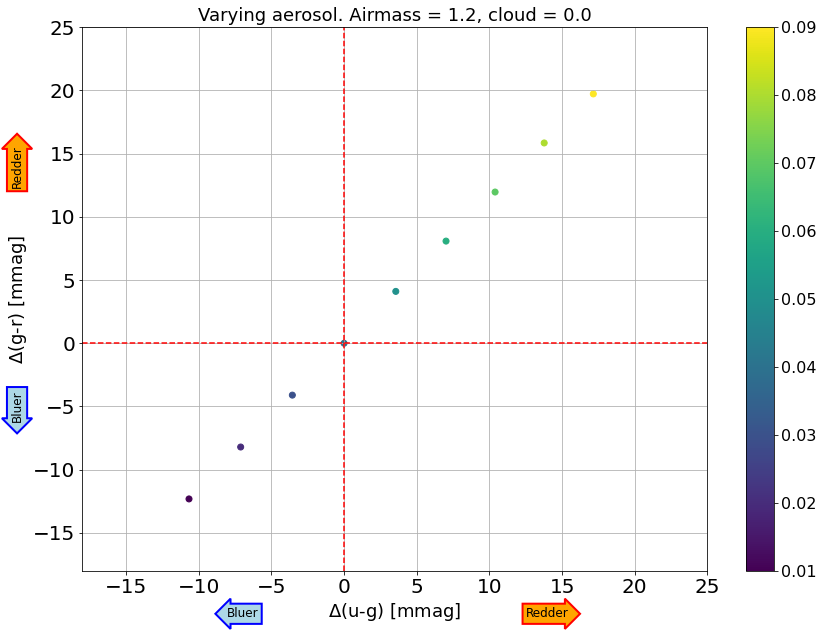

In [194]:
colorx = 'u-g'
colory = 'g-r'
plt.figure(figsize=(14,10))
delta1 = (colour_dict[test_type][test_spec][colorx.lower()]-colour_dict_ref[test_type][test_spec][colorx.lower()])*1000.
delta2 = (colour_dict[test_type][test_spec][colory.lower()]-colour_dict_ref[test_type][test_spec][colory.lower()])*1000.
plt.scatter(delta1,delta2,c=atm_vals)
plt.axhline(y=0.,ls='--',color='r')
plt.axvline(x=0.,ls='--',color='r')
plt.grid()
plt.xlim(-18,25)
plt.ylim(-18,25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
plt.ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=16)
plt.text(-22.5,-5.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
plt.text(-22.5,14.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
plt.text(-7.,-21.4,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
plt.text(14.,-21.4,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
plt.title('Varying {0}. Airmass = {1}, cloud = {2}'.format(variable_param,am0,cloud0),fontsize=18)
plt.savefig(os.path.join(outdir_plots,'example_spectrum_colour_colour_plot_varying_{0}_airmass_{1}_cloud_{2}.png'.format(variable_param,am0,cloud0)))

Select Delta_color ranges 

In [88]:
rangex = (-18,25)
rangey = (-18,25)

Now we evaluate the colour - colour plot for all spectra of the example spectral type: 

In [89]:
save_plot = True

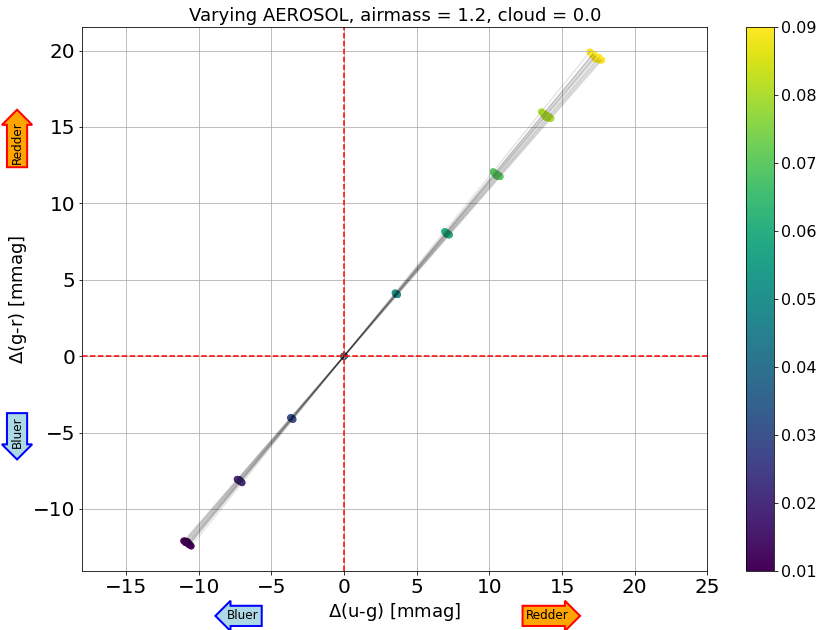

In [189]:
colorx = 'u-g'
colory = 'g-r'
plt.figure(figsize=(14,10))
for si in colour_dict[test_type]:
    delta1 = (colour_dict[test_type][si][colorx.lower()]-colour_dict_ref[test_type][si][colorx.lower()])*1000.
    delta2 = (colour_dict[test_type][si][colory.lower()]-colour_dict_ref[test_type][si][colory.lower()])*1000.
    plt.plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
    plt.scatter(delta1,delta2,c=atm_vals)
plt.axhline(y=0.,ls='--',color='r')
plt.axvline(x=0.,ls='--',color='r')
plt.grid()
plt.xlim(rangex)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
plt.ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=16)

plt.text(-22.5,-5.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
plt.text(-22.5,14.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
plt.text(-7.,-17.,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
plt.text(14.,-17.,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))

if save_plot:
    if variable_param=='airmass' or variable_param=='cloud':
        plt.title('Varying {0}'.format(variable_param.upper()),fontsize=18)
    else:
        plt.title('Varying {0}, airmass = {1}, cloud = {2}'.format(variable_param.upper(),am0,cloud0),fontsize=18)
    if variable_param=='airmass' or variable_param=='cloud':
        plt.savefig(os.path.join(outdir_plots,'spectral_type_{0}_colour_colour_plot_varying{1}.png'.format(test_type,variable_param)))
    else:
        plt.savefig(os.path.join(outdir_plots,'spectral_type_{0}_colour_colour_plot_varying_{1}_airmass_{2}_cloud_{3}.png'.format(test_type,variable_param,am0,cloud0)))


Let's evaluate the same colour - colour plot for the different spectral types: 

O
B
A
F
G
K
M


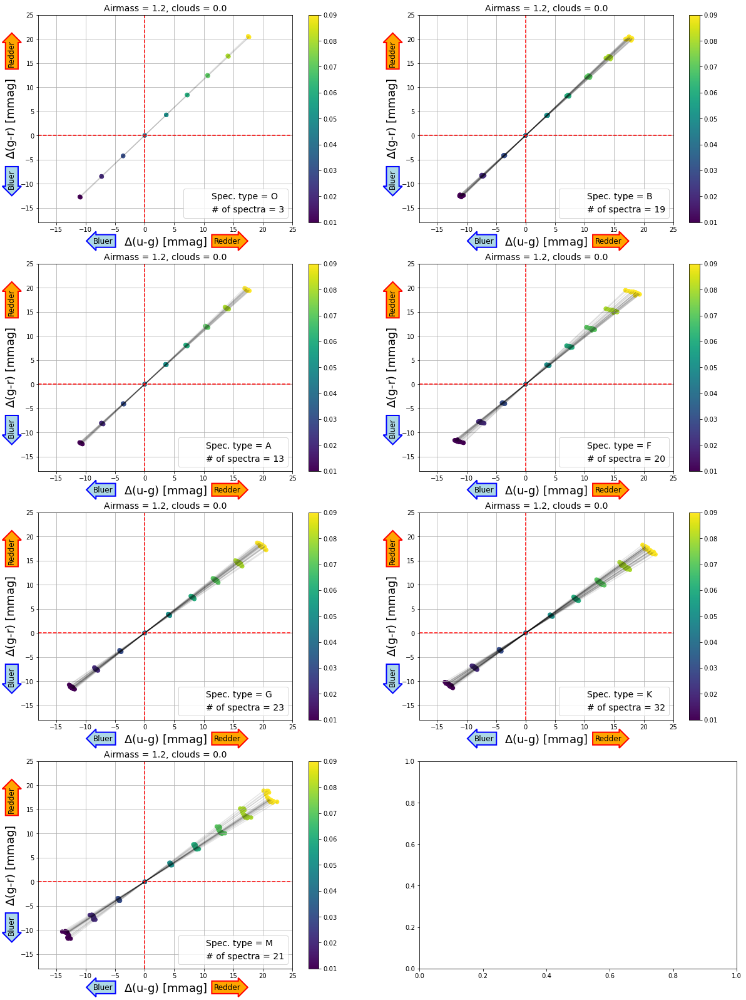

In [182]:
colorx = 'u-g'
colory = 'g-r'

fig_rows = 4
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(20,28))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(spectral_types):
            spec_type = spectral_types[i]
            print(spec_type)
            
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][colorx.lower()]-colour_dict_ref[spec_type][si][colorx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][colory.lower()]-colour_dict_ref[spec_type][si][colory.lower()])*1000.
                if si==0:
                    im = axs[row,col].scatter(delta1,delta2,c=atm_vals)
                else:
                    axs[row,col].scatter(delta1,delta2,c=atm_vals)
                axs[row,col].plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            axs[row,col].set_xlim(rangex)
            axs[row,col].set_ylim(rangey)
            axs[row,col].plot([],[],ls='',label='Spec. type = {0}'.format(spec_type))
            axs[row,col].plot([],[],ls='',label='# of spectra = {0}'.format(len(colour_dict[spec_type].keys())))
            axs[row,col].set_xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
            axs[row,col].set_title('Airmass = {0}, clouds = {1}'.format(am0,cloud0),fontsize=14)
            plt.colorbar(im, ax=axs[row,col])
            axs[row,col].legend(fontsize=14)
            
            axs[row,col].text(-22.5,-9.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
            axs[row,col].text(-22.5,17.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
            axs[row,col].text(-7.,-21.9,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
            axs[row,col].text(14.,-21.9,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
            
            i += 1


Now we evaluate the different colour - colour plots for the example spectral type: 

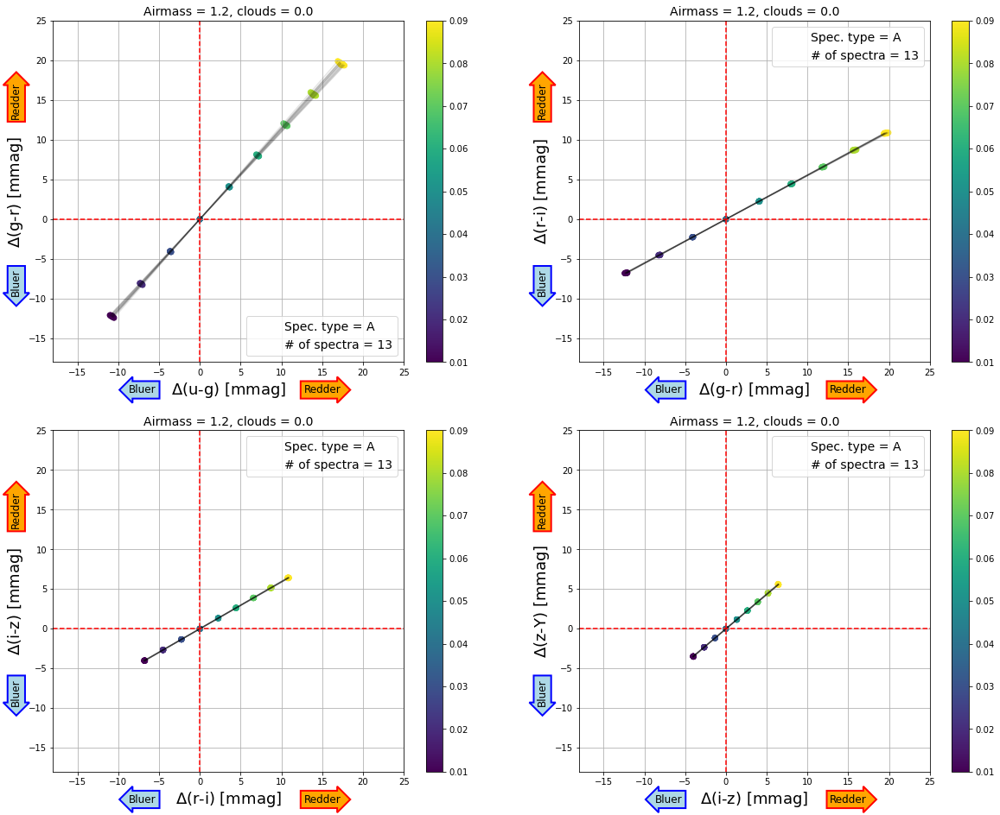

In [175]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(20,16))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            for si in colour_dict[test_type]:
                delta1 = (colour_dict[test_type][si][cx.lower()]-colour_dict_ref[test_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[test_type][si][cy.lower()]-colour_dict_ref[test_type][si][cy.lower()])*1000.
                if si==0:
                    im = axs[row,col].scatter(delta1,delta2,c=atm_vals)
                else:
                    axs[row,col].scatter(delta1,delta2,c=atm_vals)
                axs[row,col].plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            axs[row,col].set_xlim(rangex)
            axs[row,col].set_ylim(rangey)
            
            #axs[row,col].set_xlim(-0.012,0.021)
            #axs[row,col].set_ylim(-0.065,0.126)
            axs[row,col].plot([],[],ls='',label='Spec. type = {0}'.format(test_type))
            axs[row,col].plot([],[],ls='',label='# of spectra = {0}'.format(len(colour_dict[test_type].keys())))
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
            axs[row,col].set_title('Airmass = {0}, clouds = {1}'.format(am0,cloud0),fontsize=14)
            plt.colorbar(im, ax=axs[row,col])
            axs[row,col].legend(fontsize=14)
            
            axs[row,col].text(-22.5,-8.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
            axs[row,col].text(-22.5,15.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
            axs[row,col].text(-7.,-21.5,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
            axs[row,col].text(15.,-21.5,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
            
            i += 1

Let's have a look now at the colour-colour plots for all spectral types together 

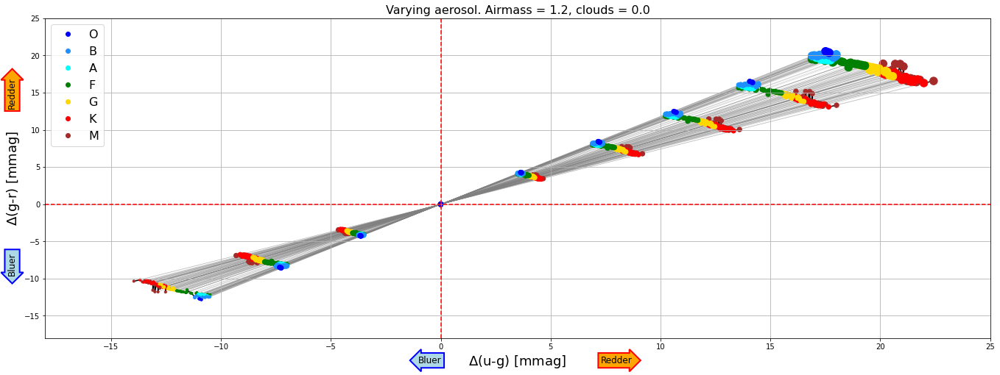

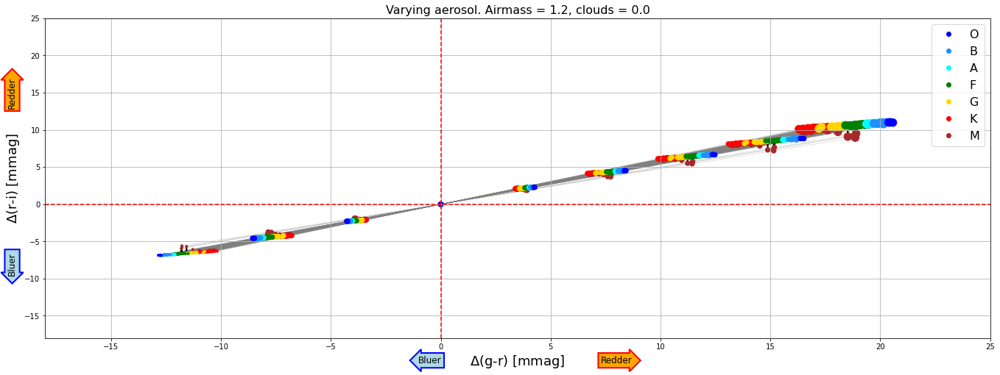

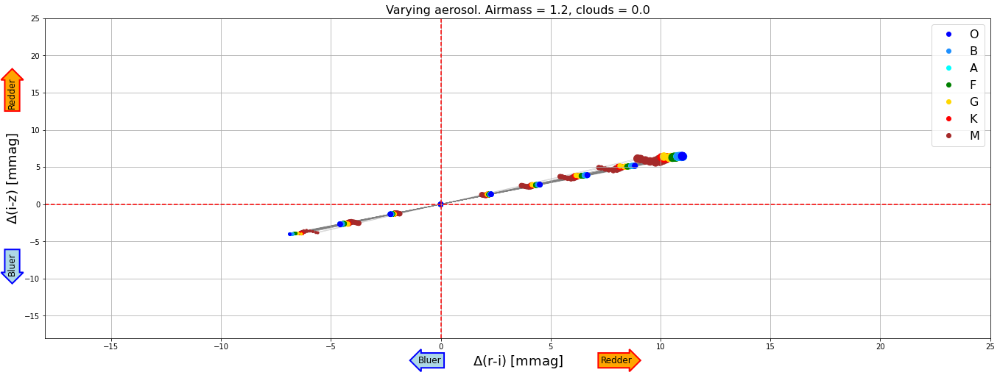

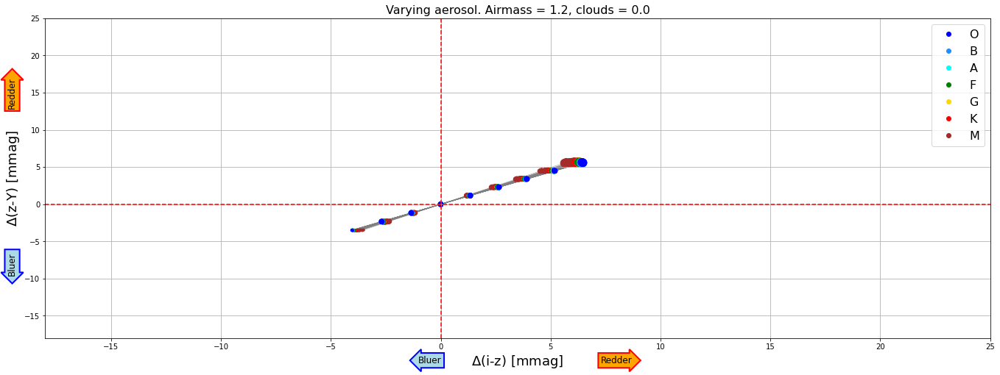

In [166]:
fig_rows = len(filters)-2
i = 0
for row in range(fig_rows):
    fig, axs = plt.subplots(1, 1, figsize=(23,8))
    if i<len(filters)-2:
        cx = '{0}-{1}'.format(filters[i],filters[i+1])
        cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1)
                iso_vals2.append(delta2)
                    
                axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        for spec_type in spectral_types:
            axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
            
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        #axs.set_xticks(fontsize=20)
        #axs.set_yticks(fontsize=20)
        axs.set_xlim(rangex)
        axs.set_ylim(rangey)
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
        axs.legend(fontsize=16)
        
        axs.text(-19.5,-8.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(-19.5,15.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        axs.text(-0.5,-21.,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(8.,-21.,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        
        i += 1
    plt.savefig(os.path.join(outdir_plots,'{3}_{4}_plot_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0,cx,cy)))

# Calculate colour evolution for SN Ia spectra 

We use the SNe Ia spectra from https://github.com/rhiannonlynne/photometry_sample/tree/main/sn 

In [94]:
sne_path = 'data/SNIa_spectra/'
sn1_data = np.loadtxt(os.path.join(sne_path,'sn1a_10.0.dat'))
sn2_data = np.loadtxt(os.path.join(sne_path,'sn1a_15.0.dat'))
sn3_data = np.loadtxt(os.path.join(sne_path,'sn1a_20.0.dat'))

The wavelengths are in nm and the fluxes in erg/s/cm2/nm, so we need to change the units to angstrom and photlam = #photons/s/cm2/angstrom (pysynphot assumes that the input fluxes are in photlam). For this, we need to remember that the conversion between flam (erg/s/cm2/angstrom) and photlam is given by 

$$ photlam = \frac{\lambda}{h \cdot c} flam $$

In [95]:
sn1wave = sn1_data[:,0]*10.
sn2wave = sn2_data[:,0]*10.
sn3wave = sn3_data[:,0]*10.

sn1flux = sn1_data[:,1]*sn1wave/(h_planck*c_light)
sn2flux = sn2_data[:,1]*sn2wave/(h_planck*c_light)
sn3flux = sn3_data[:,1]*sn3wave/(h_planck*c_light)

In [96]:
sn1 = S.ArraySpectrum(sn1wave,sn1flux,name='sn1a_10.0')
sn2 = S.ArraySpectrum(sn2wave,sn2flux,name='sn1a_15.0')
sn3 = S.ArraySpectrum(sn3wave,sn3flux,name='sn1a_20.0')

In [97]:
sn1.waveunits, sn1.fluxunits

(<pysynphot.units.Angstrom at 0x7f8bd9819d00>,
 <pysynphot.units.Photlam at 0x7f8bd98194c0>)

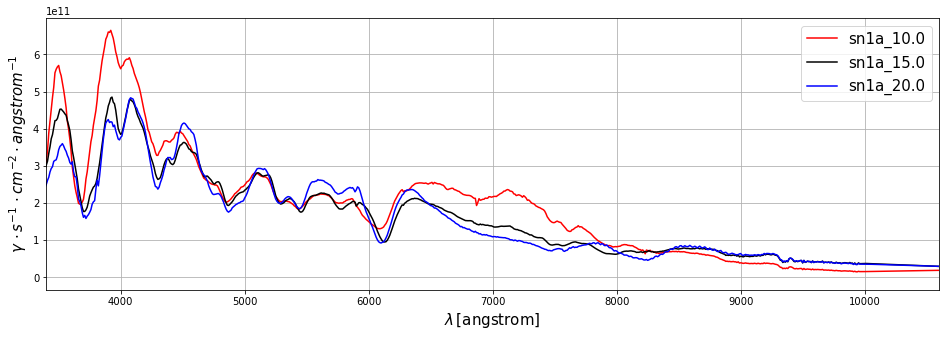

In [98]:
fig=plt.figure(figsize=(16,5))
plt.plot(sn1.wave,sn1.flux,color='r',label=sn1.name)
plt.plot(sn2.wave,sn2.flux,color='k',label=sn2.name)
plt.plot(sn3.wave,sn3.flux,color='b',label=sn3.name)
plt.xlim(WLMIN,WLMAX)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot s^{-1} \, \cdot cm^{-2} \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=15)

Now we pass the SNIa spectra through the total passbands, as with the calibration spectra 

In [99]:
sn_list = [sn1,sn2,sn3]

In [100]:
# SNe Ia through atm x throughput 
sn_obs_dict = {}
for si,spec in enumerate(sn_list):
    filter_dict_ = {}
    for filter in filters:
        filter_dict_[filter] = []
        for i in range(n_sim):
            obs_spec = S.Observation(spec,total_passband[filter][i],force='taper')
            filter_dict_[filter].append(obs_spec)
    sn_obs_dict[si] = filter_dict_ 


((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

In [101]:
print(len(sn_obs_dict.keys()))
print(len(sn_obs_dict[0].keys()))
print(len(sn_obs_dict[0]['u']))

3
6
9


In [102]:
# SNe Ia only through throughput (as if telescope was in space) 
sn_obs_dict_t = {}
for si,spec in enumerate(sn_list):
    filter_dict_ = {}
    for filter in lsst_bp:
        obs_spec_t = S.Observation(spec,filter,force='taper')
        filter_dict_[filter.name] = obs_spec_t
    sn_obs_dict_t[si] = filter_dict_ 
    

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in

In [103]:
print(len(sn_obs_dict_t.keys()))
print(len(sn_obs_dict_t[0].keys()))
print(sn_obs_dict_t[0]['u'].flux)

3
6
[0. 0. 0. ... 0. 0. 0.]


Text(0.5, 1.0, 'Varying aerosol. Airmass = 1.2, clouds = 0.0')

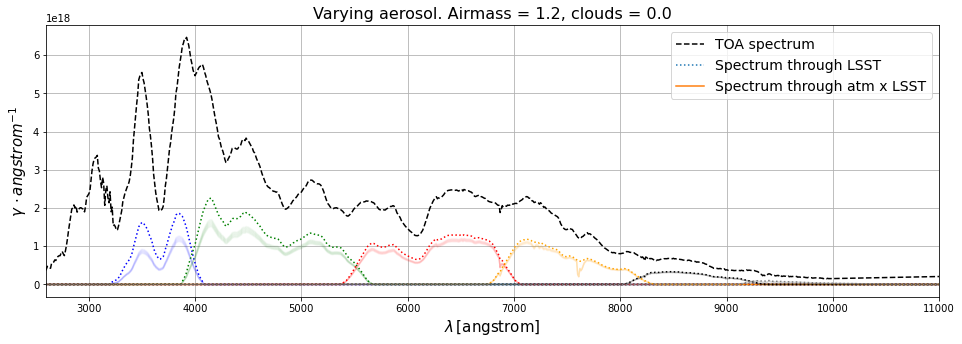

In [104]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(sn_list[0].wave,sn_list[0].flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(sn_obs_dict_t[0][filter].wave,sn_obs_dict_t[0][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = sn_obs_dict[0][filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)
    
plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)

We zoom in to see the effect of the different atmospheric transparencies 

Text(0.5, 1.0, 'Varying aerosol. Airmass = 1.2, clouds = 0.0')

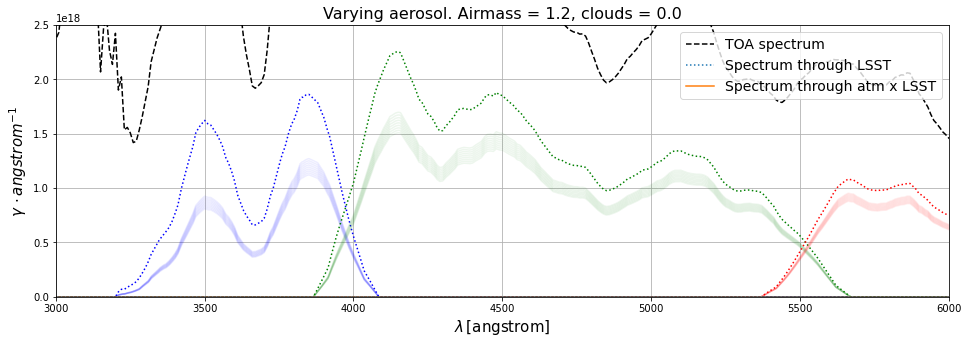

In [105]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(sn_list[0].wave,sn_list[0].flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(sn_obs_dict_t[0][filter].wave,sn_obs_dict_t[0][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = sn_obs_dict[0][filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.07)
    
plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(3000.,6000.)
plt.ylim(0,2.5e18)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)

We can now calculate the magnitudes and colours 

In [106]:
# Magnitudes of spectra passing through atm x throughput 
sn_mag_dict = {}
sn_mag_dict_ref = {}
sn_mag_err_dict = {}
sn_mag_err_dict_ref = {}
for si,obs_spec_ in enumerate(sn_list):
    mag_dict_ = {}
    mag_dict_ref_ = {}
    mag_err_dict_ = {}
    mag_err_dict_ref_ = {}
    for fi,filter in enumerate(filters):
        mag_dict_[filter] = []
        mag_err_dict_[filter] = []
        for i in range(n_sim):
            #mag_dict_[filter].append(obs_spec_[filter][i].effstim("abmag"))
            if calc_mag_err:
                mag_ab_, mag_err_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi],return_error=True)
                mag_err_dict_[filter].append(mag_err_ab_)
            else:
                mag_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi])
            mag_dict_[filter].append(mag_ab_)
            
        #mag_dict[sed_] = mag_dict_
        
        if calc_mag_err:
            mag_ab_, mag_err_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi],return_error=True)
            mag_err_dict_ref_[filter] = mag_err_ab_
        else:
            mag_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi])
        mag_dict_ref_[filter] = mag_ab_
    sn_mag_dict[si] = mag_dict_
    sn_mag_dict_ref[si] = mag_dict_ref_
    sn_mag_err_dict[si] = mag_err_dict_
    sn_mag_err_dict_ref[si] = mag_err_dict_ref_

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 5.24e+20
Numerator = 5.24e+20
Variance of the numerator = 9.58e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.573877005476774
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 5.16e+20
Numerator = 5.16e+20
Variance of the numerator = 9.27e+1

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.780013078152383
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 1.66e+21
Numerator = 1.66e+21
Variance of the numerator = 5.82e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.765869849404783
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_

n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 9.05e+20
Numerator = 9.05e+20
Variance of the numerator = 4.07e+20
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.74574898328106
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 8.98e+20
Numerator = 8.98e+20
Variance of the numerator = 4.01e+20
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.738088086366

n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 2.59e+20
Numerator = 2.59e+20
Variance of the numerator = 1.07e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -19.809766507619308
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 2.57e+20
Numerator = 2.57e+20
Variance of the numerator = 1.06e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -19.80311733352

n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 4.00e+20
Numerator = 4.00e+20
Variance of the numerator = 6.90e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.280324490788928
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 3.93e+20
Numerator = 3.93e+20
Variance of the numerator = 6.68e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.26264452329

n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 1.49e+21
Numerator = 1.49e+21
Variance of the numerator = 5.08e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.6446926460274
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 1.59e+21
Numerator = 1.59e+21
Variance of the numerator = 5.77e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.7147526958652

n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 5.65e+20
Numerator = 5.65e+20
Variance of the numerator = 2.44e+20
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.234716751662518
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 5.61e+20
Numerator = 5.61e+20
Variance of the numerator = 2.41e+20
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.22692887375

Denominator = 3.08e+12
AB magnitude =  -20.033659648175203
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 1.10e+20
Numerator = 1.10e+20
Variance of the numerator = 2.46e+19
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -19.562721588959175
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectron

n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 3.29e+20
Numerator = 3.29e+20
Variance of the numerator = 5.41e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.06764628718901
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 3.23e+20
Numerator = 3.23e+20
Variance of the numerator = 5.24e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.050244696846

n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 1.17e+21
Numerator = 1.17e+21
Variance of the numerator = 5.11e+20
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.700191590529077
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 1.16e+21
Numerator = 1.16e+21
Variance of the numerator = 5.02e+20
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.69034029885

n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 4.79e+20
Numerator = 4.79e+20
Variance of the numerator = 2.04e+20
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.05501086363217
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 4.75e+20
Numerator = 4.75e+20
Variance of the numerator = 2.01e+20
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.047135198837

n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 1.08e+20
Numerator = 1.08e+20
Variance of the numerator = 2.39e+19
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -19.544813681265016
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 1.08e+20
Numerator = 1.08e+20
Variance of the numerator = 2.37e+19
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -19.53971385490

In [107]:
print(len(sn_mag_dict.keys()))
print(len(sn_mag_dict[0].keys()))
print(len(sn_mag_dict[0]['u']))

3
6
9


In [108]:
sn_colour_dict = {}
sn_colour_err_dict = {}
for sn in sn_mag_dict.keys():
    c_dict = {}
    c_err_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(sn_mag_dict[sn][filters[fi]])
        mag2 = np.array(sn_mag_dict[sn][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        if calc_mag_err:
            err_mag1 = np.array(sn_mag_err_dict[sn][filters[fi]])
            err_mag2 = np.array(sn_mag_err_dict[sn][filters[fi+1]])
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
        if calc_mag_err:
            err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
            c_err_dict[colour_name] = err_colour_
    sn_colour_dict[sn] = c_dict
    sn_colour_err_dict[sn] = c_err_dict


In [109]:
print(len(sn_mag_dict.keys()))
print(len(sn_colour_dict.keys()))
print(len(sn_colour_dict[0].keys()))
print(len(sn_colour_dict[0]['u-g']))

3
3
5
9


In [110]:
sn_colour_dict_ref = {}
sn_colour_err_dict_ref = {}
for sn in sn_mag_dict_ref.keys():
    c_dict = {}
    c_err_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(sn_mag_dict_ref[sn][filters[fi]])
        mag2 = np.array(sn_mag_dict_ref[sn][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        if calc_mag_err:
            err_mag1 = np.array(sn_mag_err_dict_ref[sn][filters[fi]])
            err_mag2 = np.array(sn_mag_err_dict_ref[sn][filters[fi+1]])
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
        if calc_mag_err:
            err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
            c_err_dict[colour_name] = err_colour_
    sn_colour_dict_ref[sn] = c_dict
    sn_colour_err_dict_ref[sn] = c_err_dict
    

In [111]:
print(len(sn_mag_dict_ref.keys()))
print(len(sn_colour_dict_ref.keys()))
print(len(sn_colour_dict_ref[0].keys()))
print(sn_colour_dict_ref[0]['u-g'])

3
3
5
0.273046167203578


In [112]:
np.save('output_files/sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),sn_colour_dict)
np.save('output_files/sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),sn_colour_dict_ref)
if calc_mag_err:
    np.save('output_files/sn_colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),sn_colour_err_dict)
    np.save('output_files/sn_colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),sn_colour_err_dict_ref)

In [113]:
rangex2 = (-25,30)
rangey2 = (-25,30)

Now we add the evolution of the flat spectrum, for reference 

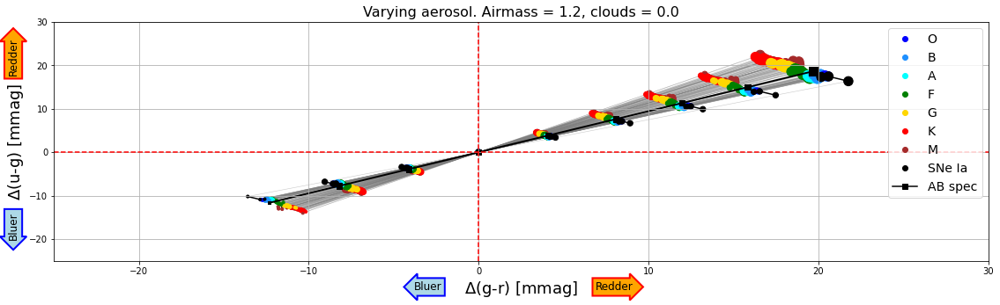

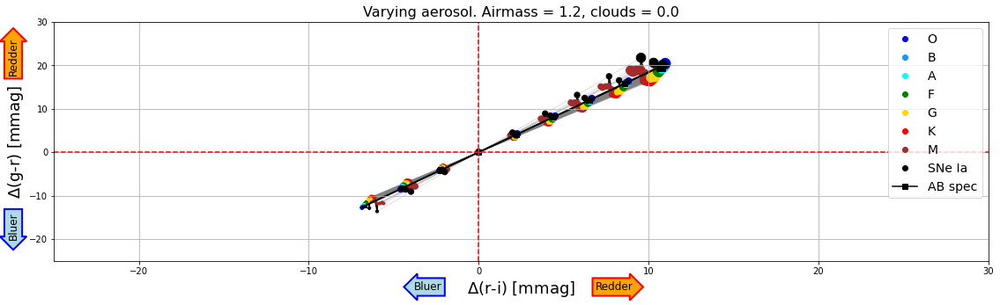

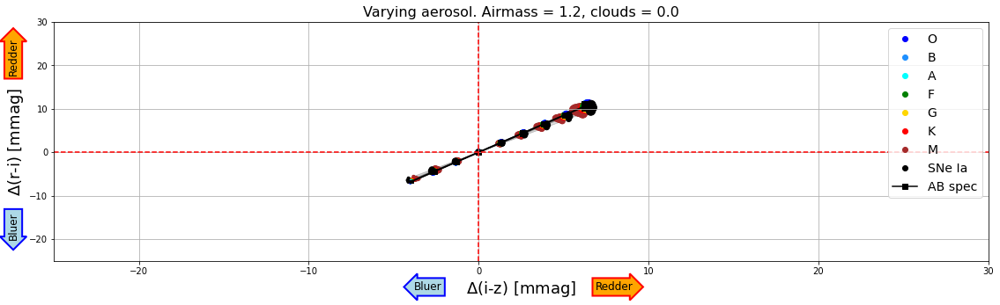

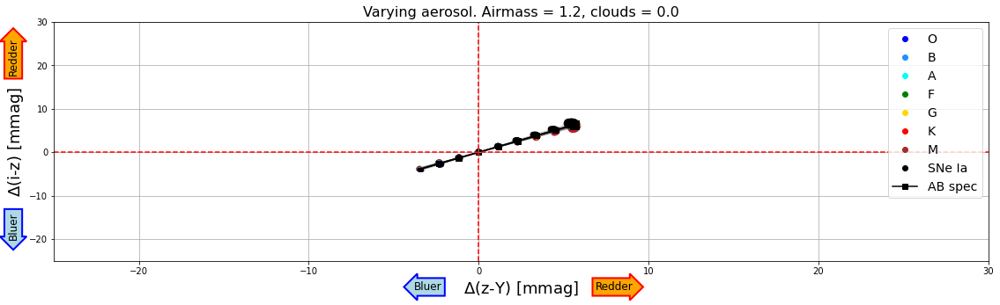

In [152]:
fig_rows = len(filters)-2
i = 0
for row in range(fig_rows):
    fig, axs = plt.subplots(1, 1, figsize=(19,5))
    if i<len(filters)-2:
        cy = '{0}-{1}'.format(filters[i],filters[i+1])#################
        cx = '{0}-{1}'.format(filters[i+1],filters[i+2])#################
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1)
                iso_vals2.append(delta2)
                    
                axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        for spec_type in spectral_types:
            axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
            
        for sn in sn_colour_dict.keys():
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_sn)
                iso_vals2.append(delta2_sn)
                
                axs.scatter(delta1_sn,delta2_sn,c='k',marker='o',s=msize)
                axs.plot(delta1_sn,delta2_sn,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        axs.plot([],[],c='k',ls='',marker='o',label='SNe Ia')    
        
        delta1_flat = (flat_colour_dict[cx.lower()]-flat_colour_dict_ref[cx.lower()])*1000.
        delta2_flat = (flat_colour_dict[cy.lower()]-flat_colour_dict_ref[cy.lower()])*1000.
        axs.scatter(delta1_flat,delta2_flat,c='k',marker='s',s=msize)
        axs.plot(delta1_flat,delta2_flat,ls='-',linewidth=2.0,marker='',color='k',alpha=1.0,zorder=1)
        axs.plot([],[],c='k',ls='-',marker='s',label='AB spec')
        
        
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        #axs.set_xticks(fontsize=20)
        #axs.set_yticks(fontsize=20)
        axs.set_xlim(rangey2)#################
        axs.set_ylim(rangex2)#################
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
        axs.legend(fontsize=14)
        
        axs.text(-27.4,-17.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(-27.4,22.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        axs.text(-3.,-31.,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(8.,-31.,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        i += 1
    plt.savefig(os.path.join(outdir_plots,'{3}_{4}_plot_varying_{0}_airmass_{1}_clouds_{2}_sn_flat_spectrum.png'.format(variable_param,am0,cloud0,cx,cy)))

# Redshift the SN Ia spectra 

In [115]:
redshifts = np.linspace(0.1,1.0,10)
print(redshifts)

[0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]


In [116]:
redshift_colors = {0.1:'b',0.2:'dodgerblue',0.3:'cyan',0.4:'g',0.5:'gold',0.6:'r',0.7:'brown',0.8:'grey',0.9:'darkgrey',1.0:'k'}

Apply redshift to the spectrum of one of the SN Ia 

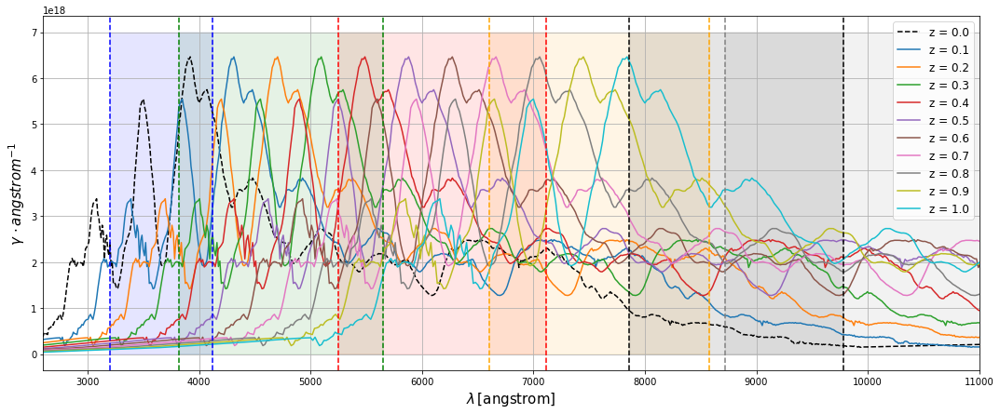

In [117]:
fig=plt.figure(figsize=(18,7))
ax = fig.add_subplot(111)
rs_dict = {}
plt.plot(sn1.wave,sn1.flux*Seff*exptime,ls='--',color='k',label='z = 0.0')
for redshift in redshifts:
    sn1_z = sn1.redshift(redshift)
    plt.plot(sn1_z.wave,sn1_z.flux*Seff*exptime,label='z = {0:.1f}'.format(redshift))
    rs_dict[round(redshift,1)] = sn1_z
    
# Approximate integration limits of each total passband. Note that there is some overlap 
plt.axvline(x=3200,ls='--',color=filter_colors[0])
plt.axvline(x=4120,ls='--',color=filter_colors[0])
plt.fill_between(np.arange(3200,4120),np.ones(len(np.arange(3200,4120)))*7e18,color=filter_colors[0],alpha=0.1)

plt.axvline(x=3820,ls='--',color=filter_colors[1])
plt.axvline(x=5650,ls='--',color=filter_colors[1])
plt.fill_between(np.arange(3820,5650),np.ones(len(np.arange(3820,5650)))*7e18,color=filter_colors[1],alpha=0.1)

plt.axvline(x=5250,ls='--',color=filter_colors[2])
plt.axvline(x=7110,ls='--',color=filter_colors[2])
plt.fill_between(np.arange(5250,7110),np.ones(len(np.arange(5250,7110)))*7e18,color=filter_colors[2],alpha=0.1)

plt.axvline(x=6600,ls='--',color=filter_colors[3])
plt.axvline(x=8580,ls='--',color=filter_colors[3])
plt.fill_between(np.arange(6600,8580),np.ones(len(np.arange(6600,8580)))*7e18,color=filter_colors[3],alpha=0.1)

plt.axvline(x=7860,ls='--',color=filter_colors[4])
plt.axvline(x=9780,ls='--',color=filter_colors[4])
plt.fill_between(np.arange(7860,9780),np.ones(len(np.arange(7860,9780)))*7e18,color=filter_colors[4],alpha=0.1)

plt.axvline(x=8720,ls='--',color=filter_colors[5])
plt.axvline(x=12000,ls='--',color=filter_colors[5])
plt.fill_between(np.arange(8720,12000),np.ones(len(np.arange(8720,12000)))*7e18,color=filter_colors[5],alpha=0.1)

plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=12)

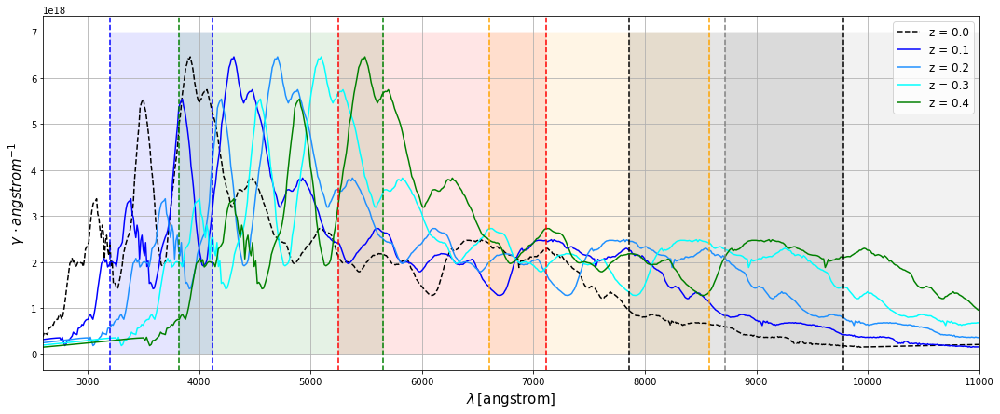

In [118]:
fig=plt.figure(figsize=(18,7))
ax = fig.add_subplot(111)
plt.plot(sn1.wave,sn1.flux*Seff*exptime,ls='--',color='k',label='z = 0.0')
for redshift in redshifts[:4]:
    sn1_z = sn1.redshift(redshift)
    plt.plot(sn1_z.wave,sn1_z.flux*Seff*exptime,color=redshift_colors[np.round(redshift,1)],label='z = {0:.1f}'.format(redshift))
    

# Approximate integration limits of each total passband. Note that there is some overlap 
plt.axvline(x=3200,ls='--',color=filter_colors[0])
plt.axvline(x=4120,ls='--',color=filter_colors[0])
plt.fill_between(np.arange(3200,4120),np.ones(len(np.arange(3200,4120)))*7e18,color=filter_colors[0],alpha=0.1)

plt.axvline(x=3820,ls='--',color=filter_colors[1])
plt.axvline(x=5650,ls='--',color=filter_colors[1])
plt.fill_between(np.arange(3820,5650),np.ones(len(np.arange(3820,5650)))*7e18,color=filter_colors[1],alpha=0.1)

plt.axvline(x=5250,ls='--',color=filter_colors[2])
plt.axvline(x=7110,ls='--',color=filter_colors[2])
plt.fill_between(np.arange(5250,7110),np.ones(len(np.arange(5250,7110)))*7e18,color=filter_colors[2],alpha=0.1)

plt.axvline(x=6600,ls='--',color=filter_colors[3])
plt.axvline(x=8580,ls='--',color=filter_colors[3])
plt.fill_between(np.arange(6600,8580),np.ones(len(np.arange(6600,8580)))*7e18,color=filter_colors[3],alpha=0.1)

plt.axvline(x=7860,ls='--',color=filter_colors[4])
plt.axvline(x=9780,ls='--',color=filter_colors[4])
plt.fill_between(np.arange(7860,9780),np.ones(len(np.arange(7860,9780)))*7e18,color=filter_colors[4],alpha=0.1)

plt.axvline(x=8720,ls='--',color=filter_colors[5])
plt.axvline(x=12000,ls='--',color=filter_colors[5])
plt.fill_between(np.arange(8720,12000),np.ones(len(np.arange(8720,12000)))*7e18,color=filter_colors[5],alpha=0.1)


plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=12)

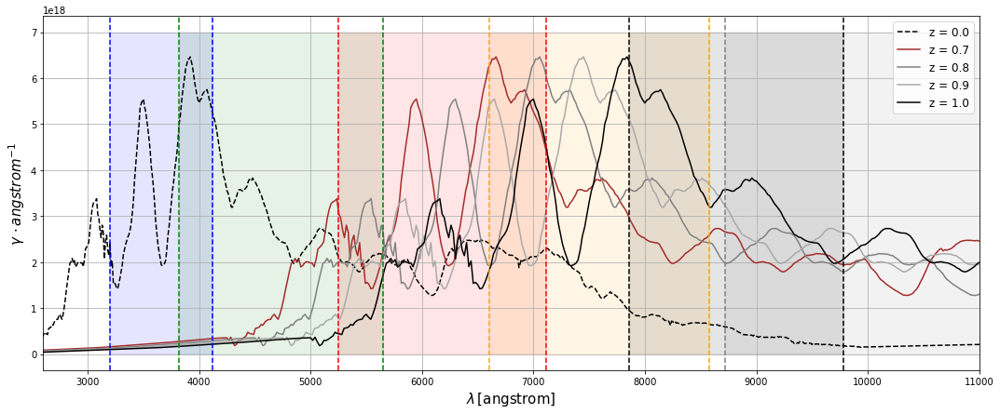

In [119]:
fig=plt.figure(figsize=(18,7))
ax = fig.add_subplot(111)
plt.plot(sn1.wave,sn1.flux*Seff*exptime,ls='--',color='k',label='z = 0.0')
for redshift in redshifts[6:]:
    sn1_z = sn1.redshift(redshift)
    plt.plot(sn1_z.wave,sn1_z.flux*Seff*exptime,color=redshift_colors[np.round(redshift,1)],label='z = {0:.1f}'.format(redshift))
    

# Approximate integration limits of each total passband. Note that there is some overlap 
plt.axvline(x=3200,ls='--',color=filter_colors[0])
plt.axvline(x=4120,ls='--',color=filter_colors[0])
plt.fill_between(np.arange(3200,4120),np.ones(len(np.arange(3200,4120)))*7e18,color=filter_colors[0],alpha=0.1)

plt.axvline(x=3820,ls='--',color=filter_colors[1])
plt.axvline(x=5650,ls='--',color=filter_colors[1])
plt.fill_between(np.arange(3820,5650),np.ones(len(np.arange(3820,5650)))*7e18,color=filter_colors[1],alpha=0.1)

plt.axvline(x=5250,ls='--',color=filter_colors[2])
plt.axvline(x=7110,ls='--',color=filter_colors[2])
plt.fill_between(np.arange(5250,7110),np.ones(len(np.arange(5250,7110)))*7e18,color=filter_colors[2],alpha=0.1)

plt.axvline(x=6600,ls='--',color=filter_colors[3])
plt.axvline(x=8580,ls='--',color=filter_colors[3])
plt.fill_between(np.arange(6600,8580),np.ones(len(np.arange(6600,8580)))*7e18,color=filter_colors[3],alpha=0.1)

plt.axvline(x=7860,ls='--',color=filter_colors[4])
plt.axvline(x=9780,ls='--',color=filter_colors[4])
plt.fill_between(np.arange(7860,9780),np.ones(len(np.arange(7860,9780)))*7e18,color=filter_colors[4],alpha=0.1)

plt.axvline(x=8720,ls='--',color=filter_colors[5])
plt.axvline(x=12000,ls='--',color=filter_colors[5])
plt.fill_between(np.arange(8720,12000),np.ones(len(np.arange(8720,12000)))*7e18,color=filter_colors[5],alpha=0.1)


plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=12)

Compute fluxes through atm x throughput 

In [120]:
# redshifted SN Ia through atm x throughput 
rs_sn_obs_dict = {}
for key in rs_dict.keys():
    spec = rs_dict[key]
    filter_dict_ = {}
    for filter in filters:
        filter_dict_[filter] = []
        for i in range(n_sim):
            obs_spec = S.Observation(spec,total_passband[filter][i],force='taper')
            filter_dict_[filter].append(obs_spec)
    rs_sn_obs_dict[key] = filter_dict_ 


((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

In [121]:
# redshifted SN Ia only through throughput (as if telescope was in space) 
rs_sn_obs_dict_t = {}
for key in rs_dict.keys():
    spec = rs_dict[key]
    filter_dict_ = {}
    for filter in lsst_bp:
        obs_spec_t = S.Observation(spec,filter,force='taper')
        filter_dict_[filter.name] = obs_spec_t
    rs_sn_obs_dict_t[key] = filter_dict_ 
    

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in

Text(0.5, 1.0, 'Varying aerosol. Airmass = 1.2, clouds = 0.0')

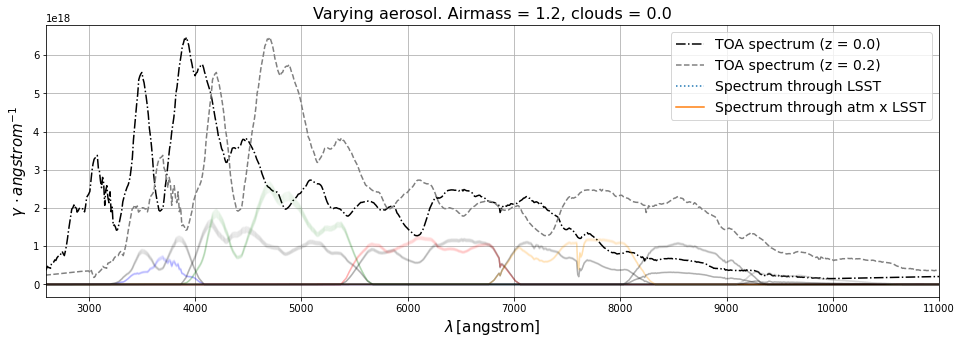

In [122]:
test_rs = 0.2
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(sn1.wave,sn1.flux*Seff*exptime,ls='-.',color='k',label='TOA spectrum (z = 0.0)')
plt.plot(rs_dict[test_rs].wave,rs_dict[test_rs].flux*Seff*exptime,ls='--',color='grey',label='TOA spectrum (z = {0})'.format(test_rs))

for index,filter in enumerate(filters):
    #plt.plot(sn_obs_dict_t[0][filter].wave,sn_obs_dict_t[0][filter].flux*Seff*exptime,ls=':',color='k')
    #plt.plot(rs_sn_obs_dict_t[test_rs][filter].wave,rs_sn_obs_dict_t[test_rs][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        obs_0 = sn_obs_dict[0][filter][i]
        obs_ = rs_sn_obs_dict[test_rs][filter][i]
        plt.plot(obs_0.wave,obs_0.flux*Seff*exptime,ls='-',color='k',alpha=0.04)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)
    
plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)

Now we calculate the magnitudes and colours 

In [123]:
# Magnitudes of spectra passing through atm x throughput 
rs_sn_mag_dict = {}
rs_sn_mag_dict_ref = {}
for key in rs_dict.keys():
    obs_spec_ = rs_dict[key]
    mag_dict_ = {}
    mag_dict_ref_ = {}
    for fi,filter in enumerate(filters):
        mag_dict_[filter] = []
        for i in range(n_sim):
            #mag_dict_[filter].append(obs_spec_[filter][i].effstim("abmag"))
            mag_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi])
            mag_dict_[filter].append(mag_ab_)
            
        #mag_dict[sed_] = mag_dict_
        
        mag_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi])
        mag_dict_ref_[filter] = mag_ab_
    rs_sn_mag_dict[key] = mag_dict_
    rs_sn_mag_dict_ref[key] = mag_dict_ref_

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.07e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.300001736390904
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.01e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.282438018212503
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Ob

(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.133548192007126
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.93e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -20.50905826079342
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.90e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitud

Numerator = 1.32e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -19.76169147049666
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.84e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -19.907624773523
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.79e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.

Numerator = 2.44e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -21.181498287383253
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.47e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.94465828014826
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.46e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 1.21e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.056938393698424
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.10e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.175110597851436
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.04e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 1.95e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -19.498814247541894
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.92e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -19.48147150309026
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.89e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 1.07e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.923348747892344
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.10e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.96208396358115
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.10e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 1.85e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.88238331881332
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.83e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.86909379700557
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.95e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 

Numerator = 1.25e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.100635899904965
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.25e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.092796032761235
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.29e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 1.49e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.646613886422934
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.47e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.63336540833714
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.46e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 1.36e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.1850033671834
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.35e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.177158571017255
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.34e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 

Numerator = 5.85e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -21.376488670537416
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.83e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -21.371033996284737
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.80e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.43051459150653
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.69e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.422929682308364
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.68e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitud

((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.72e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.06461911826841
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.62e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.05177414150686
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.52e+2

Numerator = 5.20e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -21.24681789286203
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.17e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -21.241763137114823
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.15e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 1.93e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -21.237979705719127
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.01e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -21.28647338946292
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.78e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 2.00e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -17.027051977985703
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.97e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -17.009700346205367
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.13e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 1.82e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -21.176344478392537
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.80e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -21.16663689900038
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.89e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 1.42e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.65876135398594
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.46e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.69138212969607
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.19e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 

Denominator = 6.16e+12
AB magnitude =  -20.925991030363413
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.43e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.916268142024194
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.42e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.906545879604298
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in th

In [124]:
rs_sn_colour_dict = {}
for rs in rs_sn_mag_dict.keys():
    c_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(rs_sn_mag_dict[rs][filters[fi]])
        mag2 = np.array(rs_sn_mag_dict[rs][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
    rs_sn_colour_dict[rs] = c_dict

rs_sn_colour_dict_ref = {}
for rs in rs_sn_mag_dict_ref.keys():
    c_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(rs_sn_mag_dict_ref[rs][filters[fi]])
        mag2 = np.array(rs_sn_mag_dict_ref[rs][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
    rs_sn_colour_dict_ref[rs] = c_dict
    

In [125]:
np.save('output_files/rs_sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),rs_sn_colour_dict)
np.save('output_files/rs_sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),rs_sn_colour_dict_ref)

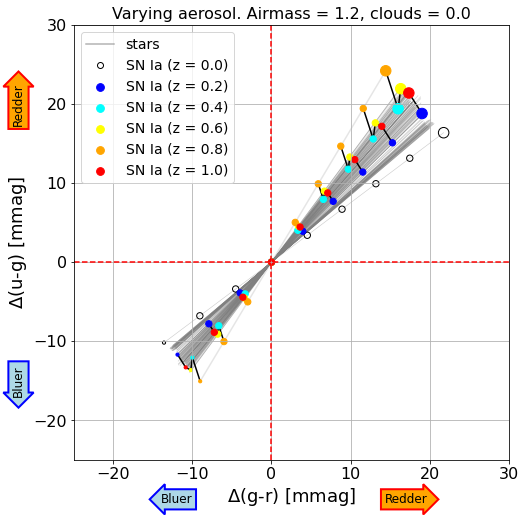

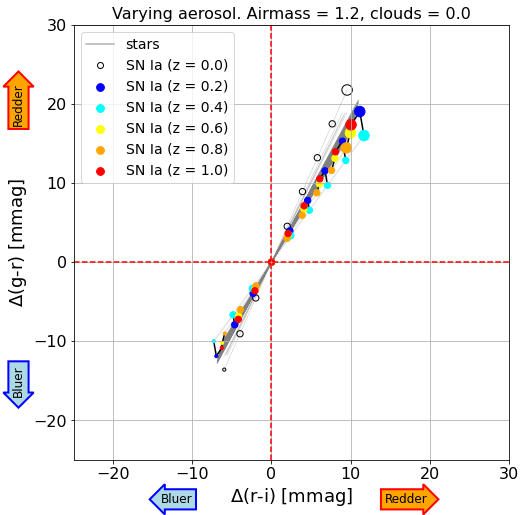

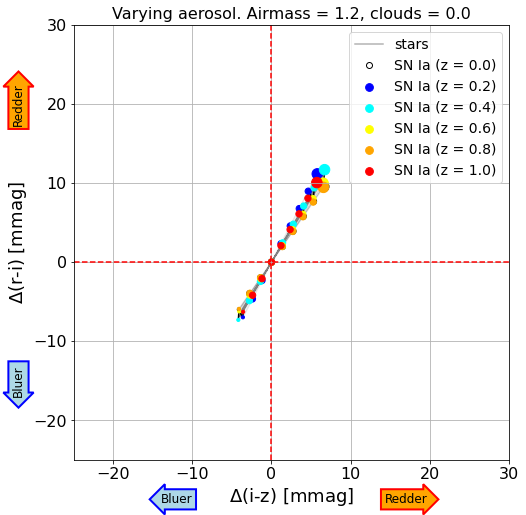

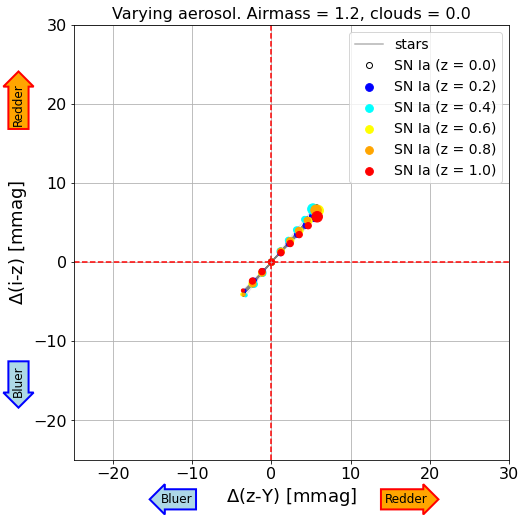

In [140]:
fig_rows = len(filters)-2

sel_sn = 0

redshifts_ = [0.2,0.4,0.6,0.8,1.0]
rs_colors = {0.2:'b',0.4:'cyan',0.6:'yellow',0.8:'orange',1.0:'r'}

i = 0
for row in range(fig_rows):
    fig, axs = plt.subplots(1, 1, figsize=(18,8))
    if i<len(filters)-2:
        cy = '{0}-{1}'.format(filters[i],filters[i+1])
        cx = '{0}-{1}'.format(filters[i+1],filters[i+2])
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                #iso_vals1.append(delta1)
                #iso_vals2.append(delta2)
                    
                #axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
                
        #for spec_type in spectral_types:
        #    axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
        axs.plot([],[],c='grey',ls='-',marker='',alpha=0.6,label='stars')
            
        for si,sn in enumerate(sn_colour_dict.keys()):
            if si==sel_sn:
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                #iso_vals1.append(delta1_sn)
                #iso_vals2.append(delta2_sn)
                
                axs.scatter(delta1_sn,delta2_sn,facecolors='none', edgecolors='k',s=msize)
                #else:
                #    axs.scatter(delta1_sn,delta2_sn,c='k',marker='o',s=msize)
                
                axs.plot(delta1_sn,delta2_sn,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        axs.plot([],[],c='k',ls='',marker='o',fillstyle='none',label='SN Ia (z = 0.0)')    
        
        #for rs in rs_sn_colour_dict.keys():
        for rs in redshifts_:
            delta1_rs_sn = (rs_sn_colour_dict[rs][cx.lower()]-rs_sn_colour_dict_ref[rs][cx.lower()])*1000.
            delta2_rs_sn = (rs_sn_colour_dict[rs][cy.lower()]-rs_sn_colour_dict_ref[rs][cy.lower()])*1000.
            msize = [10.]
            msize = msize+[40.]*(len(delta1)-2)
            msize.append(110.)
            
            iso_vals1.append(delta1_rs_sn)
            iso_vals2.append(delta2_rs_sn)
            
            axs.scatter(delta1_rs_sn,delta2_rs_sn,c=rs_colors[rs],marker='o',s=msize,label='SN Ia (z = {0})'.format(rs))
            axs.plot(delta1_rs_sn,delta2_rs_sn,ls='-',marker='',color='grey',alpha=0.2,zorder=-1)
        
        
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        axs.tick_params(axis='x', labelsize=16)
        axs.tick_params(axis='y', labelsize=16)
        axs.set_xlim(rangey2)
        axs.set_ylim(rangex2)
        axs.set_aspect('equal')
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
        axs.legend(fontsize=14)
        
        axs.text(-32.,-15.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(-32.,20.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        axs.text(-12.,-30.,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(17.,-30.,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        
        i += 1

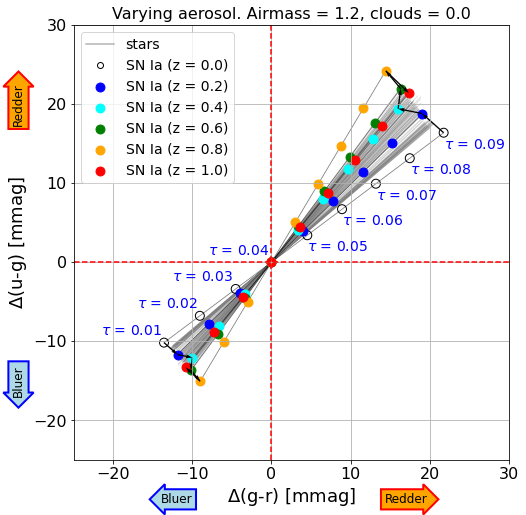

In [139]:
fig_rows = 1

sel_sn = 0

redshifts_ = [0.2,0.4,0.6,0.8,1.0]
rs_colors = {0.2:'b',0.4:'cyan',0.6:'g',0.8:'orange',1.0:'r'}

i = 0
if True:
    if True:
        fig, axs = plt.subplots(1, 1, figsize=(18,8))
        cy = 'u-g'
        cx = 'g-r'
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
                
        axs.plot([],[],c='grey',ls='-',marker='',alpha=0.6,label='stars')
            
        for si,sn in enumerate(sn_colour_dict.keys()):
            if si==sel_sn:
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_sn)
                iso_vals2.append(delta2_sn)
                
                axs.scatter(delta1_sn,delta2_sn,facecolors='none', edgecolors='k',s=80.)
                
                for i in range(len(delta1_sn)):
                    if i<=3:
                        xshift = -8.
                        yshift = 1.
                    else:
                        xshift = 0.
                        yshift = -2.
                    axs.text(delta1_sn[i]+xshift,delta2_sn[i]+yshift,r'$\tau$ = {0:.2f}'.format(atm_vals[i]),color='b',rotation=0,size=14)
                
                axs.plot(delta1_sn,delta2_sn,ls='-',linewidth=0.8,marker='',color='k',alpha=0.5,zorder=-1)
        axs.plot([],[],c='k',ls='',marker='o',fillstyle='none',label='SN Ia (z = 0.0)')    
        
        
        for rs in redshifts_:
            delta1_rs_sn = (rs_sn_colour_dict[rs][cx.lower()]-rs_sn_colour_dict_ref[rs][cx.lower()])*1000.
            delta2_rs_sn = (rs_sn_colour_dict[rs][cy.lower()]-rs_sn_colour_dict_ref[rs][cy.lower()])*1000.
            msize = [10.]
            msize = msize+[40.]*(len(delta1)-2)
            msize.append(110.)
            
            iso_vals1.append(delta1_rs_sn)
            iso_vals2.append(delta2_rs_sn)
            
            axs.scatter(delta1_rs_sn,delta2_rs_sn,c=rs_colors[rs],marker='o',s=80.,label='SN Ia (z = {0})'.format(rs))
            axs.plot(delta1_rs_sn,delta2_rs_sn,ls='-',linewidth=0.8,marker='',color='k',alpha=0.5,zorder=-1)
        
        
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        
        #axs.plot(iso_vals1[:,0],iso_vals2[:,0],ls='-',marker='',color='k',zorder=-1)
        #axs.plot(iso_vals1[:,-1],iso_vals2[:,-1],ls='-',marker='',color='k',zorder=-1)
        
        iso_vals1_min = iso_vals1[:,0]
        iso_vals1_max = iso_vals1[:,-1]
        iso_vals2_min = iso_vals2[:,0]
        iso_vals2_max = iso_vals2[:,-1]
        
        axs.quiver(iso_vals1_min[:-1],iso_vals2_min[:-1],iso_vals1_min[1:]-iso_vals1_min[:-1],iso_vals2_min[1:]-iso_vals2_min[:-1],scale_units='xy',angles='xy',scale=1,width=0.003)
        axs.quiver(iso_vals1_max[:-1],iso_vals2_max[:-1],iso_vals1_max[1:]-iso_vals1_max[:-1],iso_vals2_max[1:]-iso_vals2_max[:-1],scale_units='xy',angles='xy',scale=1,width=0.003)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        axs.tick_params(axis='x', labelsize=16)
        axs.tick_params(axis='y', labelsize=16)
        axs.set_xlim(rangey2)
        axs.set_ylim(rangex2)
        axs.set_aspect('equal')
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
        axs.legend(fontsize=14)
        
        axs.text(-32.,-15.,"Bluer",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(-32.,20.,"Redder",ha="center",va="center",rotation=90.,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        axs.text(-12.,-30.,"Bluer",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="larrow,pad=0.3",fc="lightblue",ec="blue",lw=2))
        axs.text(17.,-30.,"Redder",ha="center",va="center",rotation=0,size=12,
                  bbox=dict(boxstyle="rarrow,pad=0.3",fc="orange",ec="red",lw=2))
        
        i += 1